In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator
import seaborn as sns
import plotly.express as px

%matplotlib inline

In [ ]:
# Set DPI for fugures

plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

In [ ]:
plt.rcParams['font.size'] = 20

In [ ]:
# Drive connection

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Importing Dataset
train = pd.read_csv('/content/drive/Shareddrives/Best Shared Drive Ever/EEG/AMIGO data/Pre-processed/train_data.csv')
test = pd.read_csv('/content/drive/Shareddrives/Best Shared Drive Ever/EEG/AMIGO data/Pre-processed/test_data.csv')

In [ ]:
train.shape

(188160, 89)

In [ ]:
test.shape

(62720, 89)

In [ ]:
train.isnull().sum()

,0
C1B1,7644
C1B2,7644
C1B3,7644
C1B4,7644
C1B5,7644
...,...
C17B5,0
Arousal,0
Valence,0
Domain,0


In [ ]:
test.isnull().sum()

,0
C1B1,2548
C1B2,2548
C1B3,2548
C1B4,2548
C1B5,2548
...,...
C17B5,0
Arousal,0
Valence,0
Domain,0


In [ ]:
train = train.dropna()

In [ ]:
test = test.dropna()

In [ ]:
train.head()

,C1B1,C1B2,C1B3,C1B4,C1B5,C2B1,C2B2,C2B3,C2B4,C2B5,...,C16B5,C17B1,C17B2,C17B3,C17B4,C17B5,Arousal,Valence,Domain,Like
0,6032.203963,2070.106768,1216.516945,1815.165930,3635.199393,3694.507097,3574.162875,1756.016202,1854.715241,3149.295394,...,1720.707369,547315.633702,310068.766287,226399.935106,345957.859101,536622.950865,2.938568,5.0,8.235496,1.0
1,6142.135007,2030.895795,1153.623524,2077.361498,3713.130490,3333.081405,3985.270762,1860.136153,1945.039398,3113.481458,...,1819.429765,558432.194247,314105.068011,211560.654028,352018.931210,499136.097421,2.938568,5.0,8.235496,1.0
2,6296.919958,2380.719155,1421.533980,1952.494141,3597.429572,3594.164016,3917.440527,1835.355634,1927.584364,3028.631835,...,1954.686576,533942.531541,305481.956277,216017.257502,361309.107362,508258.405326,2.938568,5.0,8.235496,1.0
3,10000.558570,3363.297736,1624.655444,1973.876819,3832.957613,4058.075393,3925.681549,1628.863343,1966.655184,2748.728588,...,1805.377073,469186.611218,259972.530560,200458.913917,294224.621002,455248.659617,2.938568,5.0,8.235496,1.0
4,9719.016680,3694.085977,1644.394209,2060.945607,3694.681667,4060.729325,3958.866961,1593.665632,1932.627872,2773.597316,...,1829.290434,388124.548374,250176.157520,176183.793844,266066.352785,334513.743213,2.938568,5.0,8.235496,1.0


In [ ]:
test.head()

,C1B1,C1B2,C1B3,C1B4,C1B5,C2B1,C2B2,C2B3,C2B4,C2B5,...,C16B5,C17B1,C17B2,C17B3,C17B4,C17B5,Arousal,Valence,Domain,Like
0,5905.959753,2070.040811,1215.706842,1877.159163,3625.204684,3339.339978,2780.360546,1606.427979,1689.590342,3111.266306,...,1859.444922,538807.587443,311072.729544,230188.786654,345688.278610,499555.974602,2.938568,5.0,8.235496,1.0
1,10598.914611,2828.407723,1817.596337,2067.592585,3603.658562,4317.093150,3914.390669,2037.732159,2320.173290,2826.949288,...,1823.168860,511358.217383,293883.524092,211108.816554,324891.872104,514410.013827,2.938568,5.0,8.235496,1.0
2,7903.212190,3138.369867,1474.830059,2025.005074,3425.838515,3353.876582,3465.418791,1110.094683,1809.391153,2827.147842,...,1863.158266,289126.192122,169049.709989,122940.242665,188470.107699,283355.066376,2.938568,5.0,8.235496,1.0
3,7333.358950,3244.169799,1102.794590,1792.676166,3170.133154,2819.093186,3377.115862,942.251464,1548.804230,2548.488091,...,1410.621547,130291.882646,82223.649706,63329.477139,96900.825947,206307.432368,2.938568,5.0,8.235496,1.0
4,7153.631253,3443.266727,1148.815455,1635.656834,3231.702618,3540.456942,3398.469036,1542.445171,1668.033331,2555.090823,...,1550.332291,70025.305656,56228.433287,36260.840820,87984.780359,205779.557403,2.938568,5.0,8.235496,1.0


In [ ]:
train.shape

(177282, 89)

In [ ]:
test.shape

(59094, 89)

In [ ]:
# Rename the column 'Dominance' to 'Dominancencoded_e'
train.rename(columns={'Domain': 'Dominance'}, inplace=True)
test.rename(columns={'Domain': 'Dominance'}, inplace=True)

In [ ]:
# Rename the column 'Liking' to 'Liking'
train.rename(columns={'Like': 'Liking'}, inplace=True)
test.rename(columns={'Like': 'Liking'}, inplace=True)

### Two class

In [ ]:
# Copy the original dataset
encoded_train = train.copy()

# List of columns to modify
# columns_to_modify = ['Valence', 'Arousal', 'Dominance', 'Liking']
columns_to_modify = ['Valence']

# Apply the transformation: 1-4.99 becomes 0, everything else becomes 1
encoded_train[columns_to_modify] = encoded_train[columns_to_modify].applymap(
    lambda x: 0 if 1 <= x <= 4.99 else 1
)

<ipython-input-78-71f80eed8014>:9: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  encoded_train[columns_to_modify] = encoded_train[columns_to_modify].applymap(


In [ ]:
# Replace 9 with 8.99 in specified columns
columns_to_update = ['Arousal', 'Dominance', 'Liking']
encoded_train[columns_to_update] = encoded_train[columns_to_update].replace(9, 8.99)

In [ ]:
# Copy
encoded_test = test.copy()

# List of columns to modify
#columns_to_modify = ['Valence', 'Arousal', 'Dominance', 'Liking']
columns_to_modify = ['Valence']

# Apply the transformation: 1-4.99 becomes 0, 5-9 becomes 1
encoded_test[columns_to_modify] = encoded_test[columns_to_modify].applymap(
    lambda x: 0 if 1 <= x <= 4.99 else 1
)

<ipython-input-80-874960b9dd8c>:9: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  encoded_test[columns_to_modify] = encoded_test[columns_to_modify].applymap(


In [ ]:
# Replace 9 with 8.99 in specified columns
columns_to_update = ['Arousal', 'Dominance', 'Liking']
encoded_test[columns_to_update] = encoded_test[columns_to_update].replace(9, 8.99)

## Train-Test Split

### Valence

In [ ]:
# Labeling
X_train = encoded_train.drop(['Valence', 'Arousal', 'Dominance', 'Liking'], axis=1) # Input features
Y_train = encoded_train['Valence'] # Target label

x_test = encoded_test.drop(['Valence', 'Arousal', 'Dominance', 'Liking'], axis=1) # Input features
y_test = encoded_test['Valence'] # Target label

In [ ]:
# Train Count
print(Y_train.value_counts())

Valence
1    100254
0     77028
Name: count, dtype: int64


In [ ]:
# Train Count
print(y_test.value_counts())

Valence
1    33418
0    25676
Name: count, dtype: int64


## Machine Learning Algorithms

In [ ]:
# Fit the train and test data with StandarScaler

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
x_test = scaler.fit_transform(x_test)

## KNN

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.88      0.89     25676
           1       0.91      0.92      0.92     33418

    accuracy                           0.91     59094
   macro avg       0.91      0.90      0.90     59094
weighted avg       0.91      0.91      0.91     59094

Confusion Matrix:
[[22651  3025]
 [ 2516 30902]]


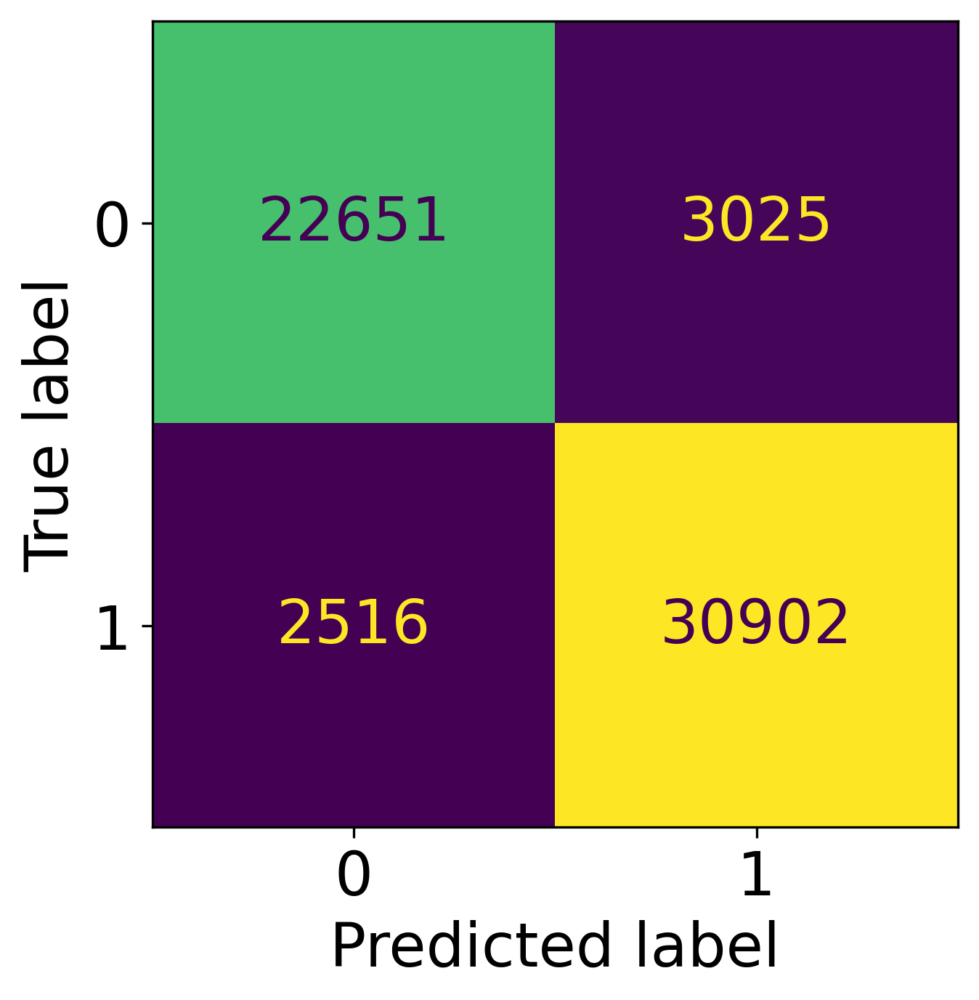

Test Accuracy: 0.91
Normalized Confusion Matrix:
[[0.8821857  0.1178143 ]
 [0.07528877 0.92471123]]


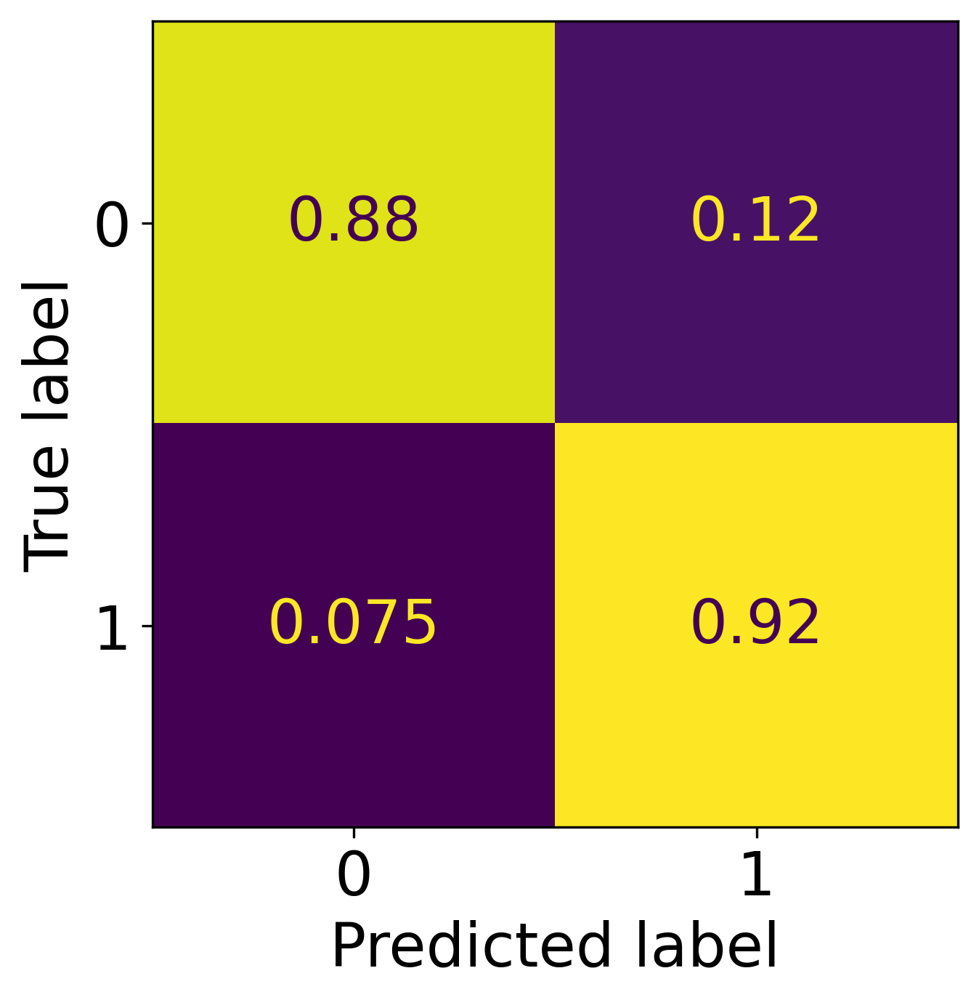

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt

# Applying KNN Classifier
knn = KNeighborsClassifier(n_neighbors=25)
knn.fit(X_train, Y_train)

# Predictions
y_pred = knn.predict(x_test)

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

# Plotting confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=knn.classes_)
disp.plot(cmap='viridis', colorbar=False)
plt.show()

# Test accuracy
test_accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {test_accuracy:.2f}")

# Normalized confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
print("Normalized Confusion Matrix:")
print(cm_normalized)

# Plotting normalized confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm_normalized, display_labels=knn.classes_)
disp.plot(cmap='viridis', colorbar=False)
plt.show()

In [ ]:
import joblib

# Save the model
model_filename = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/KNN.pkl"
joblib.dump(knn, model_filename)

['/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/KNN.pkl']

In [ ]:
import joblib

# Load the model
model_filename = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/KNN.pkl"
KNN = joblib.load(model_filename)

## LR

Classification Report:
              precision    recall  f1-score   support

           0       0.59      0.36      0.45     25676
           1       0.62      0.81      0.70     33418

    accuracy                           0.62     59094
   macro avg       0.61      0.59      0.58     59094
weighted avg       0.61      0.62      0.59     59094

Confusion Matrix:
[[ 9248 16428]
 [ 6308 27110]]


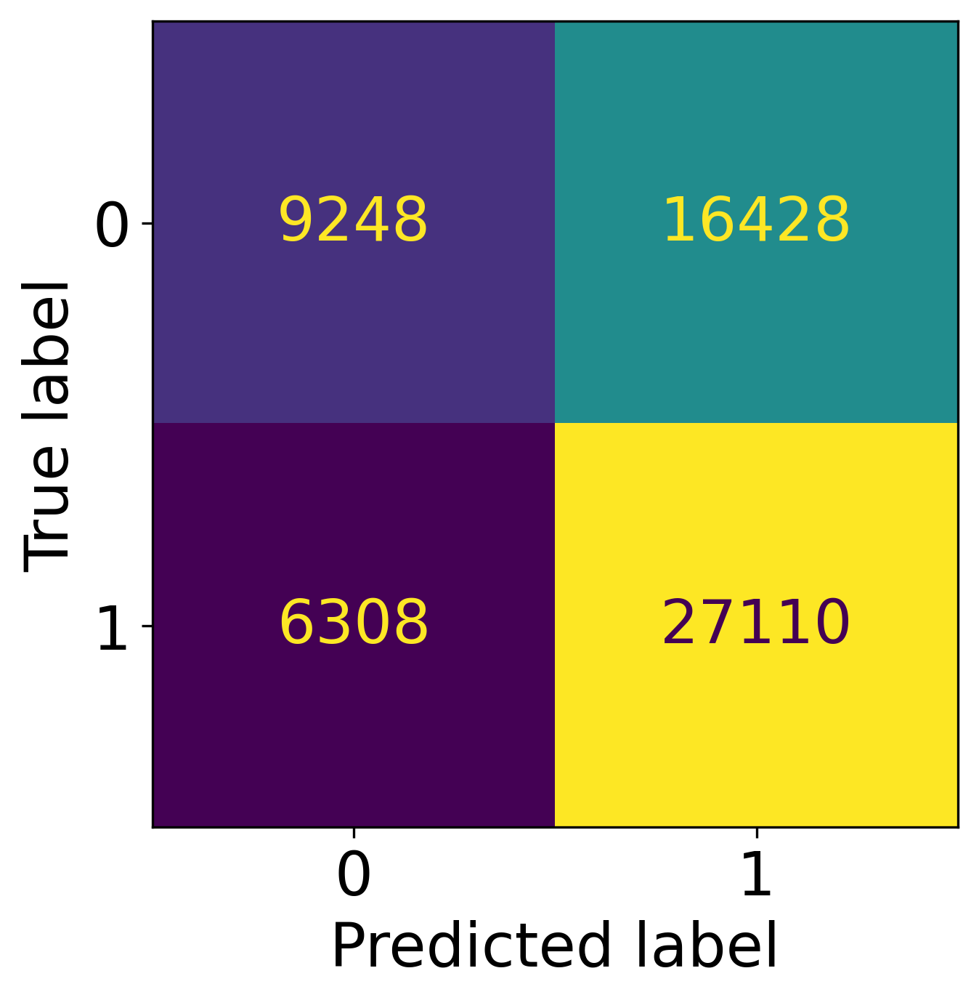

Test Accuracy: 0.62
Normalized Confusion Matrix:
[[0.36018071 0.63981929]
 [0.18876055 0.81123945]]


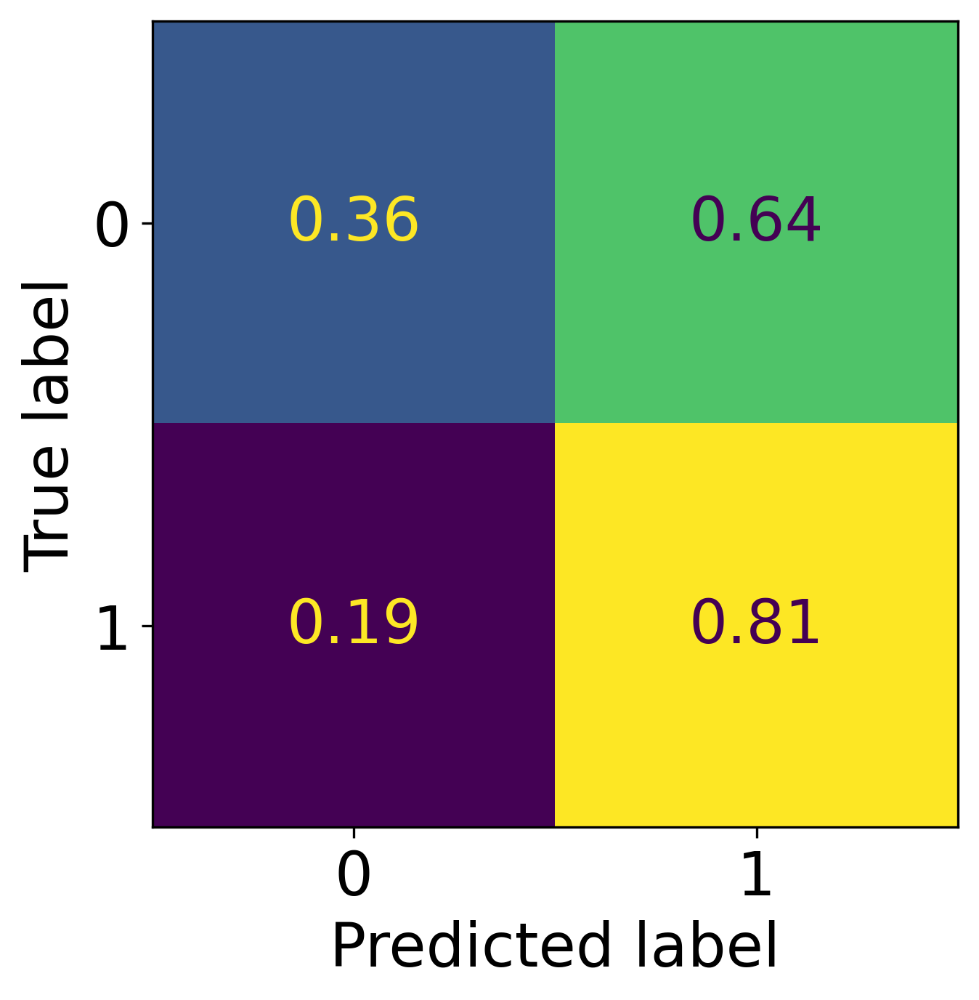

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt

# Applying Logistic Regression
lr = LogisticRegression(max_iter=1000)  # Increase max_iter if needed for convergence
lr.fit(X_train, Y_train)

# Predictions
y_pred = lr.predict(x_test)

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

# Plotting confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=lr.classes_)
disp.plot(cmap='viridis', colorbar=False)
plt.show()

# Test accuracy
test_accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {test_accuracy:.2f}")

# Normalized confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
print("Normalized Confusion Matrix:")
print(cm_normalized)

# Plotting normalized confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm_normalized, display_labels=lr.classes_)
disp.plot(cmap='viridis', colorbar=False)
plt.show()

In [ ]:
import joblib

# Save the model
model_filename = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/LR.pkl"
joblib.dump(lr, model_filename)

['/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/LR.pkl']

In [ ]:
# Load the model
model_filename = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/LR.pkl"
LR = joblib.load(model_filename)

## DT

Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.86      0.86     25676
           1       0.89      0.89      0.89     33418

    accuracy                           0.88     59094
   macro avg       0.88      0.88      0.88     59094
weighted avg       0.88      0.88      0.88     59094

Confusion Matrix:
[[22064  3612]
 [ 3541 29877]]


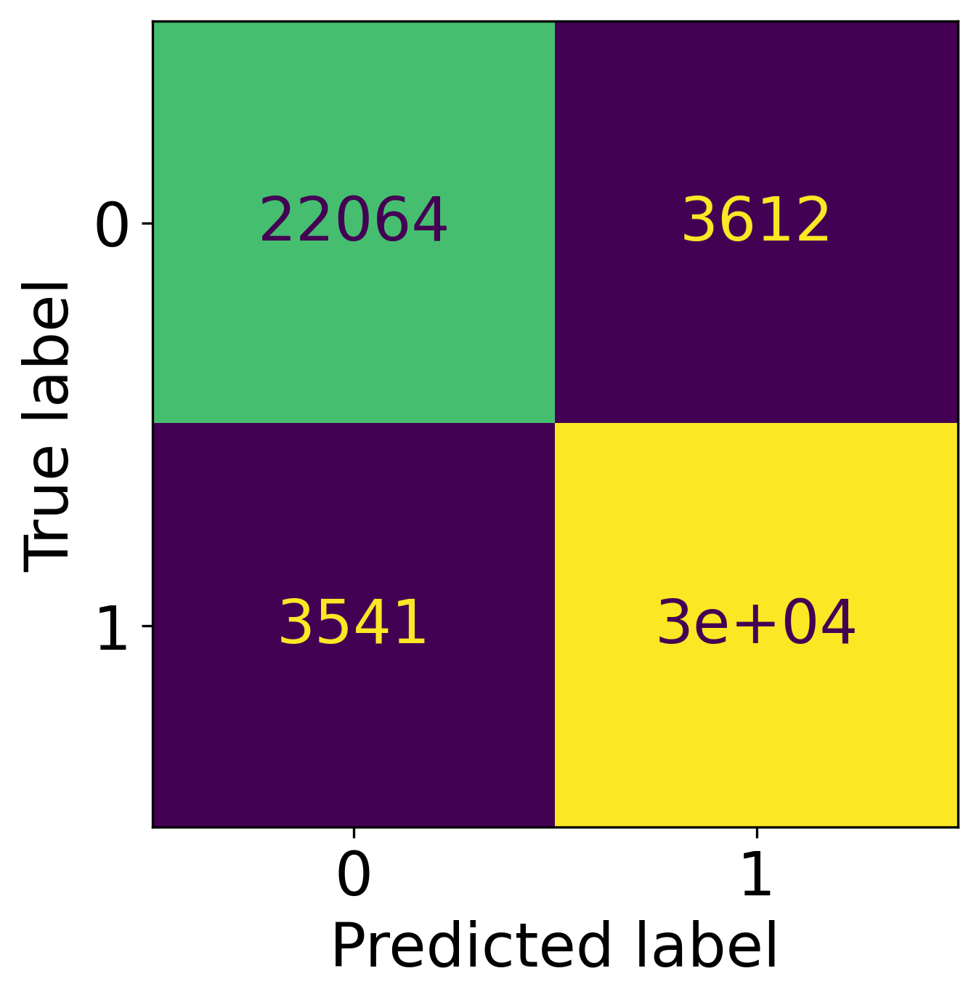

Test Accuracy: 0.88
Normalized Confusion Matrix:
[[0.85932388 0.14067612]
 [0.10596086 0.89403914]]


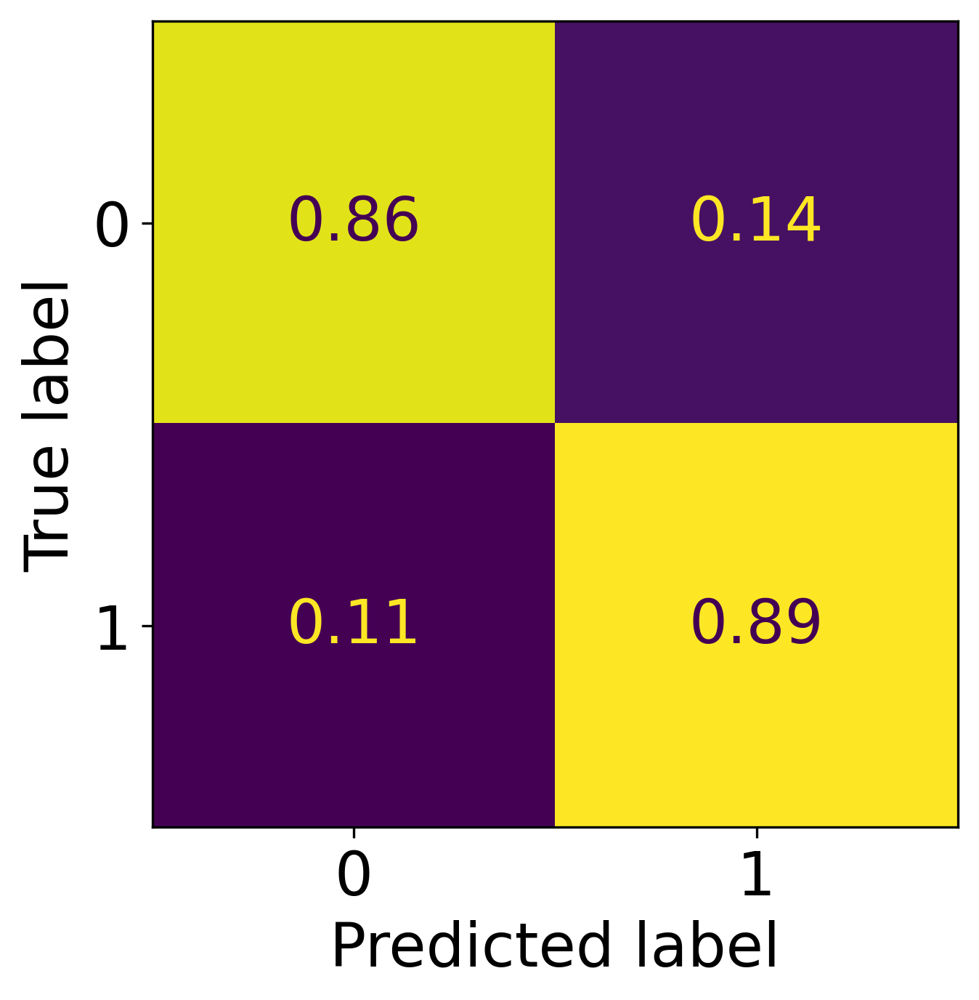

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt

# Applying Decision Tree Classifier
dt = DecisionTreeClassifier()
dt.fit(X_train, Y_train)

# Predictions
y_pred = dt.predict(x_test)

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

# Plotting confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=dt.classes_)
disp.plot(cmap='viridis', colorbar=False)
plt.show()

# Test accuracy
test_accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {test_accuracy:.2f}")

# Normalized confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
print("Normalized Confusion Matrix:")
print(cm_normalized)

# Plotting normalized confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm_normalized, display_labels=dt.classes_)
disp.plot(cmap='viridis', colorbar=False)
plt.show()

In [ ]:
# Save the model
model_filename = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/DT.pkl"
joblib.dump(dt, model_filename)

['/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/DT.pkl']

In [ ]:
import joblib

# Load the model
model_filename = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/DT.pkl"
DT = joblib.load(model_filename)

# GBM

Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.56      0.63     25676
           1       0.71      0.82      0.76     33418

    accuracy                           0.71     59094
   macro avg       0.71      0.69      0.69     59094
weighted avg       0.71      0.71      0.70     59094

Confusion Matrix:
[[14419 11257]
 [ 5914 27504]]


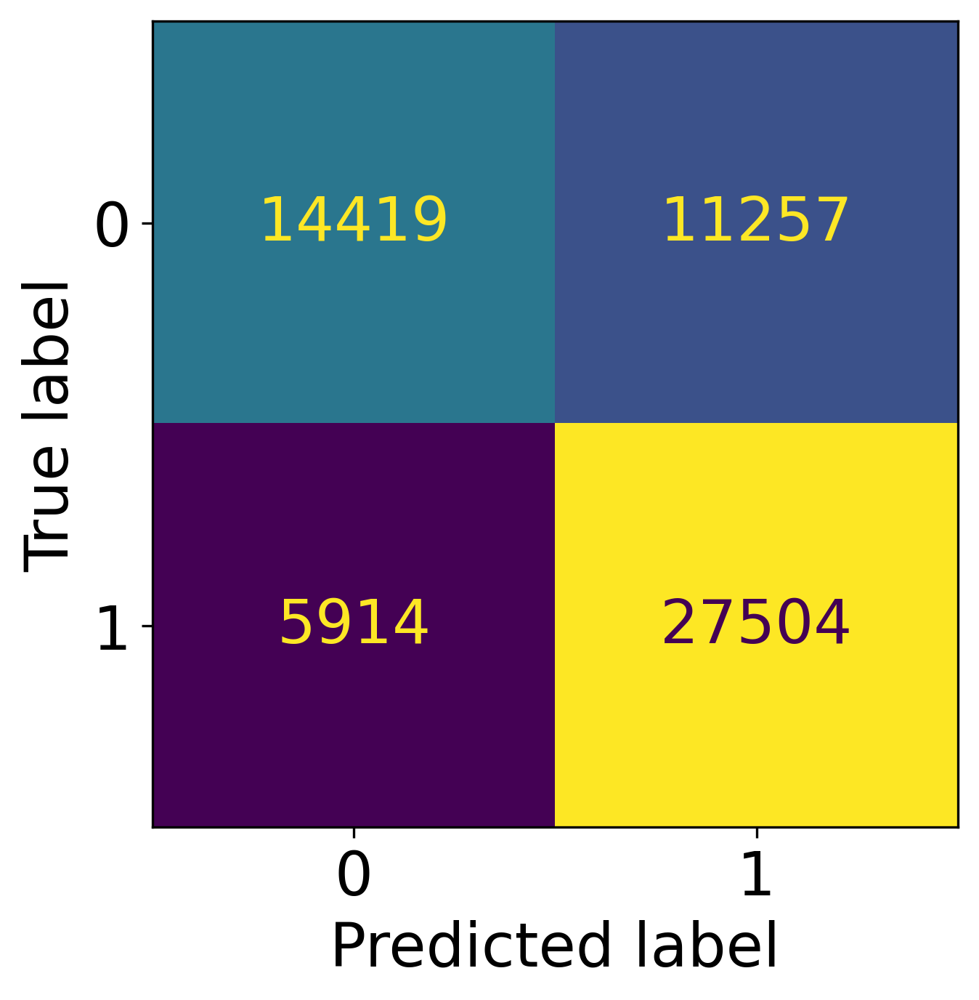

Test Accuracy: 0.71
Normalized Confusion Matrix:
[[0.56157501 0.43842499]
 [0.17697049 0.82302951]]


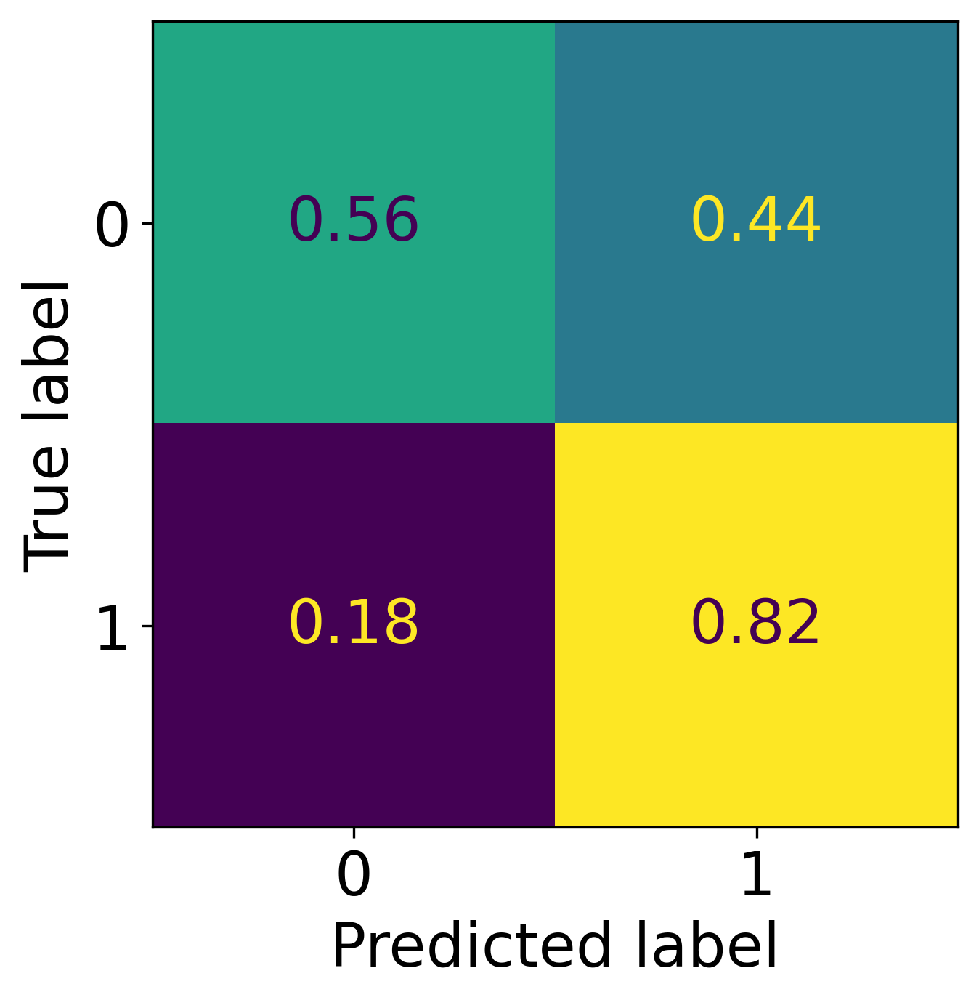

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt

# Applying Gradient Boosting Classifier
gbm = GradientBoostingClassifier()
gbm.fit(X_train, Y_train)

# Predictions
y_pred = gbm.predict(x_test)

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

# Plotting confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=gbm.classes_)
disp.plot(cmap='viridis', colorbar=False)
plt.show()

# Test accuracy
test_accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {test_accuracy:.2f}")

# Normalized confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
print("Normalized Confusion Matrix:")
print(cm_normalized)

# Plotting normalized confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm_normalized, display_labels=gbm.classes_)
disp.plot(cmap='viridis', colorbar=False)
plt.show()

In [ ]:
import joblib

# Save the model
model_filename = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/GBM.pkl"
joblib.dump(gbm, model_filename)

['/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/GBM.pkl']

In [ ]:
# Load the model
model_filename = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/GBM.pkl"
GBM = joblib.load(model_filename)

## CATBoost

In [ ]:
pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 8.8 MB/s eta 0:00:00


Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.50      0.57     25676
           1       0.68      0.82      0.74     33418

    accuracy                           0.68     59094
   macro avg       0.68      0.66      0.66     59094
weighted avg       0.68      0.68      0.67     59094

Confusion Matrix:
[[12814 12862]
 [ 6123 27295]]


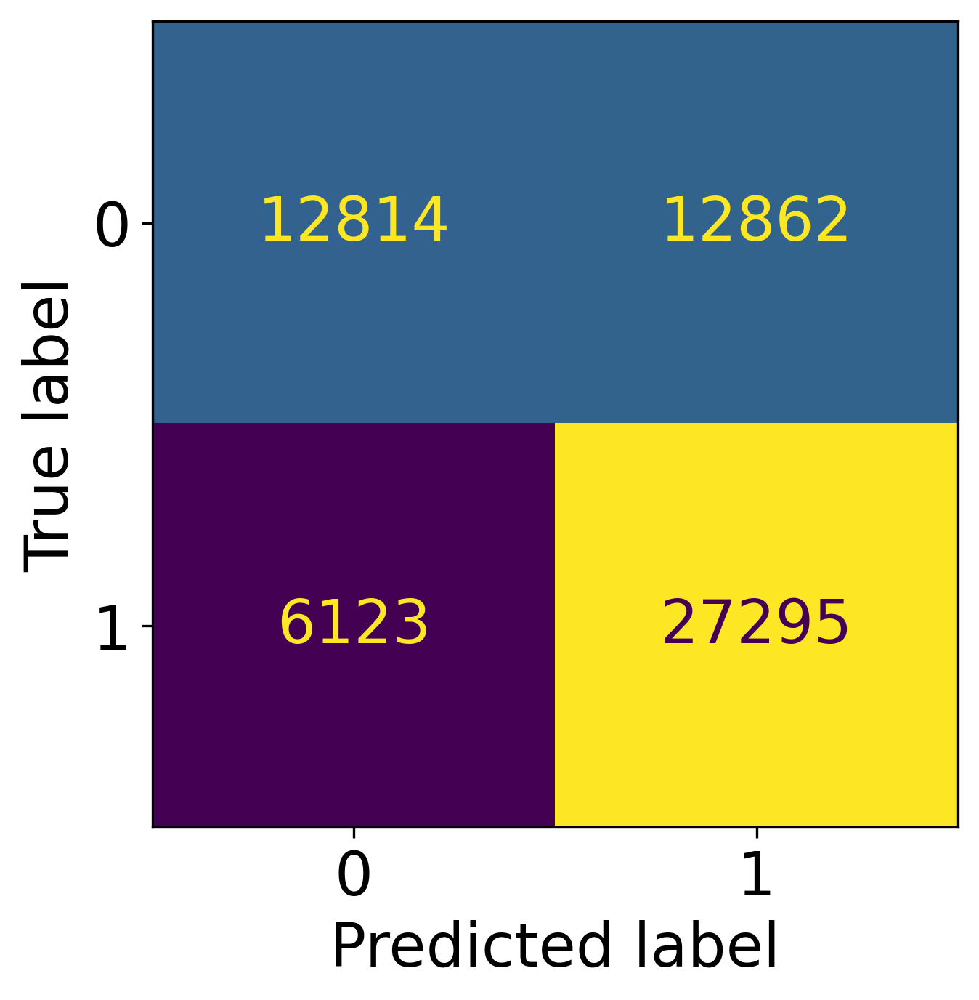

Test Accuracy: 0.68
Normalized Confusion Matrix:
[[0.49906527 0.50093473]
 [0.18322461 0.81677539]]


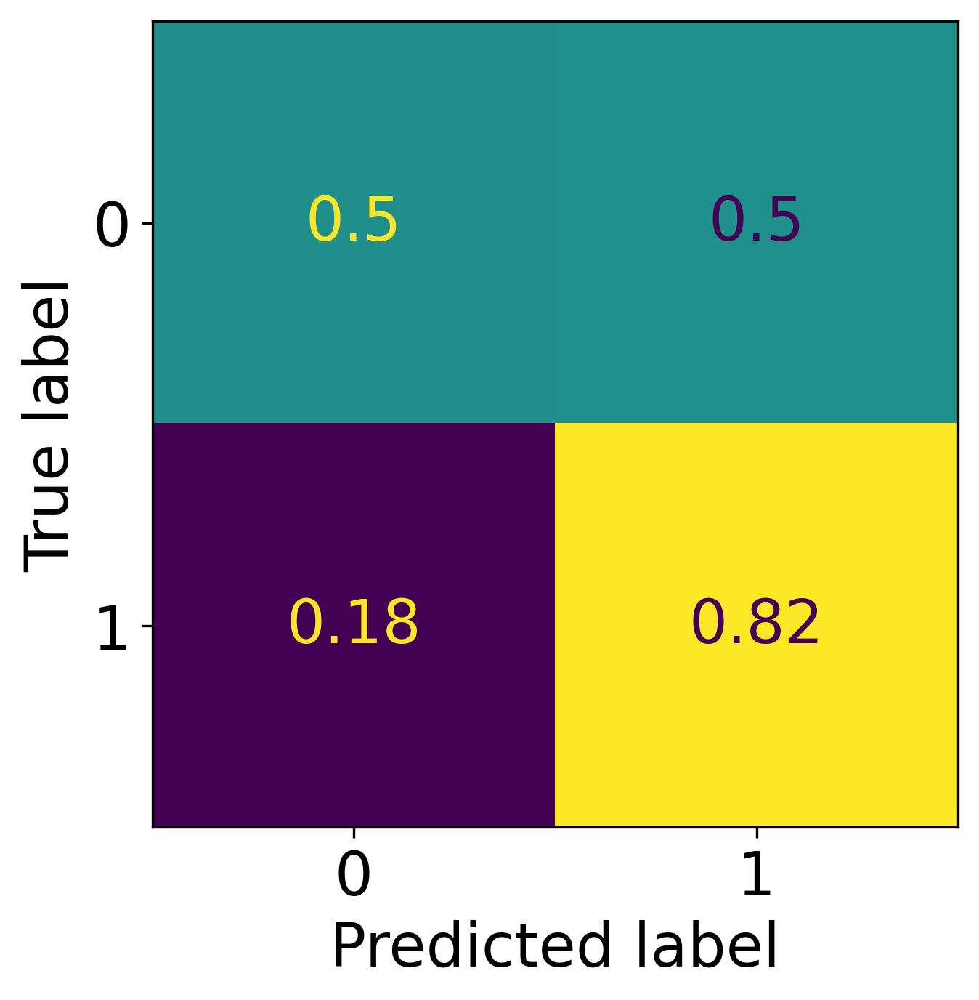

In [ ]:
from catboost import CatBoostClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt

# Applying CatBoost Classifier
catboost = CatBoostClassifier(iterations=100, learning_rate=0.1, depth=3, verbose=0)  # Adjust hyperparameters as needed
catboost.fit(X_train, Y_train)

# Predictions
y_pred = catboost.predict(x_test)

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

# Plotting confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=catboost.classes_)
disp.plot(cmap='viridis', colorbar=False)
plt.show()

# Test accuracy
test_accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {test_accuracy:.2f}")

# Normalized confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
print("Normalized Confusion Matrix:")
print(cm_normalized)

# Plotting normalized confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm_normalized, display_labels=catboost.classes_)
disp.plot(cmap='viridis', colorbar=False)
plt.show()

In [ ]:
import joblib

# Save the model
model_filename = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/CatBoost.pkl"
catboost.save_model(model_filename)

In [ ]:
# Load the model
model_filename = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/CatBoost.pkl"
CatBoost = CatBoostClassifier()
CatBoost.load_model(model_filename)

## GNB

Classification Report:
              precision    recall  f1-score   support

           0       0.49      0.37      0.42     25676
           1       0.59      0.70      0.64     33418

    accuracy                           0.56     59094
   macro avg       0.54      0.53      0.53     59094
weighted avg       0.54      0.56      0.54     59094

Confusion Matrix:
[[ 9425 16251]
 [10001 23417]]


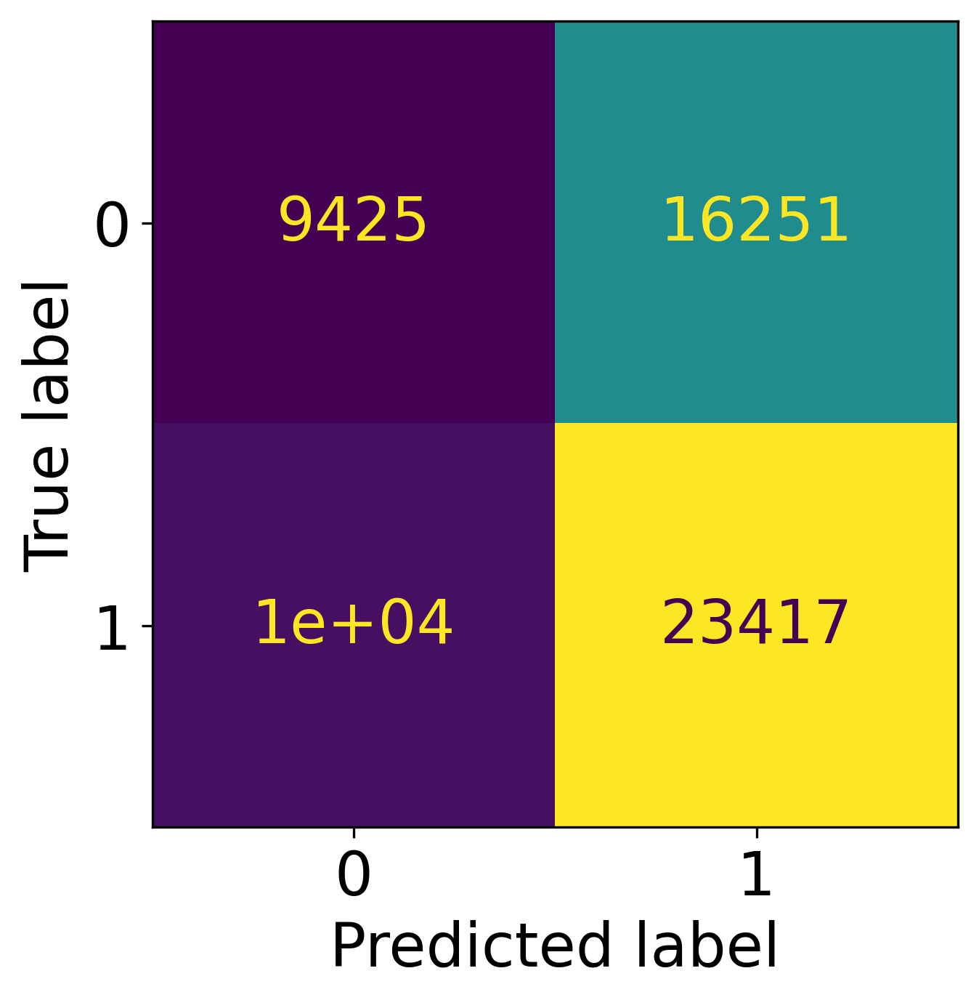

Test Accuracy: 0.56
Normalized Confusion Matrix:
[[0.36707431 0.63292569]
 [0.29926985 0.70073015]]


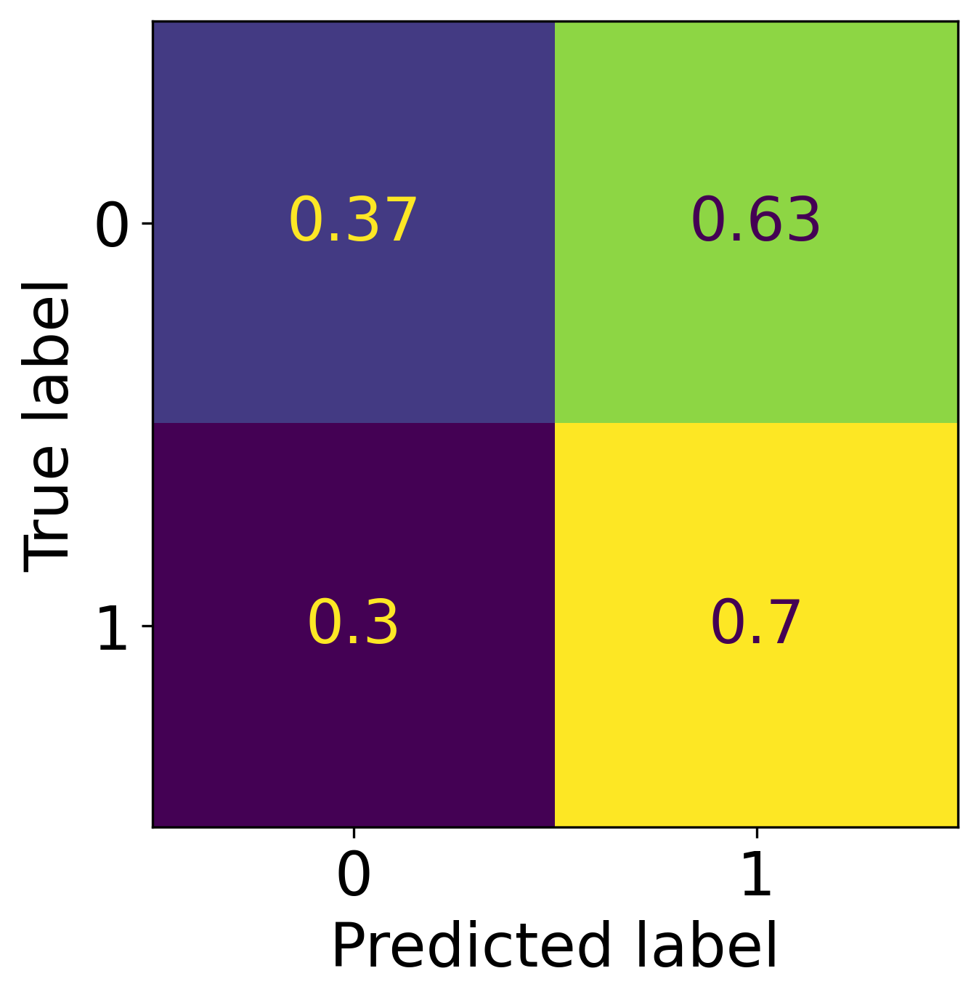

In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt

# Applying Gaussian Naive Bayes
gnb = GaussianNB()
gnb.fit(X_train, Y_train)

# Predictions
y_pred = gnb.predict(x_test)

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

# Plotting confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=gnb.classes_)
disp.plot(cmap='viridis', colorbar=False)
plt.show()

# Test accuracy
test_accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {test_accuracy:.2f}")

# Normalized confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
print("Normalized Confusion Matrix:")
print(cm_normalized)

# Plotting normalized confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm_normalized, display_labels=gnb.classes_)
disp.plot(cmap='viridis', colorbar=False)
plt.show()

In [ ]:
import joblib

# Save the model
model_filename = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/GNB.pkl"
joblib.dump(gnb, model_filename)

['/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/GNB.pkl']

In [ ]:
# Load the model
model_filename = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/GNB.pkl"
GNB = joblib.load(model_filename)

## XGB

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [08:08:21] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.85      0.87     25676
           1       0.89      0.91      0.90     33418

    accuracy                           0.89     59094
   macro avg       0.89      0.88      0.88     59094
weighted avg       0.89      0.89      0.89     59094

Confusion Matrix:
[[21824  3852]
 [ 2849 30569]]


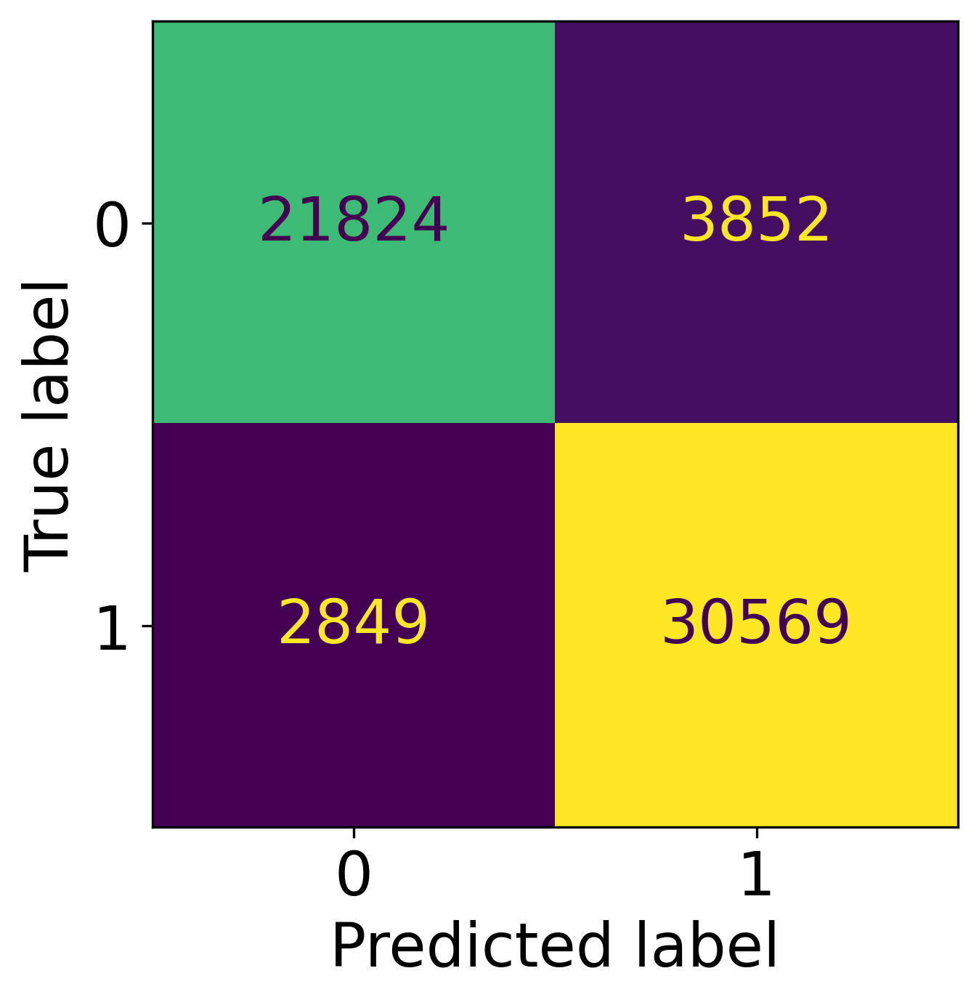

Test Accuracy: 0.89
Normalized Confusion Matrix:
[[0.84997663 0.15002337]
 [0.08525346 0.91474654]]


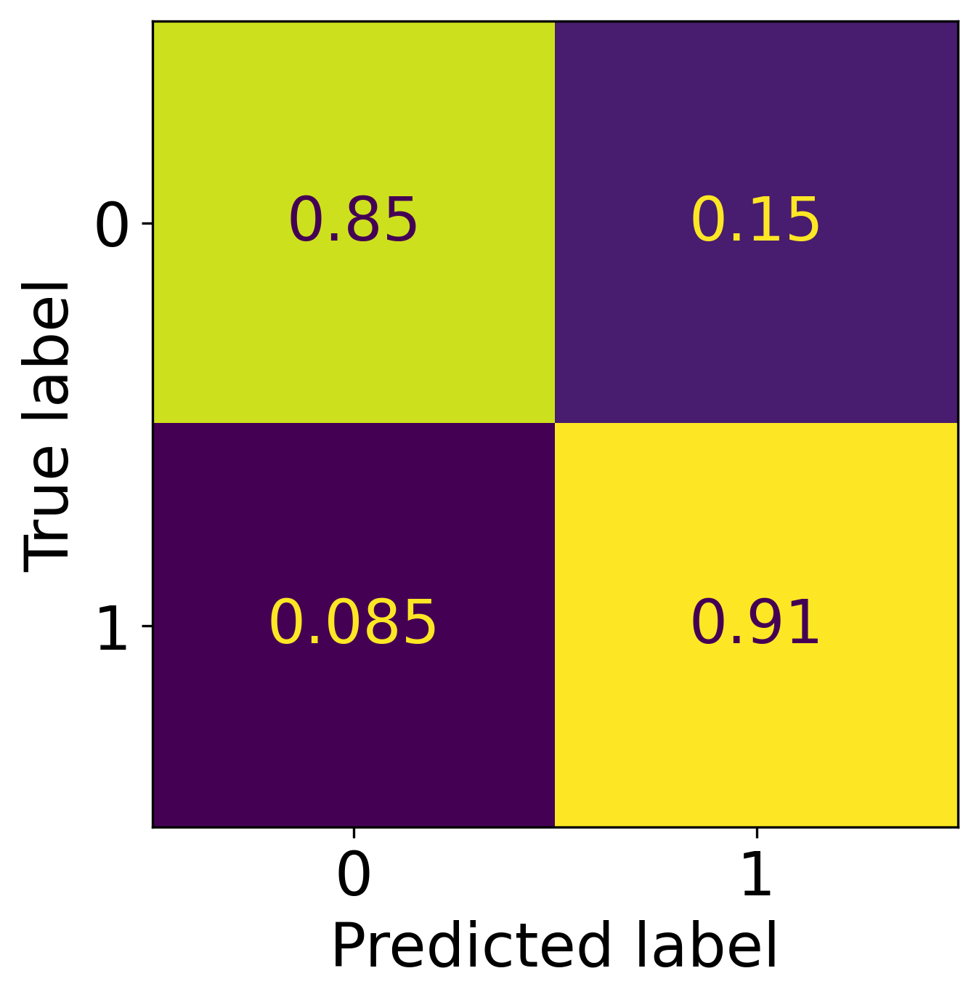

In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt

# Applying XGBoost Classifier
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss')  # `use_label_encoder=False` avoids a warning
xgb.fit(X_train, Y_train)

# Predictions
y_pred = xgb.predict(x_test)

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

# Plotting confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=xgb.classes_)
disp.plot(cmap='viridis', colorbar=False)
plt.show()

# Test accuracy
test_accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {test_accuracy:.2f}")

# Normalized confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
print("Normalized Confusion Matrix:")
print(cm_normalized)

# Plotting normalized confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm_normalized, display_labels=xgb.classes_)
disp.plot(cmap='viridis', colorbar=False)
plt.show()

In [ ]:
import joblib

# Save the model
model_filename = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/XGB.pkl"
joblib.dump(xgb, model_filename)

['/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/XGB.pkl']

In [ ]:
# Load the model
model_filename = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/XGB.pkl"
XGB = joblib.load(model_filename)

## RF

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.90      0.91     25676
           1       0.93      0.94      0.93     33418

    accuracy                           0.92     59094
   macro avg       0.92      0.92      0.92     59094
weighted avg       0.92      0.92      0.92     59094

Confusion Matrix:
[[23228  2448]
 [ 2024 31394]]


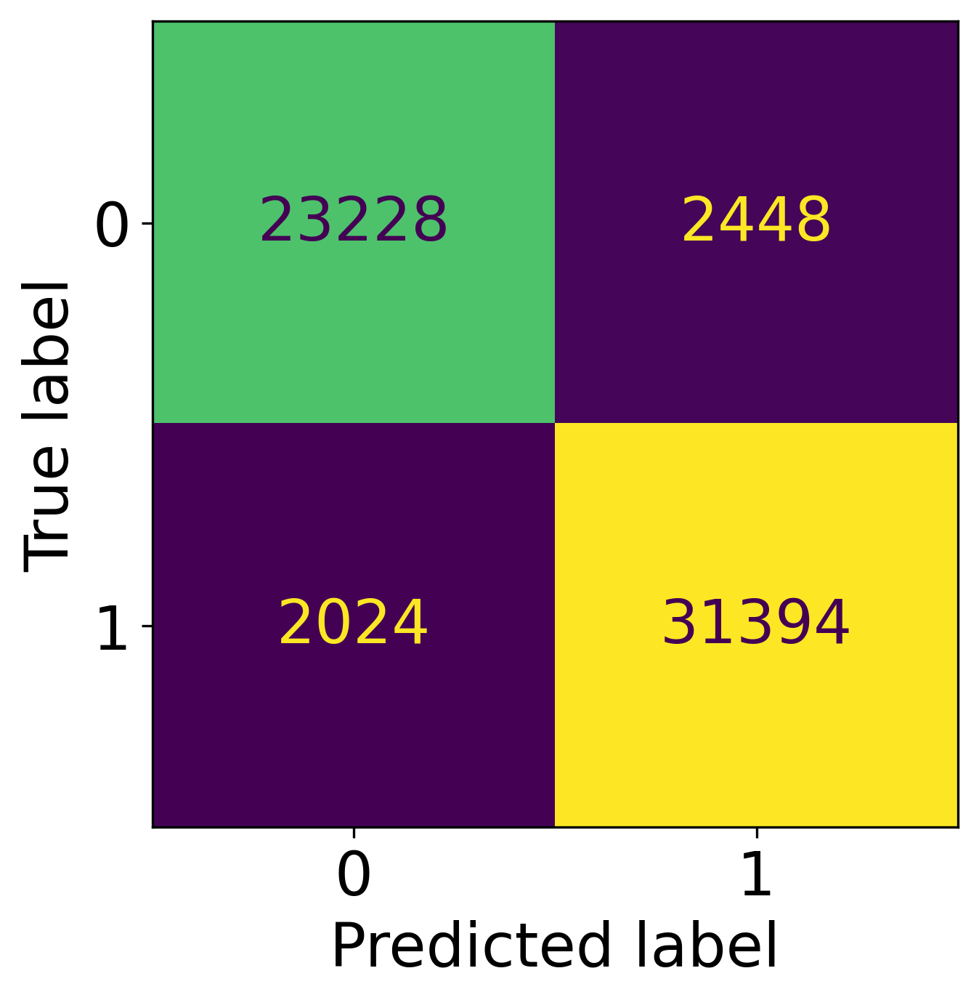

Test Accuracy: 0.92
Normalized Confusion Matrix:
[[0.90465805 0.09534195]
 [0.06056616 0.93943384]]


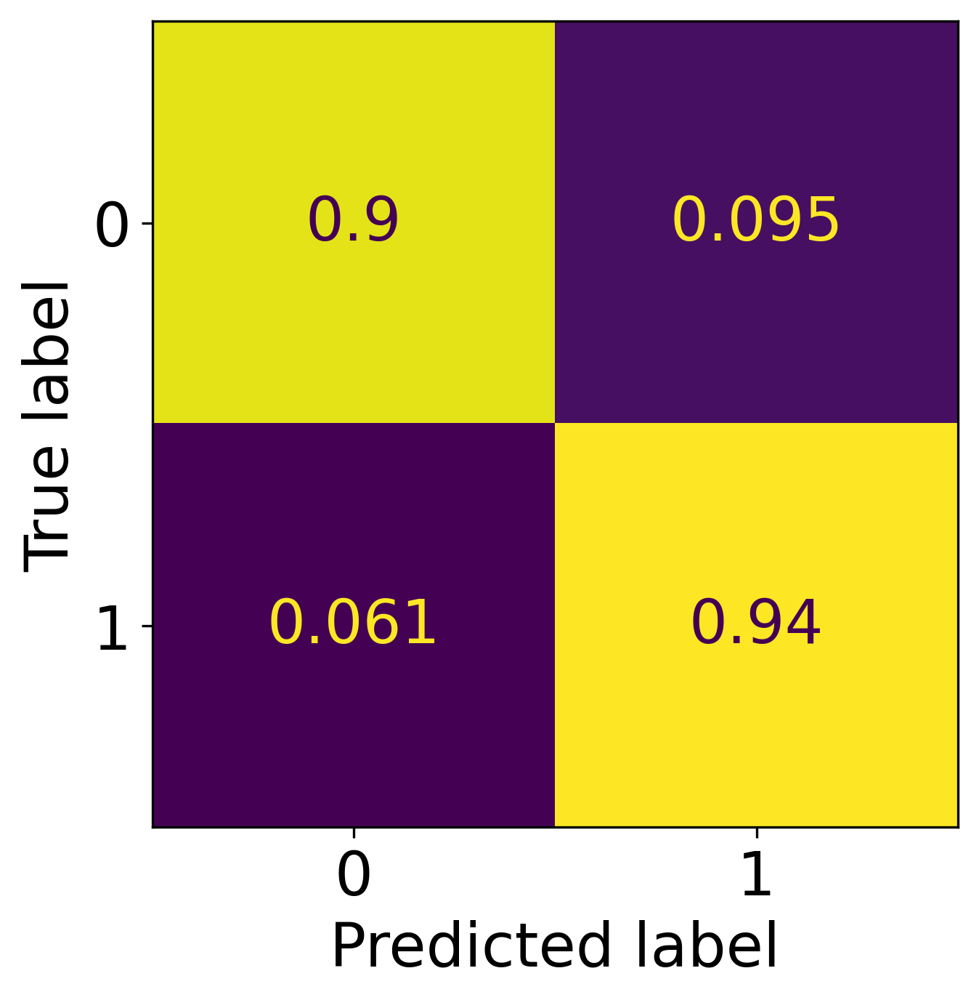

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt

# Applying Random Forest Classifier
rf = RandomForestClassifier(n_estimators=5, max_depth=None, random_state=42)  # Use only 1 tree.
rf.fit(X_train, Y_train)

# Predictions
y_pred = rf.predict(x_test)

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

# Plotting confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=rf.classes_)
disp.plot(cmap='viridis', colorbar=False)
plt.show()

# Test accuracy
test_accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {test_accuracy:.2f}")

# Normalized confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
print("Normalized Confusion Matrix:")
print(cm_normalized)

# Plotting normalized confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm_normalized, display_labels=rf.classes_)
disp.plot(cmap='viridis', colorbar=False)
plt.show()

In [ ]:
import joblib

# Save the model
model_filename = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/RF.pkl"
joblib.dump(rf, model_filename)

['/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/RF.pkl']

In [ ]:
# Load the model
model_filename = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/RF.pkl"
RF = joblib.load(model_filename)

## AdaBoost

Classification Report:
              precision    recall  f1-score   support

           0       0.60      0.37      0.46     25676
           1       0.63      0.81      0.71     33418

    accuracy                           0.62     59094
   macro avg       0.62      0.59      0.59     59094
weighted avg       0.62      0.62      0.60     59094

Confusion Matrix:
[[ 9595 16081]
 [ 6270 27148]]


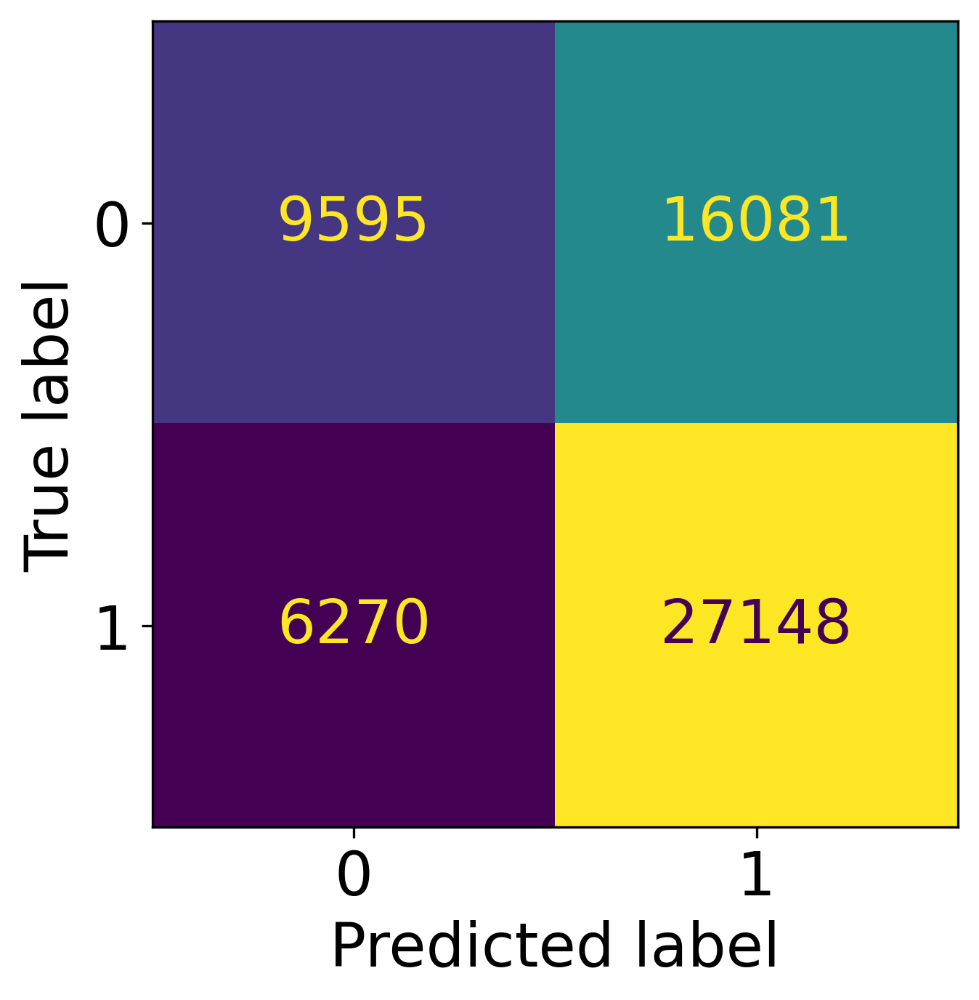

Test Accuracy: 0.62
Normalized Confusion Matrix:
[[0.37369528 0.62630472]
 [0.18762344 0.81237656]]


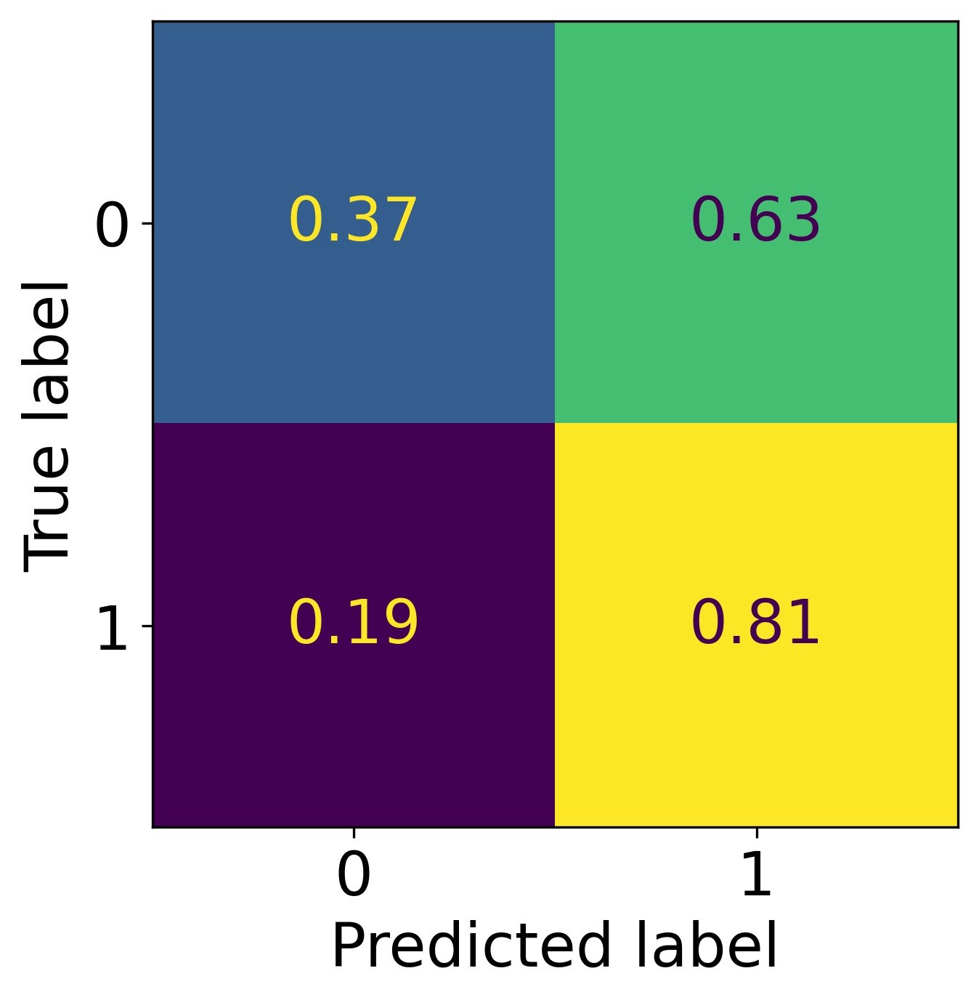

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt

# Applying AdaBoost Classifier
adaboost = AdaBoostClassifier(n_estimators=100, learning_rate=1.0, random_state=42)
adaboost.fit(X_train, Y_train)

# Predictions
y_pred = adaboost.predict(x_test)

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

# Plotting confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=adaboost.classes_)
disp.plot(cmap='viridis', colorbar=False)
plt.show()

# Test accuracy
test_accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {test_accuracy:.2f}")

# Normalized confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
print("Normalized Confusion Matrix:")
print(cm_normalized)

# Plotting normalized confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm_normalized, display_labels=adaboost.classes_)
disp.plot(cmap='viridis', colorbar=False)
plt.show()

In [ ]:
import joblib

# Save the model
model_filename = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/AdaBoost.pkl"
joblib.dump(adaboost, model_filename)

['/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/AdaBoost.pkl']

In [ ]:
# Load the model
model_filename = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/AdaBoost.pkl"
AdaBoost = joblib.load(model_filename)

## RUSBoost

Classification Report:
              precision    recall  f1-score   support

           0       0.58      0.57      0.58     25676
           1       0.68      0.68      0.68     33418

    accuracy                           0.63     59094
   macro avg       0.63      0.63      0.63     59094
weighted avg       0.63      0.63      0.63     59094

Confusion Matrix:
[[14682 10994]
 [10580 22838]]


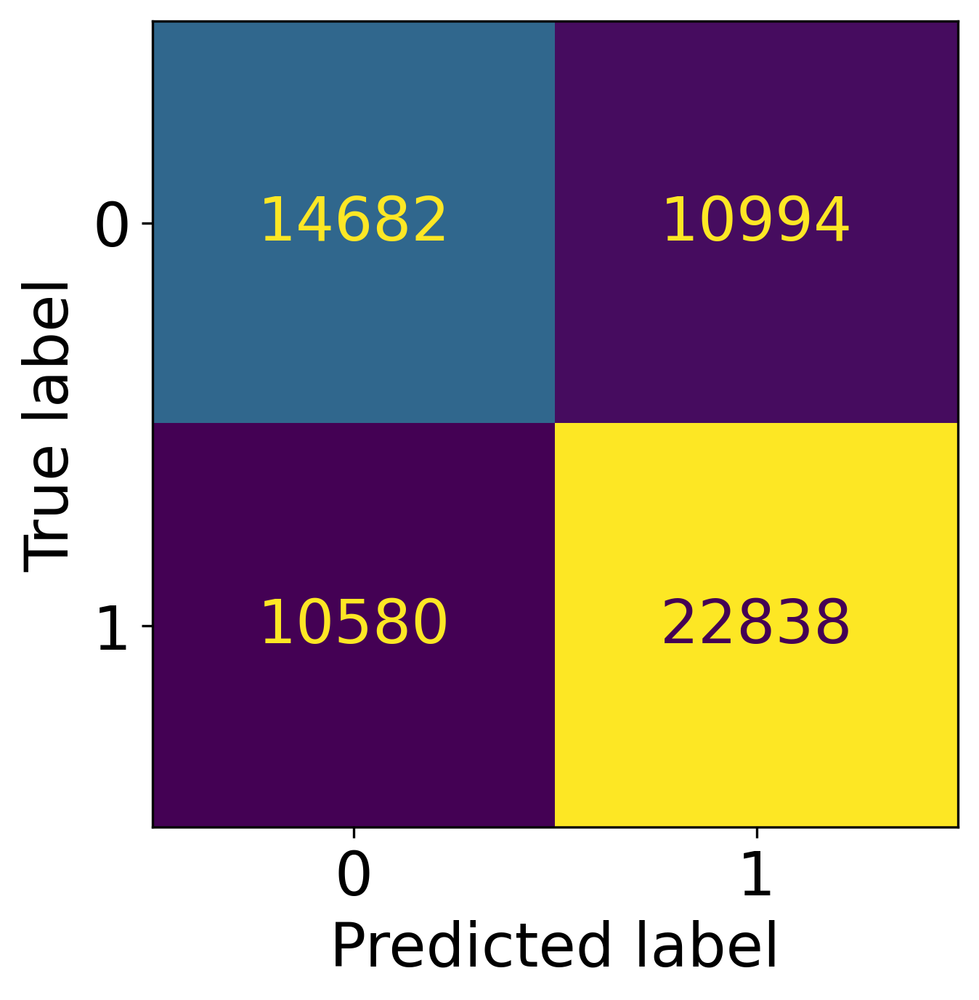

Test Accuracy: 0.63
Normalized Confusion Matrix:
[[0.57181804 0.42818196]
 [0.31659585 0.68340415]]


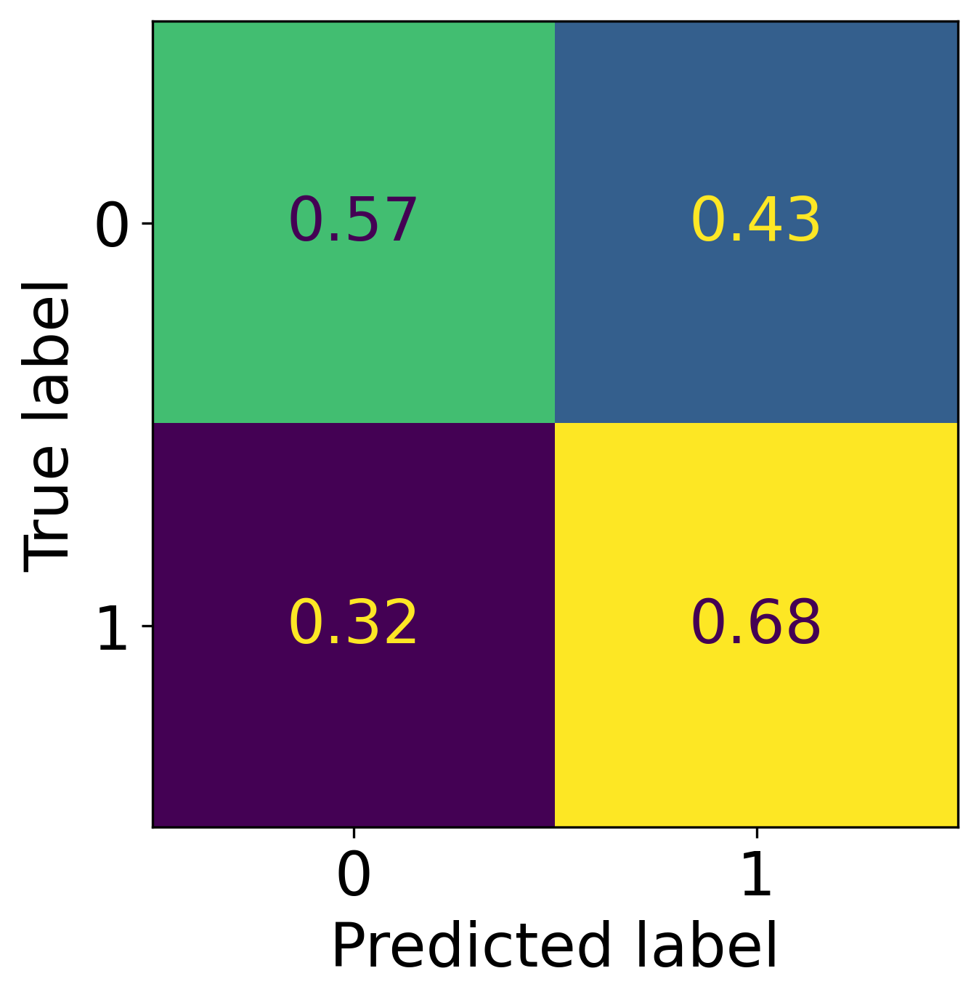

In [ ]:
from imblearn.ensemble import RUSBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt

# Applying RUSBoost Classifier
rusboost = RUSBoostClassifier(
    estimator=DecisionTreeClassifier(max_depth=3),  # Base classifier
    n_estimators=100,
    random_state=42
)
rusboost.fit(X_train, Y_train)

# Predictions
y_pred = rusboost.predict(x_test)

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

# Plotting confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=rusboost.classes_)
disp.plot(cmap='viridis', colorbar=False)
plt.show()

# Test accuracy
test_accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {test_accuracy:.2f}")

# Normalized confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
print("Normalized Confusion Matrix:")
print(cm_normalized)

# Plotting normalized confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm_normalized, display_labels=rusboost.classes_)
disp.plot(cmap='viridis', colorbar=False)
plt.show()

In [ ]:
import joblib

# Save the model
model_filename = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/RUSBoost.pkl"
joblib.dump(rusboost, model_filename)

['/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/RUSBoost.pkl']

In [ ]:
# Load the model
model_filename = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/RUSBoost.pkl"
RUSBoost = joblib.load(model_filename)

## LGBM

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Number of positive: 100254, number of negative: 77028
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.040252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 21675
[LightGBM] [Info] Number of data points in the train set: 177282, number of used features: 85
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.565506 -> initscore=0.263538
[LightGBM] [Info] Start training from score 0.263538


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.75      0.78     25676
           1       0.82      0.86      0.84     33418

    accuracy                           0.81     59094
   macro avg       0.81      0.81      0.81     59094
weighted avg       0.81      0.81      0.81     59094

Confusion Matrix:
[[19233  6443]
 [ 4556 28862]]


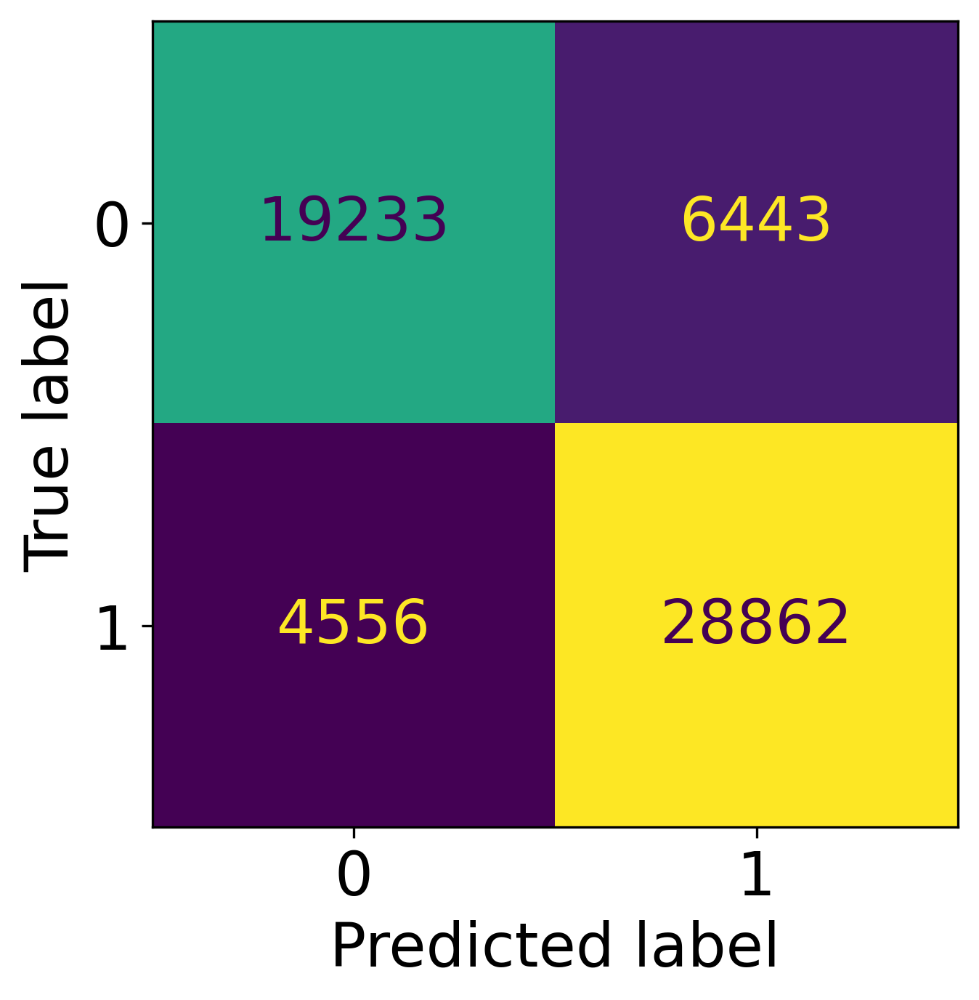

Test Accuracy: 0.81
Normalized Confusion Matrix:
[[0.74906527 0.25093473]
 [0.13633371 0.86366629]]


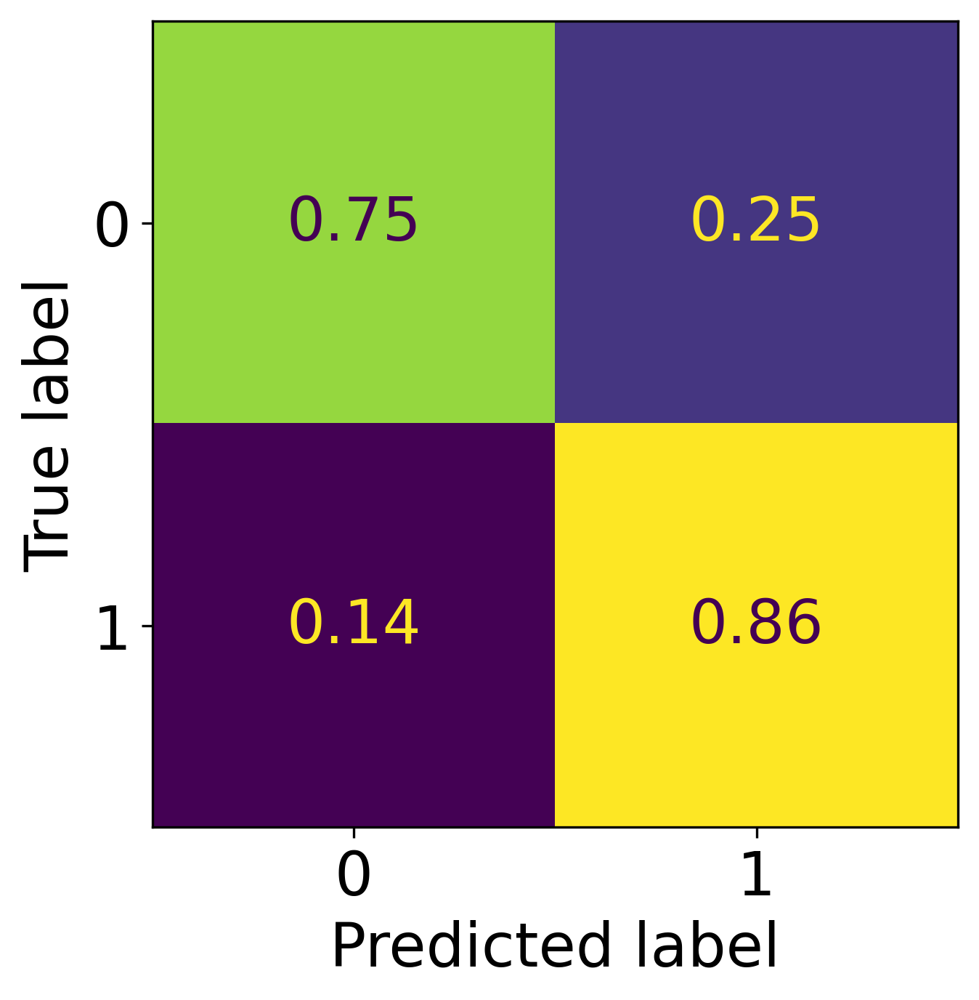

In [ ]:
from lightgbm import LGBMClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt

# Applying LightGBM Classifier
lgbm = LGBMClassifier(n_estimators=100, learning_rate=0.1, max_depth=-1, random_state=42)
lgbm.fit(X_train, Y_train)

# Predictions
y_pred = lgbm.predict(x_test)

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

# Plotting confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=lgbm.classes_)
disp.plot(cmap='viridis', colorbar=False)
plt.show()

# Test accuracy
test_accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {test_accuracy:.2f}")

# Normalized confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
print("Normalized Confusion Matrix:")
print(cm_normalized)

# Plotting normalized confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm_normalized, display_labels=lgbm.classes_)
disp.plot(cmap='viridis', colorbar=False)
plt.show()

In [ ]:
import joblib

# Save the model
model_filename = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/LGBM.pkl"
joblib.dump(lgbm, model_filename)

['/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/LGBM.pkl']

In [ ]:
# Load the model
model_filename = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/LGBM.pkl"
LGBM = joblib.load(model_filename)

## MLP

/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.87      0.87     25676
           1       0.90      0.91      0.90     33418

    accuracy                           0.89     59094
   macro avg       0.89      0.89      0.89     59094
weighted avg       0.89      0.89      0.89     59094

Confusion Matrix:
[[22317  3359]
 [ 3174 30244]]


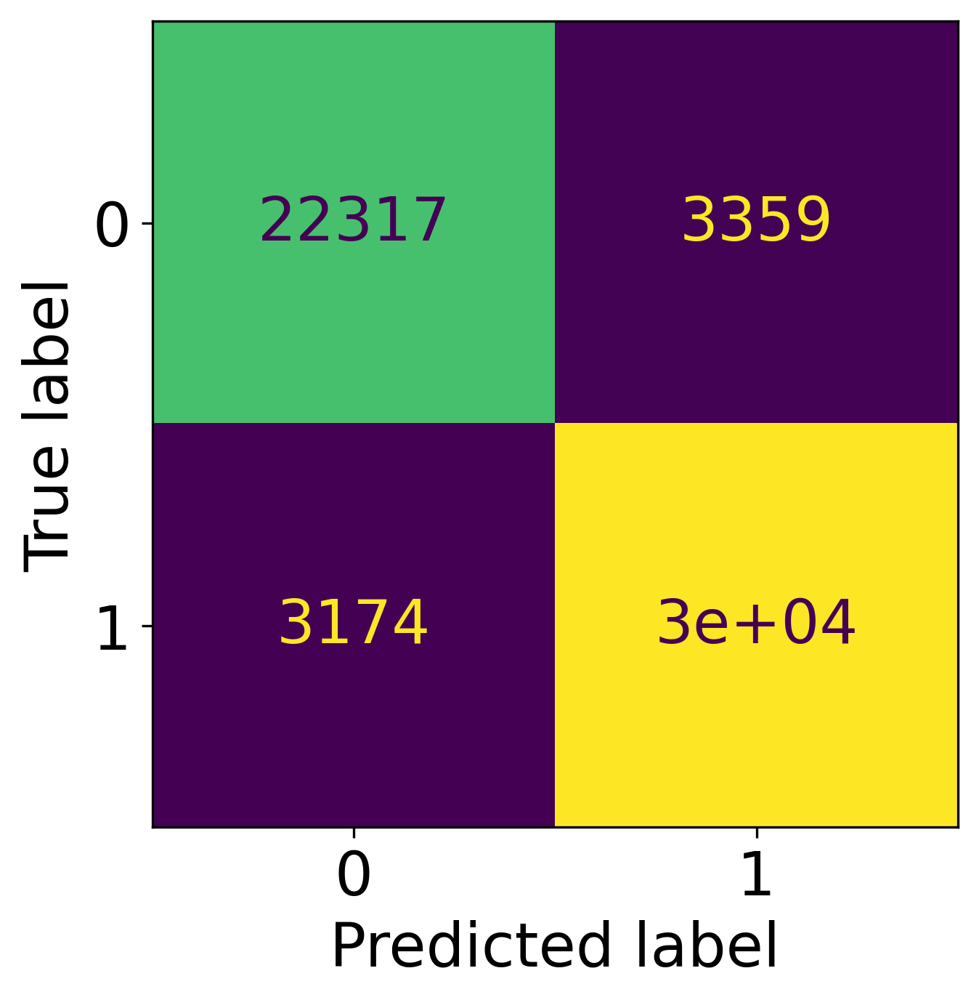

Test Accuracy: 0.89
Normalized Confusion Matrix:
[[0.86917744 0.13082256]
 [0.09497875 0.90502125]]


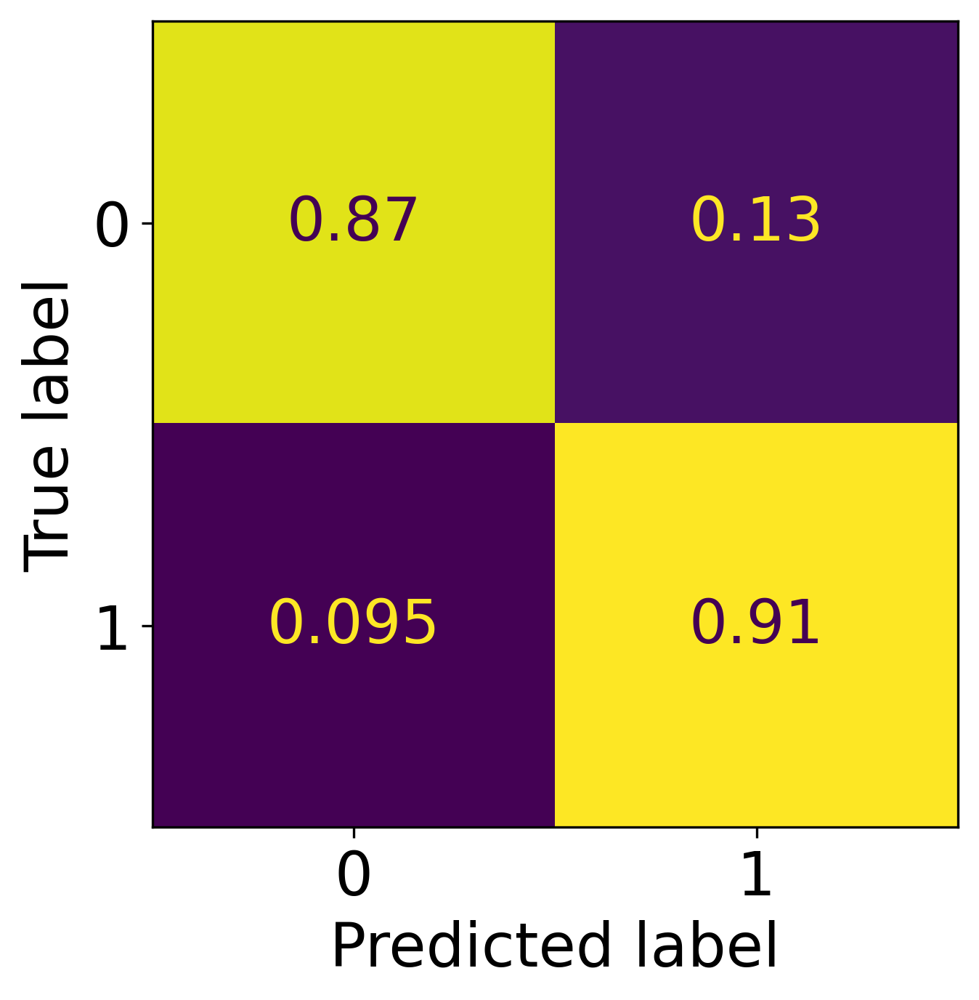

In [ ]:
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt

# Applying MLP Classifier
mlp = MLPClassifier(hidden_layer_sizes=(100,), activation='relu', solver='adam', max_iter=200, random_state=42)
mlp.fit(X_train, Y_train)

# Predictions
y_pred = mlp.predict(x_test)

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

# Plotting confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=mlp.classes_)
disp.plot(cmap='viridis', colorbar=False)
plt.show()

# Test accuracy
test_accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {test_accuracy:.2f}")

# Normalized confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
print("Normalized Confusion Matrix:")
print(cm_normalized)

# Plotting normalized confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm_normalized, display_labels=mlp.classes_)
disp.plot(cmap='viridis', colorbar=False)
plt.show()

In [ ]:
import joblib

# Save the model
model_filename = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/MLP.pkl"
joblib.dump(mlp, model_filename)

['/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/MLP.pkl']

In [ ]:
# Load the model
model_filename = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/MLP.pkl"
MLP = joblib.load(model_filename)

# Deep Learning Model

In [ ]:
# Fit the train and test data with StandarScaler

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
x_test = scaler.fit_transform(x_test)

In [ ]:
from tensorflow.keras.utils import to_categorical

# Reshape the input data
X_train = np.expand_dims(X_train, axis=-1)
x_test = np.expand_dims(x_test, axis=-1)

# One-hot encode the labels
Y_train = to_categorical(Y_train, num_classes=2)
y_test = to_categorical(y_test, num_classes=2)

## ANN

In [ ]:
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model

# Define input shape based on X_train
input_shape = (X_train.shape[1],)  # Flattened input shape for ANN

# Build a simple ANN model
model = Sequential()

# Input layer
model.add(Input(shape=input_shape))

# Dense hidden layers with minimal complexity
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(32, activation='relu'))
model.add(Dropout(0.2))

# Output layer
model.add(Dense(2, activation='softmax'))  # Assuming 2 output classes

# Compile the model
model.compile(
    loss='categorical_crossentropy',
    optimizer=Adam(),
    metrics=['accuracy']
)

# Train the model
H = model.fit(
    X_train, Y_train,
    batch_size=100,
    epochs=20,
    verbose=1,
    validation_data=(x_test, y_test),
)

Epoch 1/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.6078 - loss: 0.6567 - val_accuracy: 0.6816 - val_loss: 0.5790
Epoch 2/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.6754 - loss: 0.5859 - val_accuracy: 0.7231 - val_loss: 0.5336
Epoch 3/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.7036 - loss: 0.5526 - val_accuracy: 0.7446 - val_loss: 0.5067
Epoch 4/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - accuracy: 0.7214 - loss: 0.5292 - val_accuracy: 0.7549 - val_loss: 0.4848
Epoch 5/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.7313 - loss: 0.5144 - val_accuracy: 0.7720 - val_loss: 0.4671
Epoch 6/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.7396 - loss: 0.5013 - val_accuracy: 0.7765 - val_loss: 0.4579
Epoch 7/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - accuracy: 0.7490 - loss: 0.4887 - val_accuracy: 0.7831 - val_loss: 0.4444
Epoch 8/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.7551 - loss: 0.4838 

In [ ]:

from keras.models import save_model

model.save("/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/ANN.h5")


In [ ]:
from keras.models import load_model

ANN = load_model("/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/ANN.h5")

In [ ]:
from keras.models import load_model

score = ANN.evaluate(x_test, y_test, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.8352 - loss: 0.3622
Test loss: 0.3858775794506073
Test accuracy: 0.8220800757408142


In [ ]:
y_true = np.array(y_test)
y_pred = ANN.predict(x_test)

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step


**Classification report of ANN model**

In [ ]:
y_pred = np.squeeze(y_pred)
y_pred = np.array(y_pred >= 0.5, dtype=int)  # Use 'int' instead of 'np.int'

from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.85      0.72      0.78     25676
           1       0.81      0.90      0.85     33418

   micro avg       0.82      0.82      0.82     59094
   macro avg       0.83      0.81      0.82     59094
weighted avg       0.82      0.82      0.82     59094
 samples avg       0.82      0.82      0.82     59094



1847/1847 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step


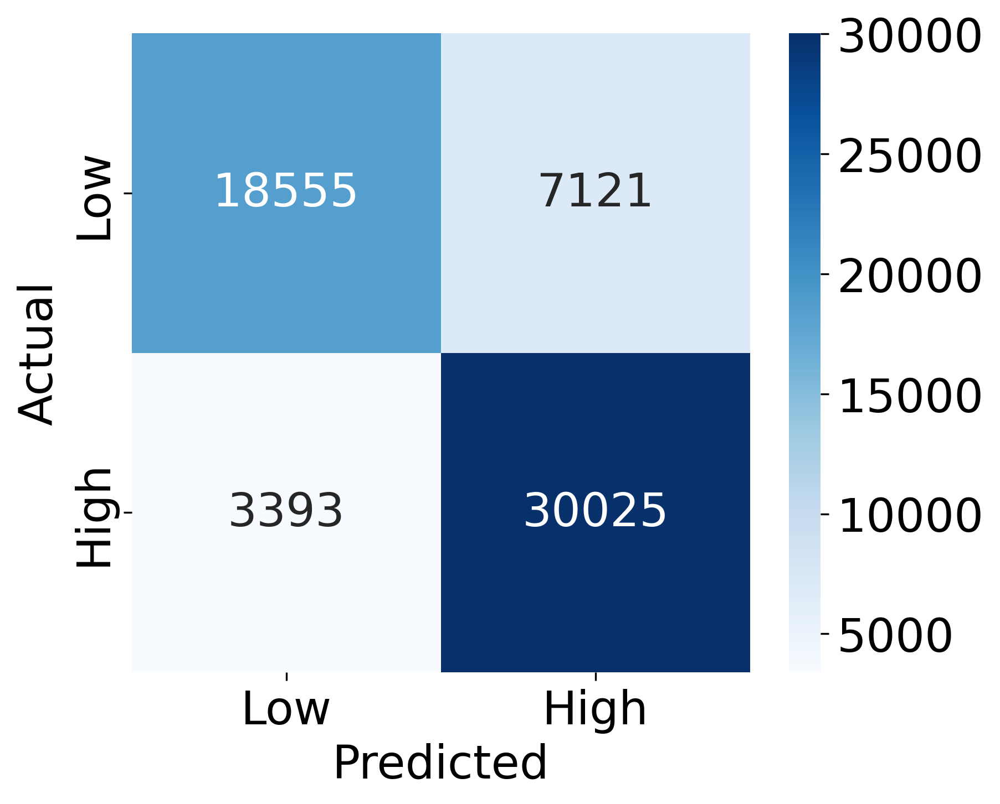

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming y_true and y_pred are already defined and possibly one-hot encoded
y_true = np.array(y_test)
y_pred = ANN.predict(x_test)

# If y_true or y_pred are one-hot encoded, flatten them
y_true = np.argmax(y_true, axis=1)  # Convert to label indices if one-hot encoded
y_pred = np.argmax(y_pred, axis=1)  # Convert to label indices if one-hot encoded

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot confusion matrix using Seaborn heatmap
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Low', 'High'], yticklabels=['Low', 'High'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
# plt.title('Confusion Matrix')
plt.show()

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step


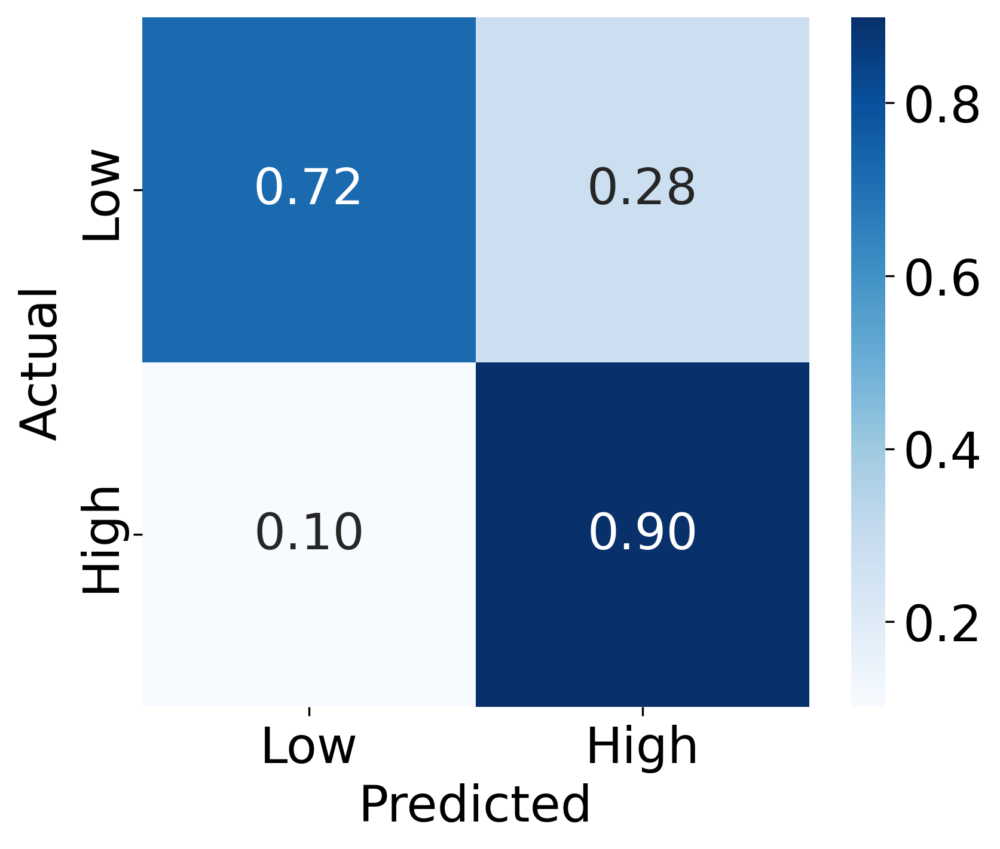

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming y_true and y_pred are already defined and possibly one-hot encoded
y_true = np.array(y_test)
y_pred = ANN.predict(x_test)

# If y_true or y_pred are one-hot encoded, flatten them
y_true = np.argmax(y_true, axis=1)  # Convert to label indices if one-hot encoded
y_pred = np.argmax(y_pred, axis=1)  # Convert to label indices if one-hot encoded

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot normalized confusion matrix using Seaborn heatmap
plt.figure(figsize=(6, 5))
ax = sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues',
                 xticklabels=['Low', 'High'],
                 yticklabels=['Low', 'High'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
#plt.title('Normalized Confusion Matrix')
plt.show()

## CNN

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv1D, MaxPooling1D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam

# Define input shape based on X_train
input_shape = (X_train.shape[1], 1)  # Adding a single channel for CNN

# Build a simple CNN model
model = Sequential()

# Input layer with a convolutional block
model.add(Conv1D(16, kernel_size=3, activation='relu', input_shape=input_shape))
model.add(MaxPooling1D(pool_size=2))

# Flatten the features
model.add(Flatten())

# Dense hidden layer
model.add(Dense(32, activation='relu'))
model.add(Dropout(0.2))

# Output layer
model.add(Dense(2, activation='softmax'))  # Assuming 2 output classes

# Compile the model
model.compile(
    loss='categorical_crossentropy',
    optimizer=Adam(),
    metrics=['accuracy']
)

# Train the model
H = model.fit(
    X_train, Y_train,
    batch_size=100,
    epochs=20,
    verbose=1,
    validation_data=(x_test, y_test),
)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.6228 - loss: 0.6388 - val_accuracy: 0.6983 - val_loss: 0.5594
Epoch 2/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.7024 - loss: 0.5585 - val_accuracy: 0.7403 - val_loss: 0.5070
Epoch 3/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - accuracy: 0.7295 - loss: 0.5185 - val_accuracy: 0.7635 - val_loss: 0.4749
Epoch 4/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - accuracy: 0.7459 - loss: 0.4940 - val_accuracy: 0.7759 - val_loss: 0.4553
Epoch 5/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.7593 - loss: 0.4734 - val_accuracy: 0.7977 - val_loss: 0.4279
Epoch 6/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.7710 - loss: 0.4575 - val_accuracy: 0.8008 - val_loss: 0.4181
Epoch 7/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.7786 - loss: 0.4447 - val_accuracy: 0.8110 - val_loss: 0.4060
Epoch 8/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - accuracy: 0.7843 - loss: 0.4358 

In [ ]:

from keras.models import save_model

model.save("/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/CNN.h5")


In [ ]:
from keras.models import load_model

CNN = load_model("/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/CNN.h5")

In [ ]:
from keras.models import load_model

score = CNN.evaluate(x_test, y_test, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.8583 - loss: 0.3205
Test loss: 0.33571603894233704
Test accuracy: 0.8491048216819763


In [ ]:
y_true = np.array(y_test)
y_pred = CNN.predict(x_test)

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step


**Classification report of CNN model**

In [ ]:
y_pred = np.squeeze(y_pred)
y_pred = np.array(y_pred >= 0.5, dtype=int)  # Use 'int' instead of 'np.int'

from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.84      0.81      0.82     25676
           1       0.86      0.88      0.87     33418

   micro avg       0.85      0.85      0.85     59094
   macro avg       0.85      0.84      0.85     59094
weighted avg       0.85      0.85      0.85     59094
 samples avg       0.85      0.85      0.85     59094



1847/1847 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step


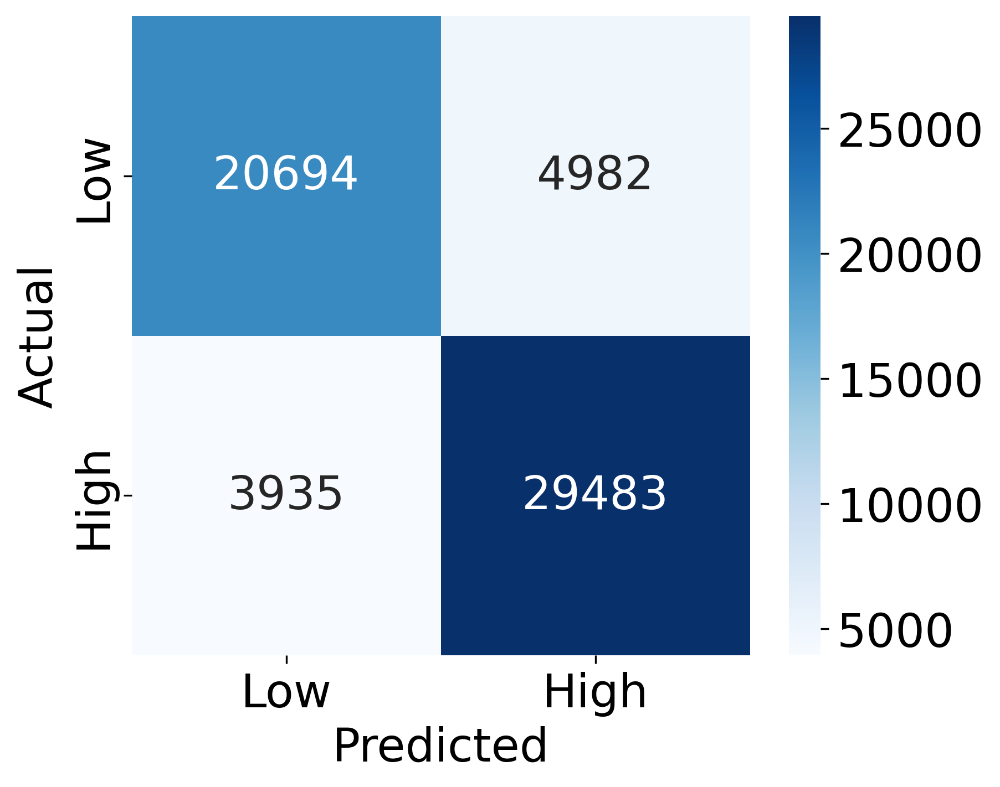

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming y_true and y_pred are already defined and possibly one-hot encoded
y_true = np.array(y_test)
y_pred = CNN.predict(x_test)

# If y_true or y_pred are one-hot encoded, flatten them
y_true = np.argmax(y_true, axis=1)  # Convert to label indices if one-hot encoded
y_pred = np.argmax(y_pred, axis=1)  # Convert to label indices if one-hot encoded

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot confusion matrix using Seaborn heatmap
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Low', 'High'], yticklabels=['Low', 'High'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
# plt.title('Confusion Matrix')
plt.show()

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step


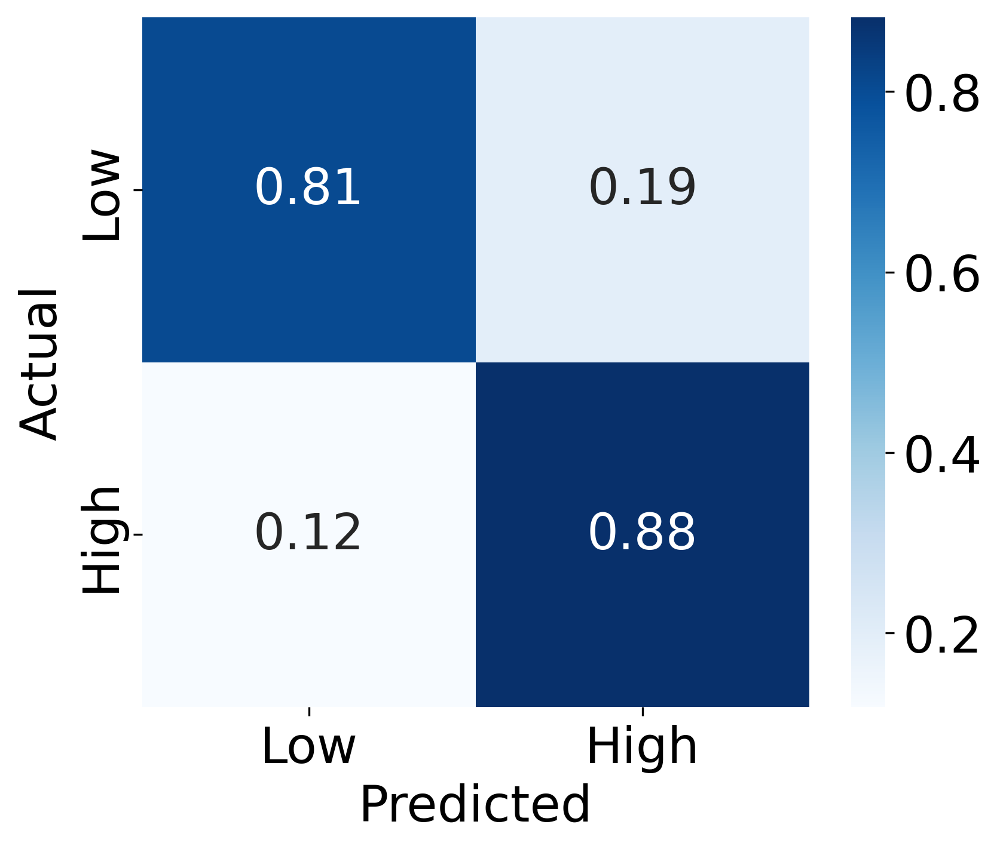

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming y_true and y_pred are already defined and possibly one-hot encoded
y_true = np.array(y_test)
y_pred = CNN.predict(x_test)

# If y_true or y_pred are one-hot encoded, flatten them
y_true = np.argmax(y_true, axis=1)  # Convert to label indices if one-hot encoded
y_pred = np.argmax(y_pred, axis=1)  # Convert to label indices if one-hot encoded

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot normalized confusion matrix using Seaborn heatmap
plt.figure(figsize=(6, 5))
ax = sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues',
                 xticklabels=['Low', 'High'],
                 yticklabels=['Low', 'High'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
#plt.title('Normalized Confusion Matrix')
plt.show()

## LSTM

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam

# Define input shape based on X_train
input_shape = (X_train.shape[1], X_train.shape[2])  # Assuming 3D shape for LSTM (timesteps, features)

# Build a simple LSTM model
model = Sequential()

# LSTM layer
model.add(LSTM(32, activation='tanh', return_sequences=False, input_shape=input_shape))  # Single LSTM layer

# Dense hidden layer
model.add(Dense(32, activation='relu'))
model.add(Dropout(0.2))

# Output layer
model.add(Dense(2, activation='softmax'))  # Assuming 2 output classes

# Compile the model
model.compile(
    loss='categorical_crossentropy',
    optimizer=Adam(),
    metrics=['accuracy']
)

# Train the model
H = model.fit(
    X_train, Y_train,
    batch_size=100,
    epochs=20,
    verbose=1,
    validation_data=(x_test, y_test),
)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 18s 8ms/step - accuracy: 0.5662 - loss: 0.6773 - val_accuracy: 0.6003 - val_loss: 0.6542
Epoch 2/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 19s 8ms/step - accuracy: 0.5985 - loss: 0.6534 - val_accuracy: 0.6101 - val_loss: 0.6456
Epoch 3/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 20s 8ms/step - accuracy: 0.6124 - loss: 0.6438 - val_accuracy: 0.6247 - val_loss: 0.6330
Epoch 4/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 14s 8ms/step - accuracy: 0.6256 - loss: 0.6325 - val_accuracy: 0.6391 - val_loss: 0.6236
Epoch 5/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 15s 8ms/step - accuracy: 0.6383 - loss: 0.6214 - val_accuracy: 0.6493 - val_loss: 0.6119
Epoch 6/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 20s 8ms/step - accuracy: 0.6491 - loss: 0.6108 - val_accuracy: 0.6582 - val_loss: 0.6002
Epoch 7/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 14s 8ms/step - accuracy: 0.6596 - loss: 0.6008 - val_accuracy: 0.6657 - val_loss: 0.5971
Epoch 8/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 21s 8ms/step - accuracy: 0.6677 - loss: 0

In [ ]:

from keras.models import save_model

model.save("/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/LSTM.h5")


In [ ]:
from keras.models import load_model

LSTM = load_model("/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/LSTM.h5")

In [ ]:
from keras.models import load_model

score = LSTM.evaluate(x_test, y_test, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.7354 - loss: 0.5069
Test loss: 0.5179271697998047
Test accuracy: 0.7266558408737183


In [ ]:
y_true = np.array(y_test)
y_pred = LSTM.predict(x_test)

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step


**Classification report of LSTM model**

In [ ]:
y_pred = np.squeeze(y_pred)
y_pred = np.array(y_pred >= 0.5, dtype=int)  # Use 'int' instead of 'np.int'

from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.69      0.68      0.68     25676
           1       0.75      0.77      0.76     33418

   micro avg       0.73      0.73      0.73     59094
   macro avg       0.72      0.72      0.72     59094
weighted avg       0.73      0.73      0.73     59094
 samples avg       0.73      0.73      0.73     59094



1847/1847 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step


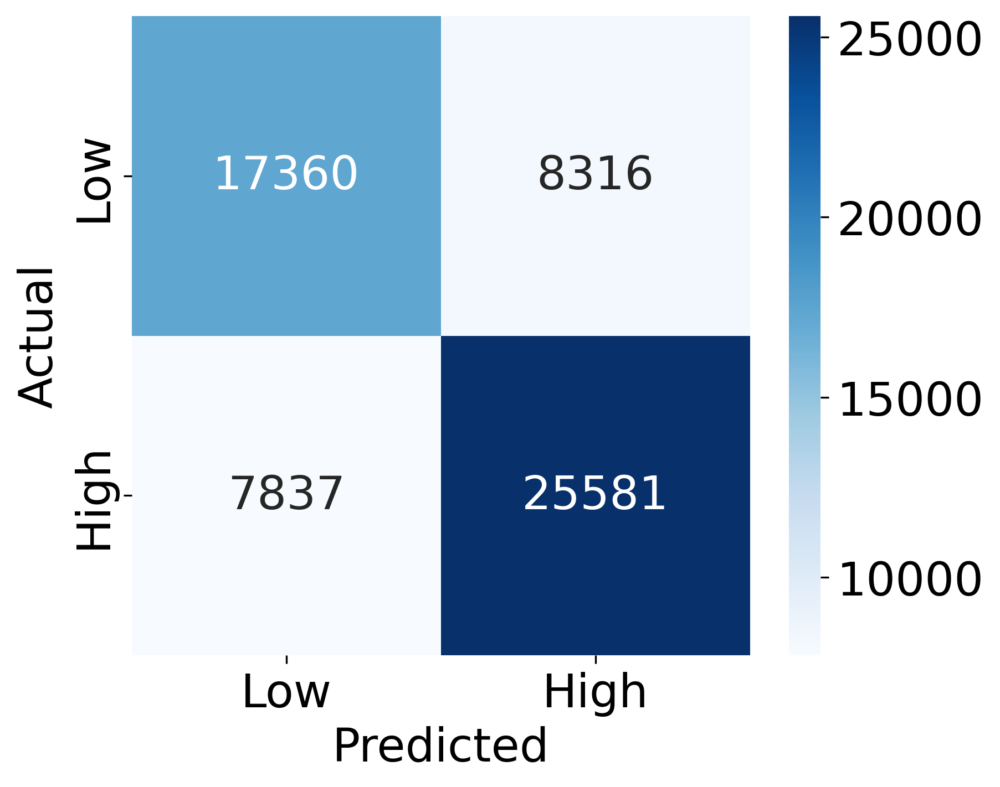

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming y_true and y_pred are already defined and possibly one-hot encoded
y_true = np.array(y_test)
y_pred = LSTM.predict(x_test)

# If y_true or y_pred are one-hot encoded, flatten them
y_true = np.argmax(y_true, axis=1)  # Convert to label indices if one-hot encoded
y_pred = np.argmax(y_pred, axis=1)  # Convert to label indices if one-hot encoded

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot confusion matrix using Seaborn heatmap
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Low', 'High'], yticklabels=['Low', 'High'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
# plt.title('Confusion Matrix')
plt.show()

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step


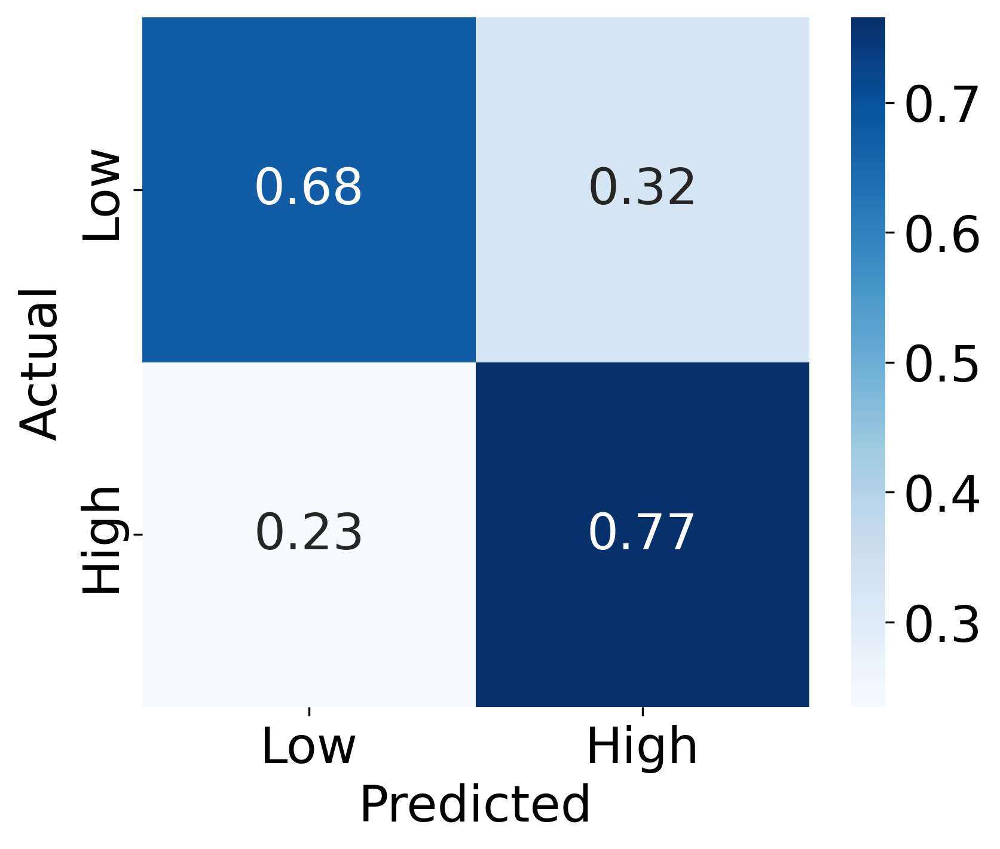

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming y_true and y_pred are already defined and possibly one-hot encoded
y_true = np.array(y_test)
y_pred = LSTM.predict(x_test)

# If y_true or y_pred are one-hot encoded, flatten them
y_true = np.argmax(y_true, axis=1)  # Convert to label indices if one-hot encoded
y_pred = np.argmax(y_pred, axis=1)  # Convert to label indices if one-hot encoded

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot normalized confusion matrix using Seaborn heatmap
plt.figure(figsize=(6, 5))
ax = sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues',
                 xticklabels=['Low', 'High'],
                 yticklabels=['Low', 'High'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
#plt.title('Normalized Confusion Matrix')
plt.show()

## GRU

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, GRU, Dense, Dropout
from tensorflow.keras.optimizers import Adam

# Define input shape based on X_train
input_shape = (X_train.shape[1], X_train.shape[2])  # Assuming 3D shape for GRU (timesteps, features)

# Build a simple GRU model
model = Sequential()

# GRU layer
model.add(GRU(32, activation='tanh', return_sequences=False, input_shape=input_shape))  # Single GRU layer

# Dense hidden layer
model.add(Dense(32, activation='relu'))
model.add(Dropout(0.2))

# Output layer
model.add(Dense(2, activation='softmax'))  # Assuming 2 output classes

# Compile the model
model.compile(
    loss='categorical_crossentropy',
    optimizer=Adam(),
    metrics=['accuracy']
)

# Train the model
H = model.fit(
    X_train, Y_train,
    batch_size=100,
    epochs=20,
    verbose=1,
    validation_data=(x_test, y_test),
)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 16s 8ms/step - accuracy: 0.5679 - loss: 0.6795 - val_accuracy: 0.5750 - val_loss: 0.6630
Epoch 2/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 14s 8ms/step - accuracy: 0.5748 - loss: 0.6637 - val_accuracy: 0.5883 - val_loss: 0.6598
Epoch 3/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 21s 8ms/step - accuracy: 0.5854 - loss: 0.6553 - val_accuracy: 0.6124 - val_loss: 0.6445
Epoch 4/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 20s 8ms/step - accuracy: 0.6079 - loss: 0.6456 - val_accuracy: 0.6193 - val_loss: 0.6386
Epoch 5/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 14s 8ms/step - accuracy: 0.6194 - loss: 0.6388 - val_accuracy: 0.6337 - val_loss: 0.6286
Epoch 6/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 21s 8ms/step - accuracy: 0.6362 - loss: 0.6285 - val_accuracy: 0.6428 - val_loss: 0.6221
Epoch 7/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 20s 8ms/step - accuracy: 0.6417 - loss: 0.6223 - val_accuracy: 0.6550 - val_loss: 0.6120
Epoch 8/20
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 21s 8ms/step - accuracy: 0.6458 - loss: 0

In [ ]:

from keras.models import save_model

model.save("/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/GRU.h5")


In [ ]:
from keras.models import load_model

GRU = load_model("/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/GRU.h5")

In [ ]:
from keras.models import load_model

score = GRU.evaluate(x_test, y_test, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.7362 - loss: 0.5085
Test loss: 0.5276352167129517
Test accuracy: 0.7219853401184082


In [ ]:
y_true = np.array(y_test)
y_pred = GRU.predict(x_test)

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step


**Classification report of GRU model**

In [ ]:
y_pred = np.squeeze(y_pred)
y_pred = np.array(y_pred >= 0.5, dtype=int)  # Use 'int' instead of 'np.int'

from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.70      0.63      0.66     25676
           1       0.74      0.79      0.76     33418

   micro avg       0.72      0.72      0.72     59094
   macro avg       0.72      0.71      0.71     59094
weighted avg       0.72      0.72      0.72     59094
 samples avg       0.72      0.72      0.72     59094



1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step


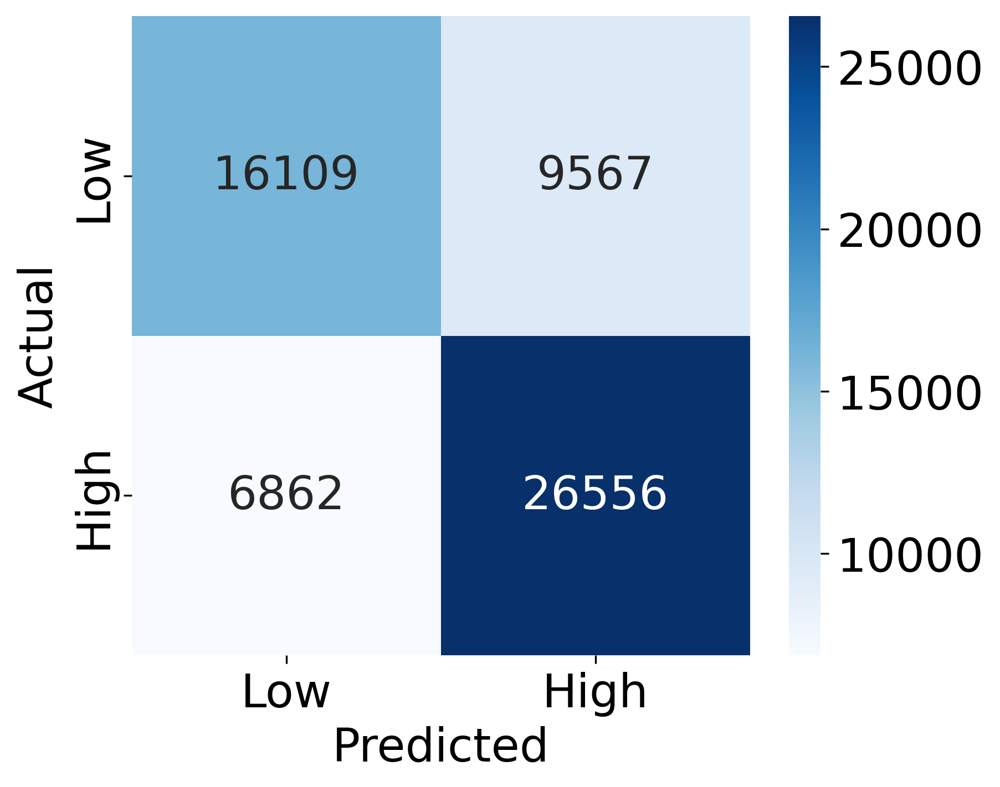

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming y_true and y_pred are already defined and possibly one-hot encoded
y_true = np.array(y_test)
y_pred = GRU.predict(x_test)

# If y_true or y_pred are one-hot encoded, flatten them
y_true = np.argmax(y_true, axis=1)  # Convert to label indices if one-hot encoded
y_pred = np.argmax(y_pred, axis=1)  # Convert to label indices if one-hot encoded

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot confusion matrix using Seaborn heatmap
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Low', 'High'], yticklabels=['Low', 'High'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
# plt.title('Confusion Matrix')
plt.show()

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step


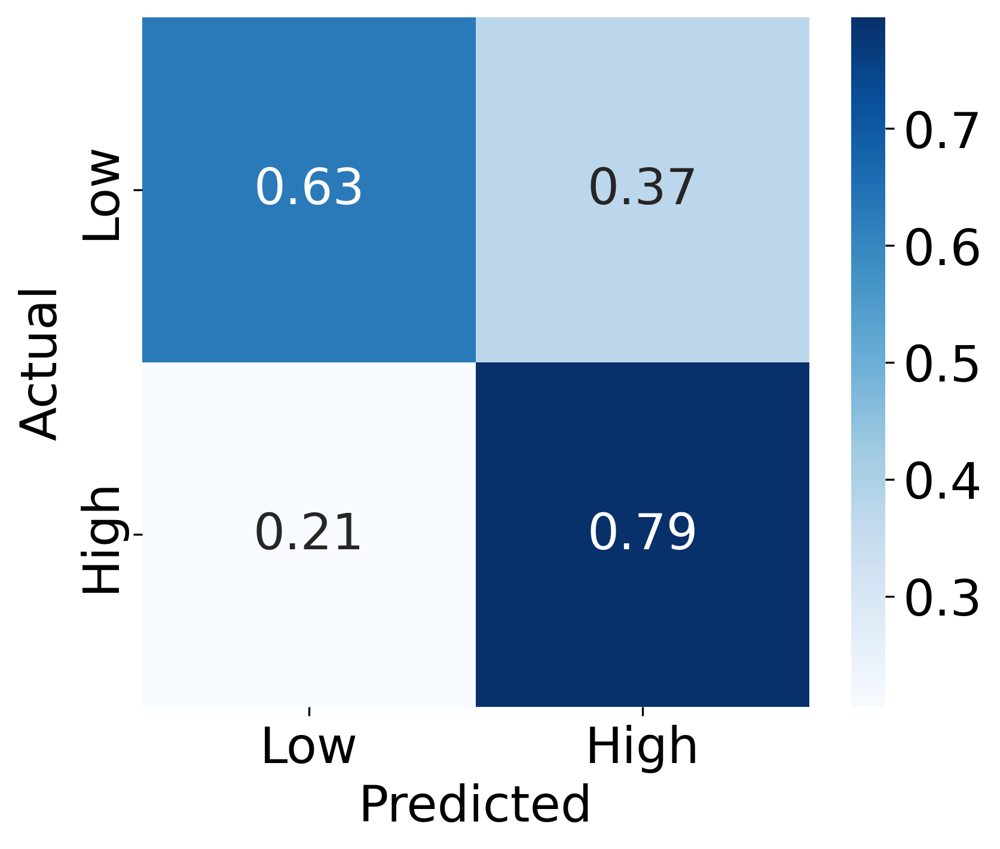

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming y_true and y_pred are already defined and possibly one-hot encoded
y_true = np.array(y_test)
y_pred = GRU.predict(x_test)

# If y_true or y_pred are one-hot encoded, flatten them
y_true = np.argmax(y_true, axis=1)  # Convert to label indices if one-hot encoded
y_pred = np.argmax(y_pred, axis=1)  # Convert to label indices if one-hot encoded

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot normalized confusion matrix using Seaborn heatmap
plt.figure(figsize=(6, 5))
ax = sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues',
                 xticklabels=['Low', 'High'],
                 yticklabels=['Low', 'High'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
#plt.title('Normalized Confusion Matrix')
plt.show()

## Proposed

Model: "functional_38"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 85, 1)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1 (Conv1D)   │ (None, 85, 32)    │        224 │ input_layer_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 85, 32)    │        128 │ conv1d_1[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 85, 32)    │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2 (Conv1D)   │ (None, 85, 32)    │      6,176 │ activation[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_3 (Conv1D)   │ (None, 85, 32)    │         64 │ input_layer_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 85, 32)    │        128 │ conv1d_2[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 85, 32)    │          0 │ conv1d_3[0][0],   │
│                     │                   │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 85, 32)    │          0 │ add[0][0]         │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_1     │ (None, 42, 32)    │          0 │ activation_1[0][… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_4 (Conv1D)   │ (None, 42, 64)    │     12,352 │ max_pooling1d_1[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 42, 64)    │        256 │ conv1d_4[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 42, 64)    │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_5 (Conv1D)   │ (None, 42, 64)    │     24,640 │ activation_2[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_6 (Conv1D)   │ (None, 42, 64)    │      2,112 │ max_pooling1d_1[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 42, 64)    │        256 │ conv1d_5[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 42, 64)    │          0 │ conv1d_6[0][0],   │
│                     │                   │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 42, 64)    │          0 │ add_1[0][0]       │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_2     │ (None, 21, 64)    │          0 │ activation_3[0][

 Total params: 1,003,170 (3.83 MB)

 Trainable params: 1,001,250 (3.82 MB)

 Non-trainable params: 1,920 (7.50 KB)

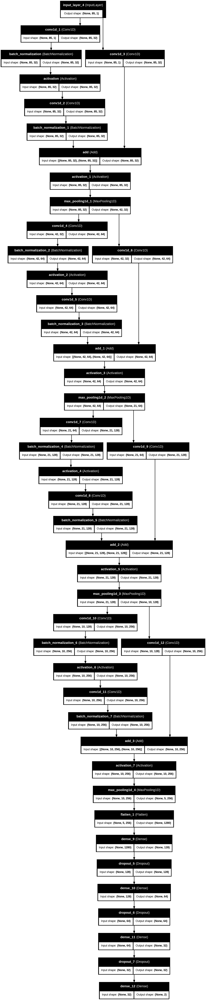

In [ ]:
from keras.layers import Input, Conv1D, BatchNormalization, MaxPooling1D, Flatten, Dense, Dropout, concatenate, Add, Activation
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.utils import plot_model

# Input shape
input_shape = (X_train.shape[1], 1)

# Input layer
input_layer = Input(input_shape)

# Residual block function
def residual_block(x, filters, kernel_size, pool_size=2):
    shortcut = x
    conv = Conv1D(filters, kernel_size, padding='same', activation=None)(x)
    conv = BatchNormalization()(conv)
    conv = Activation('relu')(conv)
    conv = Conv1D(filters, kernel_size, padding='same', activation=None)(conv)
    conv = BatchNormalization()(conv)
    shortcut = Conv1D(filters, 1, padding='same', activation=None)(shortcut)  # Adjust dimensions
    x = Add()([shortcut, conv])
    x = Activation('relu')(x)
    x = MaxPooling1D(pool_size)(x)
    return x

# Build residual blocks
x = residual_block(input_layer, 32, 6)
x = residual_block(x, 64, 6)
x = residual_block(x, 128, 6)
x = residual_block(x, 256, 6)

# Global average pooling for better generalization
gap = Flatten()(x)

# Fully connected layers
dense1 = Dense(128, activation='relu')(gap)
drop1 = Dropout(0.25)(dense1)

dense2 = Dense(64, activation='relu')(drop1)
drop2 = Dropout(0.25)(dense2)

dense3 = Dense(32, activation='relu')(drop2)
drop3 = Dropout(0.25)(dense3)

# Output layer
output_layer = Dense(2, activation='softmax')(drop3)

# Build the model
model = Model(input_layer, output_layer)
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Model summary
model.summary()

# Plot the model architecture
plot_model(model, to_file='enhanced_model_plot.png', show_shapes=True, show_layer_names=True)

In [ ]:
from tensorflow import keras

# Compile the model
model.compile(loss=keras.losses.categorical_crossentropy,
              optimizer='adam',
              metrics=['accuracy'])

In [ ]:
# check points and early stopping
from keras.callbacks import ModelCheckpoint,EarlyStopping

model_name = "CNN"
filepath = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/History/" + model_name + "weights-improvement-{epoch:02d}-{accuracy:.4f}.keras"
print(filepath)
checkpoint = ModelCheckpoint(filepath, monitor='accuracy', verbose=1, save_best_only=True, mode='max')
es = EarlyStopping(monitor='accuracy', mode='max', verbose=1, patience=10)
callbacks_list = [es, checkpoint]

/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/History/CNNweights-improvement-{epoch:02d}-{accuracy:.4f}.keras


In [ ]:

# Train the model
H = model.fit(X_train, Y_train,
          batch_size=100,
          epochs=100,
          verbose=1,
          validation_data=(x_test, y_test),
          callbacks= callbacks_list)


Epoch 1/100
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6162 - loss: 0.6373
Epoch 1: accuracy improved from -inf to 0.68881, saving model to /content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/History/CNNweights-improvement-01-0.6888.keras
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 42s 14ms/step - accuracy: 0.6163 - loss: 0.6373 - val_accuracy: 0.8070 - val_loss: 0.4121
Epoch 2/100
1769/1773 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8268 - loss: 0.3797
Epoch 2: accuracy improved from 0.68881 to 0.84520, saving model to /content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/History/CNNweights-improvement-02-0.8452.keras
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 14s 8ms/step - accuracy: 0.8269 - loss: 0.3796 - val_accuracy: 0.8888 - val_loss: 0.2598
Epoch 3/100
1771/1773 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8996 - loss: 0.2431
Epoch 3: accuracy improved from 0.84520 to 0.90589, saving model to /content/drive/Share

In [ ]:

from keras.models import save_model

model.save("/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/model.h5")


In [ ]:
from keras.models import load_model

model_loaded = load_model("/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/model.h5")

In [ ]:
# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(x_test, y_test, verbose=1)

# Print the test accuracy
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.9842 - loss: 0.1123
Test Accuracy: 98.43%


In [ ]:
score = model.evaluate(x_test, y_test, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.9842 - loss: 0.1123
Test loss: 0.10662387311458588
Test accuracy: 0.9842792749404907


In [ ]:
from sklearn.metrics import accuracy_score

# Get model predictions
y_pred = model_loaded.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convert probabilities to class predictions
y_true = np.argmax(y_test, axis=1)          # Convert one-hot encoded labels to class indices

# Compute accuracy for each class
class_accuracies = {}
for class_label in np.unique(y_true):
    indices = np.where(y_true == class_label)
    class_accuracy = accuracy_score(y_true[indices], y_pred_classes[indices])
    class_accuracies[class_label] = class_accuracy

# Print the test accuracies
for class_label, accuracy in class_accuracies.items():
    print(f'Test Accuracy for Class {class_label}: {accuracy * 100:.2f}%')

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step
Test Accuracy for Class 0: 98.11%
Test Accuracy for Class 1: 98.67%


In [ ]:

import pickle

# Specify the correct file path
history_file_path = '/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/History/history.pkl'

# Save the model history to the file
with open(history_file_path, 'wb') as file_pi:
    pickle.dump(H, file_pi)


In [ ]:
import pickle

# Correct path with file name and extension
history_filepath = '/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/History/history.pkl'

# Load the history from the file
with open(history_filepath, 'rb') as file:
    load_history = pickle.load(file)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 50 variables whereas the saved optimizer has 98 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


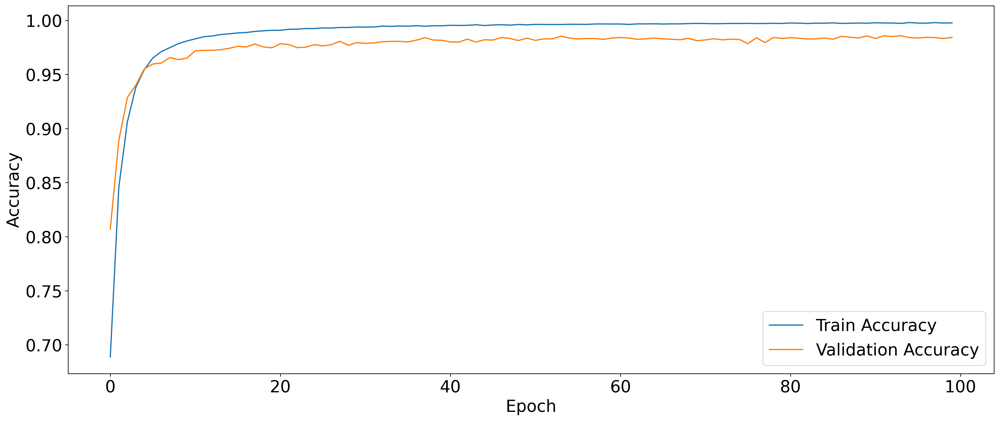

In [ ]:
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (20, 8)
plt.rcParams["font.size"] = 20

# Access accuracy and validation accuracy using the 'history' attribute
plt.plot(load_history.history['accuracy'], label='Train Accuracy')
plt.plot(load_history.history['val_accuracy'], label='Validation Accuracy')

#plt.title('CNN Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
plt.show()

In [ ]:
from keras.models import load_model

model_loaded = load_model("/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/model.h5")

In [ ]:
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Define the number of bootstrap iterations
n_bootstraps = 10
confidence_level = 0.95

# Function to calculate confidence intervals
def calculate_confidence_interval(data, confidence=0.95):
    lower_percentile = (1 - confidence) / 2 * 100
    upper_percentile = (1 + confidence) / 2 * 100
    lower_bound = np.percentile(data, lower_percentile)
    upper_bound = np.percentile(data, upper_percentile)
    return lower_bound, upper_bound

# Perform bootstrap
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

for _ in range(n_bootstraps):
    # Resample with replacement from the test set
    indices = np.random.choice(range(len(x_test)), size=len(x_test), replace=True)
    x_resampled = x_test[indices]
    y_resampled = y_test[indices]

    # Make predictions on the resampled data
    predictions = model_loaded.predict(x_resampled)
    y_pred = np.argmax(predictions, axis=1)  # Convert to class labels if needed

    # Ensure y_resampled is also in label format (convert if necessary)
    if y_resampled.ndim > 1 and y_resampled.shape[1] > 1:  # If one-hot encoded
        y_resampled = np.argmax(y_resampled, axis=1)

    # Calculate metrics
    accuracy_scores.append(accuracy_score(y_resampled, y_pred))
    precision_scores.append(precision_score(y_resampled, y_pred, average='weighted'))
    recall_scores.append(recall_score(y_resampled, y_pred, average='weighted'))
    f1_scores.append(f1_score(y_resampled, y_pred, average='weighted'))

# Calculate confidence intervals
accuracy_ci = calculate_confidence_interval(accuracy_scores, confidence=confidence_level)
precision_ci = calculate_confidence_interval(precision_scores, confidence=confidence_level)
recall_ci = calculate_confidence_interval(recall_scores, confidence=confidence_level)
f1_ci = calculate_confidence_interval(f1_scores, confidence=confidence_level)

# Print results
print(f"Confidence interval for accuracy: {accuracy_ci[0]:.4f} - {accuracy_ci[1]:.4f}")
print(f"Confidence interval for precision: {precision_ci[0]:.4f} - {precision_ci[1]:.4f}")
print(f"Confidence interval for recall: {recall_ci[0]:.4f} - {recall_ci[1]:.4f}")
print(f"Confidence interval for F1 score: {f1_ci[0]:.4f} - {f1_ci[1]:.4f}")

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step
Confidence interval for accuracy: 0.9838 - 0.9854
Confidence interval for precision: 0.9838 - 0.9854
Confidence interval for recall: 0.9838 - 0.9854
Confidence interval for F1 score: 0.9838 - 0.9854


In [ ]:
from keras.models import load_model

score = model_loaded.evaluate(x_test, y_test, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.9842 - loss: 0.1123
Test loss: 0.10662387311458588
Test accuracy: 0.9842792749404907


In [ ]:
y_true = np.array(y_test)
y_pred = model_loaded.predict(x_test)

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step


In [ ]:
y_pred = np.squeeze(y_pred)
y_pred = np.array(y_pred >= 0.5, dtype=int)  # Use 'int' instead of 'np.int'

from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98     25676
           1       0.99      0.99      0.99     33418

   micro avg       0.98      0.98      0.98     59094
   macro avg       0.98      0.98      0.98     59094
weighted avg       0.98      0.98      0.98     59094
 samples avg       0.98      0.98      0.98     59094



1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step


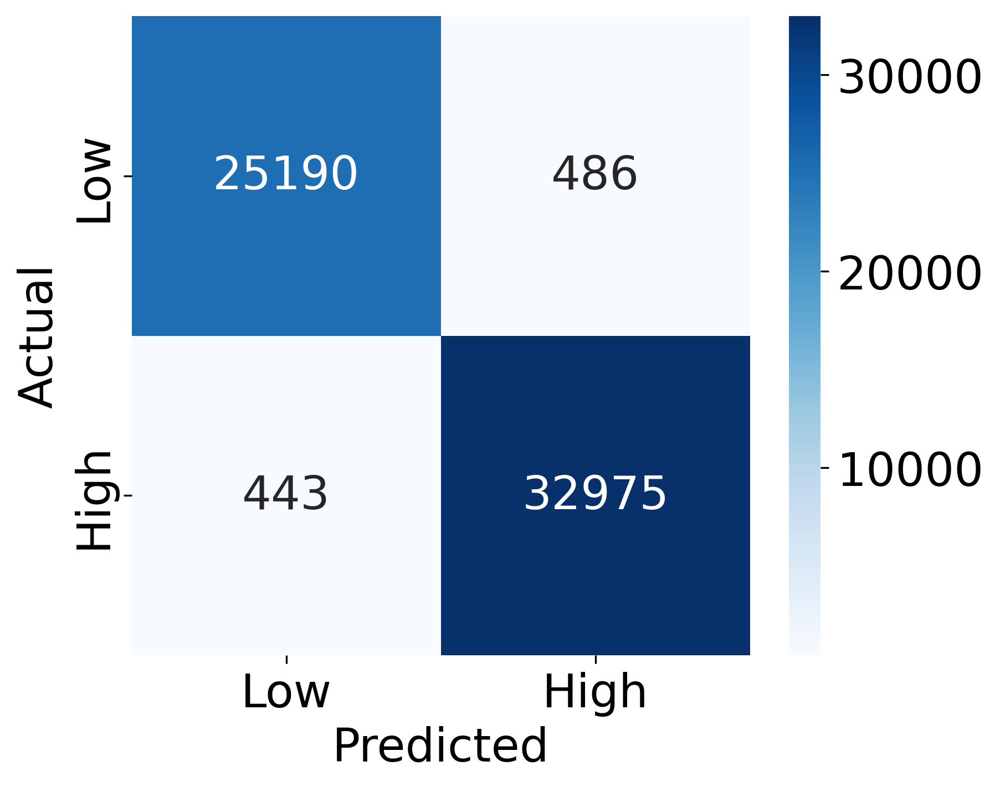

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming y_true and y_pred are already defined and possibly one-hot encoded
y_true = np.array(y_test)
y_pred = model_loaded.predict(x_test)

# If y_true or y_pred are one-hot encoded, flatten them
y_true = np.argmax(y_true, axis=1)  # Convert to label indices if one-hot encoded
y_pred = np.argmax(y_pred, axis=1)  # Convert to label indices if one-hot encoded

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot confusion matrix using Seaborn heatmap
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Low', 'High'], yticklabels=['Low', 'High'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
# plt.title('Confusion Matrix')
plt.show()

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step


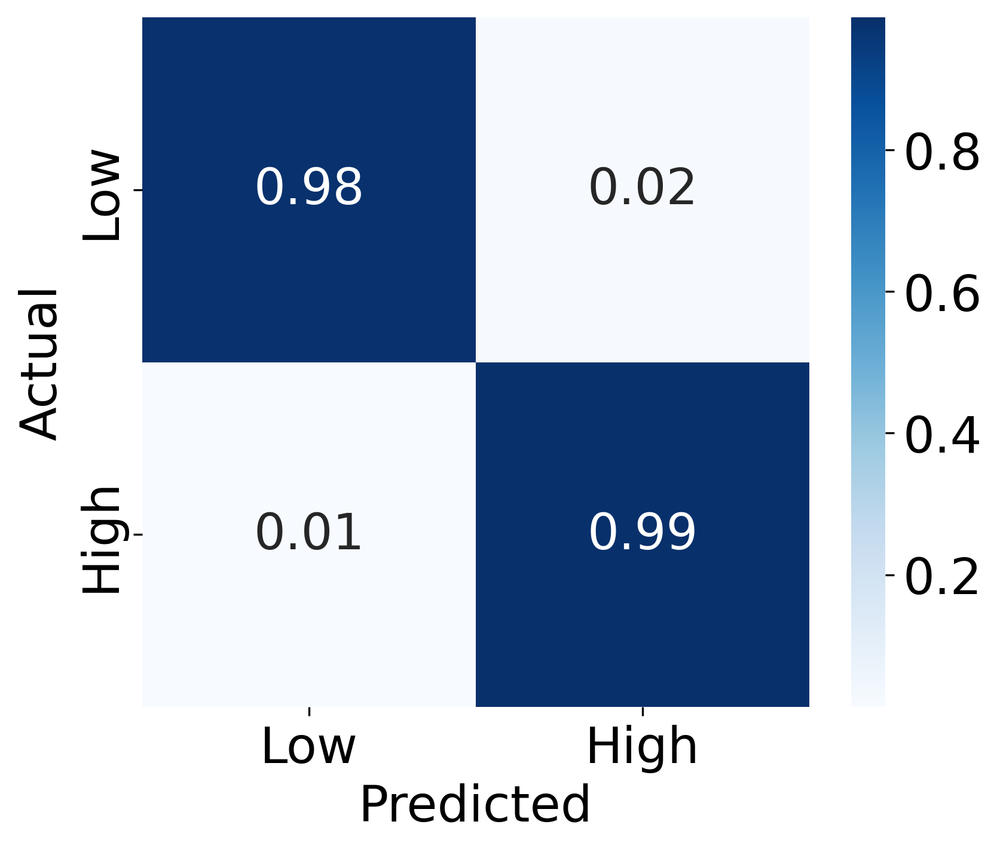

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming y_true and y_pred are already defined and possibly one-hot encoded
y_true = np.array(y_test)
y_pred = model_loaded.predict(x_test)

# If y_true or y_pred are one-hot encoded, flatten them
y_true = np.argmax(y_true, axis=1)  # Convert to label indices if one-hot encoded
y_pred = np.argmax(y_pred, axis=1)  # Convert to label indices if one-hot encoded

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot normalized confusion matrix using Seaborn heatmap
plt.figure(figsize=(6, 5))
ax = sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues',
                 xticklabels=['Low', 'High'],
                 yticklabels=['Low', 'High'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
#plt.title('Normalized Confusion Matrix')
plt.show()

# Arousal

In [ ]:
# Importing Dataset
train = pd.read_csv('/content/drive/Shareddrives/Best Shared Drive Ever/EEG/AMIGO data/Pre-processed/train_data.csv')
test = pd.read_csv('/content/drive/Shareddrives/Best Shared Drive Ever/EEG/AMIGO data/Pre-processed/test_data.csv')

In [ ]:
train = train.dropna()

In [ ]:
test = test.dropna()

In [ ]:
# Rename the column 'Dominance' to 'Dominancencoded_e'
train.rename(columns={'Domain': 'Dominance'}, inplace=True)
test.rename(columns={'Domain': 'Dominance'}, inplace=True)

In [ ]:
# Rename the column 'Liking' to 'Liking'
train.rename(columns={'Like': 'Liking'}, inplace=True)
test.rename(columns={'Like': 'Liking'}, inplace=True)

In [ ]:
# Copy the original dataset
encoded_train = train.copy()

# List of columns to modify
# columns_to_modify = ['Valence', 'Arousal', 'Dominance', 'Liking']
columns_to_modify = ['Arousal']

# Apply the transformation: 1-4.99 becomes 0, everything else becomes 1
encoded_train[columns_to_modify] = encoded_train[columns_to_modify].applymap(
    lambda x: 0 if 1 <= x <= 4.99 else 1
)

<ipython-input-194-2eab4b18cd24>:9: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  encoded_train[columns_to_modify] = encoded_train[columns_to_modify].applymap(


In [ ]:
# Replace 9 with 8.99 in specified columns
columns_to_update = ['Valence', 'Dominance', 'Liking']
encoded_train[columns_to_update] = encoded_train[columns_to_update].replace(9, 8.99)

In [ ]:
# Copy
encoded_test = test.copy()

# List of columns to modify
#columns_to_modify = ['Valence', 'Arousal', 'Dominance', 'Liking']
columns_to_modify = ['Arousal']

# Apply the transformation: 1-4.99 becomes 0, 5-9 becomes 1
encoded_test[columns_to_modify] = encoded_test[columns_to_modify].applymap(
    lambda x: 0 if 1 <= x <= 4.99 else 1
)

<ipython-input-196-87c013976b14>:9: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  encoded_test[columns_to_modify] = encoded_test[columns_to_modify].applymap(


In [ ]:
# Replace 9 with 8.99 in specified columns
columns_to_update = ['Valence', 'Dominance', 'Liking']
encoded_test[columns_to_update] = encoded_test[columns_to_update].replace(9, 8.99)

## Train-Test Split

### Arousal

In [ ]:
# Labeling
X_train = encoded_train.drop(['Valence', 'Arousal', 'Dominance', 'Liking'], axis=1) # Input features
Y_train = encoded_train['Arousal'] # Target label

x_test = encoded_test.drop(['Valence', 'Arousal', 'Dominance', 'Liking'], axis=1) # Input features
y_test = encoded_test['Arousal'] # Target label

In [ ]:
# Train Count
print(Y_train.value_counts())

Arousal
1    109074
0     68208
Name: count, dtype: int64


In [ ]:
# Train Count
print(y_test.value_counts())

Arousal
1    36358
0    22736
Name: count, dtype: int64


### Deep Learning Algorithms

In [ ]:
# Fit the train and test data with StandarScaler

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
x_test = scaler.fit_transform(x_test)

In [ ]:
from tensorflow.keras.utils import to_categorical

# Reshape the input data
X_train = np.expand_dims(X_train, axis=-1)
x_test = np.expand_dims(x_test, axis=-1)

# One-hot encode the labels
Y_train = to_categorical(Y_train, num_classes=2)
y_test = to_categorical(y_test, num_classes=2)

## Proposed

Model: "functional_39"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 85, 1)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_13 (Conv1D)  │ (None, 85, 32)    │        224 │ input_layer_5[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 85, 32)    │        128 │ conv1d_13[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_8        │ (None, 85, 32)    │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_14 (Conv1D)  │ (None, 85, 32)    │      6,176 │ activation_8[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_15 (Conv1D)  │ (None, 85, 32)    │         64 │ input_layer_5[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 85, 32)    │        128 │ conv1d_14[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_4 (Add)         │ (None, 85, 32)    │          0 │ conv1d_15[0][0],  │
│                     │                   │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_9        │ (None, 85, 32)    │          0 │ add_4[0][0]       │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_5     │ (None, 42, 32)    │          0 │ activation_9[0][… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_16 (Conv1D)  │ (None, 42, 64)    │     12,352 │ max_pooling1d_5[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 42, 64)    │        256 │ conv1d_16[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_10       │ (None, 42, 64)    │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_17 (Conv1D)  │ (None, 42, 64)    │     24,640 │ activation_10[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_18 (Conv1D)  │ (None, 42, 64)    │      2,112 │ max_pooling1d_5[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 42, 64)    │        256 │ conv1d_17[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_5 (Add)         │ (None, 42, 64)    │          0 │ conv1d_18[0][0],  │
│                     │                   │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_11       │ (None, 42, 64)    │          0 │ add_5[0][0]       │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_6     │ (None, 21, 64)    │          0 │ activation_11[0]

 Total params: 1,003,170 (3.83 MB)

 Trainable params: 1,001,250 (3.82 MB)

 Non-trainable params: 1,920 (7.50 KB)

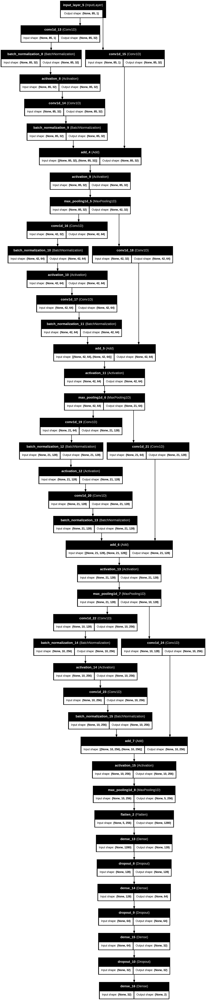

In [ ]:
from keras.layers import Input, Conv1D, BatchNormalization, MaxPooling1D, Flatten, Dense, Dropout, concatenate, Add, Activation
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.utils import plot_model

# Input shape
input_shape = (X_train.shape[1], 1)

# Input layer
input_layer = Input(input_shape)

# Residual block function
def residual_block(x, filters, kernel_size, pool_size=2):
    shortcut = x
    conv = Conv1D(filters, kernel_size, padding='same', activation=None)(x)
    conv = BatchNormalization()(conv)
    conv = Activation('relu')(conv)
    conv = Conv1D(filters, kernel_size, padding='same', activation=None)(conv)
    conv = BatchNormalization()(conv)
    shortcut = Conv1D(filters, 1, padding='same', activation=None)(shortcut)  # Adjust dimensions
    x = Add()([shortcut, conv])
    x = Activation('relu')(x)
    x = MaxPooling1D(pool_size)(x)
    return x

# Build residual blocks
x = residual_block(input_layer, 32, 6)
x = residual_block(x, 64, 6)
x = residual_block(x, 128, 6)
x = residual_block(x, 256, 6)

# Global average pooling for better generalization
gap = Flatten()(x)

# Fully connected layers
dense1 = Dense(128, activation='relu')(gap)
drop1 = Dropout(0.25)(dense1)

dense2 = Dense(64, activation='relu')(drop1)
drop2 = Dropout(0.25)(dense2)

dense3 = Dense(32, activation='relu')(drop2)
drop3 = Dropout(0.25)(dense3)

# Output layer
output_layer = Dense(2, activation='softmax')(drop3)

# Build the model
model = Model(input_layer, output_layer)
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Model summary
model.summary()

# Plot the model architecture
plot_model(model, to_file='enhanced_model_plot.png', show_shapes=True, show_layer_names=True)

In [ ]:
from tensorflow import keras

# Compile the model
model.compile(loss=keras.losses.categorical_crossentropy,
              optimizer='adam',
              metrics=['accuracy'])

In [ ]:
# check points and early stopping
from keras.callbacks import ModelCheckpoint,EarlyStopping

model_name = "CNN"
filepath = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Arousal/History/" + model_name + "weights-improvement-{epoch:02d}-{accuracy:.4f}.keras"
print(filepath)
checkpoint = ModelCheckpoint(filepath, monitor='accuracy', verbose=1, save_best_only=True, mode='max')
es = EarlyStopping(monitor='accuracy', mode='max', verbose=1, patience=10)
callbacks_list = [es, checkpoint]

/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Arousal/History/CNNweights-improvement-{epoch:02d}-{accuracy:.4f}.keras


In [ ]:

# Train the model
H = model.fit(X_train, Y_train,
          batch_size=100,
          epochs=100,
          verbose=1,
          validation_data=(x_test, y_test),
          callbacks= callbacks_list)


Epoch 1/100
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7205 - loss: 0.5375
Epoch 1: accuracy improved from -inf to 0.78122, saving model to /content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Arousal/History/CNNweights-improvement-01-0.7812.keras
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 41s 14ms/step - accuracy: 0.7205 - loss: 0.5375 - val_accuracy: 0.8664 - val_loss: 0.2934
Epoch 2/100
1771/1773 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8775 - loss: 0.2789
Epoch 2: accuracy improved from 0.78122 to 0.89107, saving model to /content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Arousal/History/CNNweights-improvement-02-0.8911.keras
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 16s 9ms/step - accuracy: 0.8776 - loss: 0.2789 - val_accuracy: 0.9112 - val_loss: 0.2107
Epoch 3/100
1771/1773 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9314 - loss: 0.1725
Epoch 3: accuracy improved from 0.89107 to 0.93575, saving model to /con

In [ ]:

from keras.models import save_model

model.save("/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Arousal/model.h5")


In [ ]:
from keras.models import load_model

model_loaded = load_model("/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Arousal/model.h5")

In [ ]:
# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(x_test, y_test, verbose=1)

# Print the test accuracy
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.9872 - loss: 0.0558
Test Accuracy: 98.96%


In [ ]:
score = model.evaluate(x_test, y_test, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.9872 - loss: 0.0558
Test loss: 0.04501410946249962
Test accuracy: 0.9895759224891663


In [ ]:
from sklearn.metrics import accuracy_score

# Get model predictions
y_pred = model_loaded.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convert probabilities to class predictions
y_true = np.argmax(y_test, axis=1)          # Convert one-hot encoded labels to class indices

# Compute accuracy for each class
class_accuracies = {}
for class_label in np.unique(y_true):
    indices = np.where(y_true == class_label)
    class_accuracy = accuracy_score(y_true[indices], y_pred_classes[indices])
    class_accuracies[class_label] = class_accuracy

# Print the test accuracies
for class_label, accuracy in class_accuracies.items():
    print(f'Test Accuracy for Class {class_label}: {accuracy * 100:.2f}%')

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step
Test Accuracy for Class 0: 98.21%
Test Accuracy for Class 1: 99.43%


In [ ]:

import pickle

# Specify the correct file path
history_file_path = '/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Arousal/History/history.pkl'

# Save the model history to the file
with open(history_file_path, 'wb') as file_pi:
    pickle.dump(H, file_pi)


In [ ]:
import pickle

# Correct path with file name and extension
history_filepath = '/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Arousal/History/history.pkl'

# Load the history from the file
with open(history_filepath, 'rb') as file:
    load_history = pickle.load(file)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 50 variables whereas the saved optimizer has 98 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


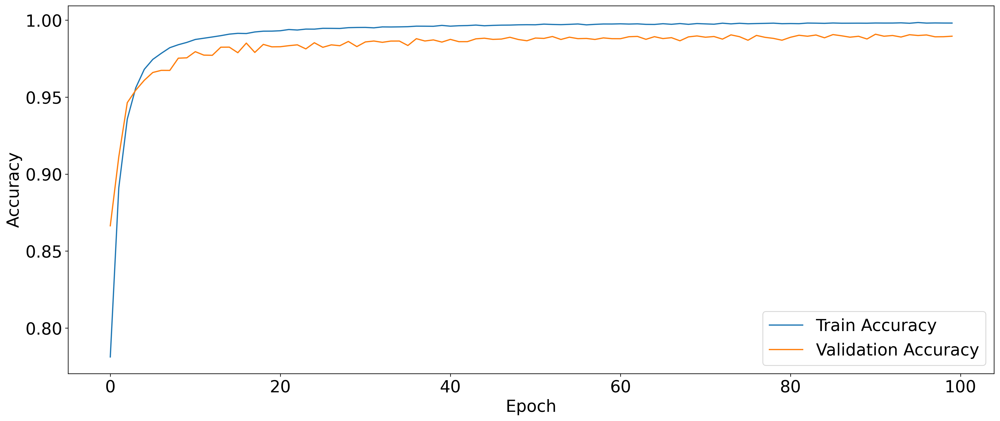

In [ ]:
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (20, 8)
plt.rcParams["font.size"] = 20

# Access accuracy and validation accuracy using the 'history' attribute
plt.plot(load_history.history['accuracy'], label='Train Accuracy')
plt.plot(load_history.history['val_accuracy'], label='Validation Accuracy')

#plt.title('CNN Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
plt.show()

In [ ]:
from keras.models import load_model

model_loaded = load_model("/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Arousal/model.h5")

In [ ]:
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Define the number of bootstrap iterations
n_bootstraps = 10
confidence_level = 0.95

# Function to calculate confidence intervals
def calculate_confidence_interval(data, confidence=0.95):
    lower_percentile = (1 - confidence) / 2 * 100
    upper_percentile = (1 + confidence) / 2 * 100
    lower_bound = np.percentile(data, lower_percentile)
    upper_bound = np.percentile(data, upper_percentile)
    return lower_bound, upper_bound

# Perform bootstrap
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

for _ in range(n_bootstraps):
    # Resample with replacement from the test set
    indices = np.random.choice(range(len(x_test)), size=len(x_test), replace=True)
    x_resampled = x_test[indices]
    y_resampled = y_test[indices]

    # Make predictions on the resampled data
    predictions = model_loaded.predict(x_resampled)
    y_pred = np.argmax(predictions, axis=1)  # Convert to class labels if needed

    # Ensure y_resampled is also in label format (convert if necessary)
    if y_resampled.ndim > 1 and y_resampled.shape[1] > 1:  # If one-hot encoded
        y_resampled = np.argmax(y_resampled, axis=1)

    # Calculate metrics
    accuracy_scores.append(accuracy_score(y_resampled, y_pred))
    precision_scores.append(precision_score(y_resampled, y_pred, average='weighted'))
    recall_scores.append(recall_score(y_resampled, y_pred, average='weighted'))
    f1_scores.append(f1_score(y_resampled, y_pred, average='weighted'))

# Calculate confidence intervals
accuracy_ci = calculate_confidence_interval(accuracy_scores, confidence=confidence_level)
precision_ci = calculate_confidence_interval(precision_scores, confidence=confidence_level)
recall_ci = calculate_confidence_interval(recall_scores, confidence=confidence_level)
f1_ci = calculate_confidence_interval(f1_scores, confidence=confidence_level)

# Print results
print(f"Confidence interval for accuracy: {accuracy_ci[0]:.4f} - {accuracy_ci[1]:.4f}")
print(f"Confidence interval for precision: {precision_ci[0]:.4f} - {precision_ci[1]:.4f}")
print(f"Confidence interval for recall: {recall_ci[0]:.4f} - {recall_ci[1]:.4f}")
print(f"Confidence interval for F1 score: {f1_ci[0]:.4f} - {f1_ci[1]:.4f}")

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step
Confidence interval for accuracy: 0.9892 - 0.9903
Confidence interval for precision: 0.9892 - 0.9903
Confidence interval for recall: 0.9892 - 0.9903
Confidence interval for F1 score: 0.9892 - 0.9903


In [ ]:
from keras.models import load_model

score = model_loaded.evaluate(x_test, y_test, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.9872 - loss: 0.0558
Test loss: 0.04501410946249962
Test accuracy: 0.9895759224891663


In [ ]:
y_true = np.array(y_test)
y_pred = model_loaded.predict(x_test)

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step


In [ ]:
y_pred = np.squeeze(y_pred)
y_pred = np.array(y_pred >= 0.5, dtype=int)  # Use 'int' instead of 'np.int'

from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99     22736
           1       0.99      0.99      0.99     36358

   micro avg       0.99      0.99      0.99     59094
   macro avg       0.99      0.99      0.99     59094
weighted avg       0.99      0.99      0.99     59094
 samples avg       0.99      0.99      0.99     59094



1847/1847 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step


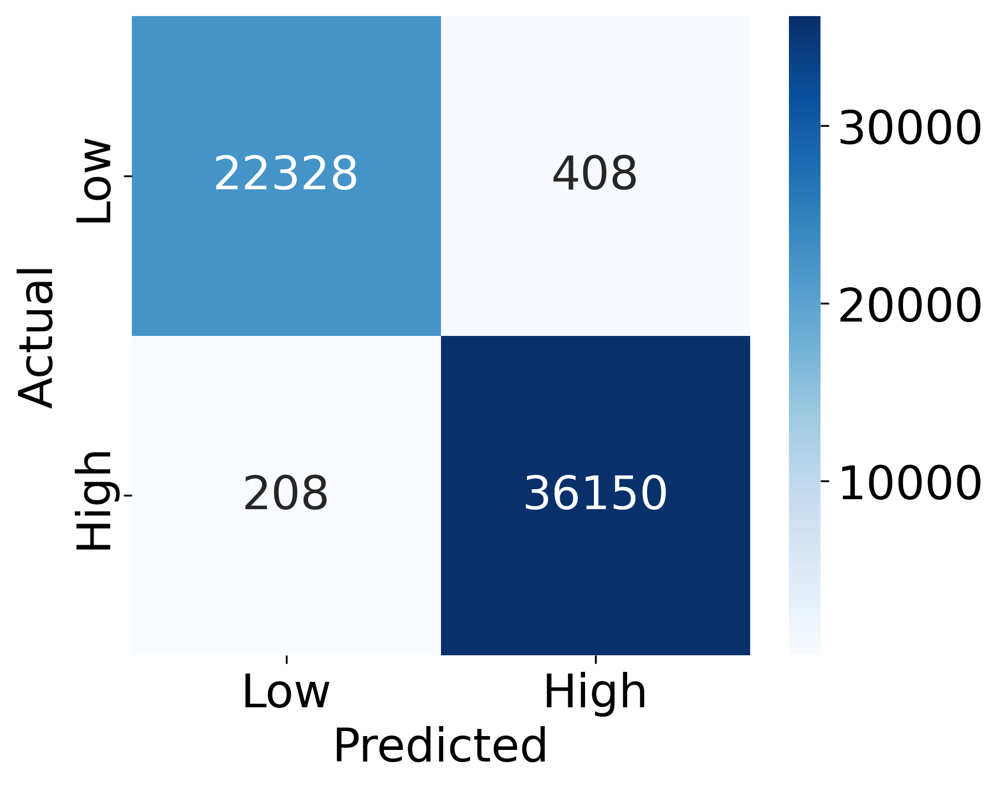

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming y_true and y_pred are already defined and possibly one-hot encoded
y_true = np.array(y_test)
y_pred = model_loaded.predict(x_test)

# If y_true or y_pred are one-hot encoded, flatten them
y_true = np.argmax(y_true, axis=1)  # Convert to label indices if one-hot encoded
y_pred = np.argmax(y_pred, axis=1)  # Convert to label indices if one-hot encoded

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot confusion matrix using Seaborn heatmap
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Low', 'High'], yticklabels=['Low', 'High'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
# plt.title('Confusion Matrix')
plt.show()

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step


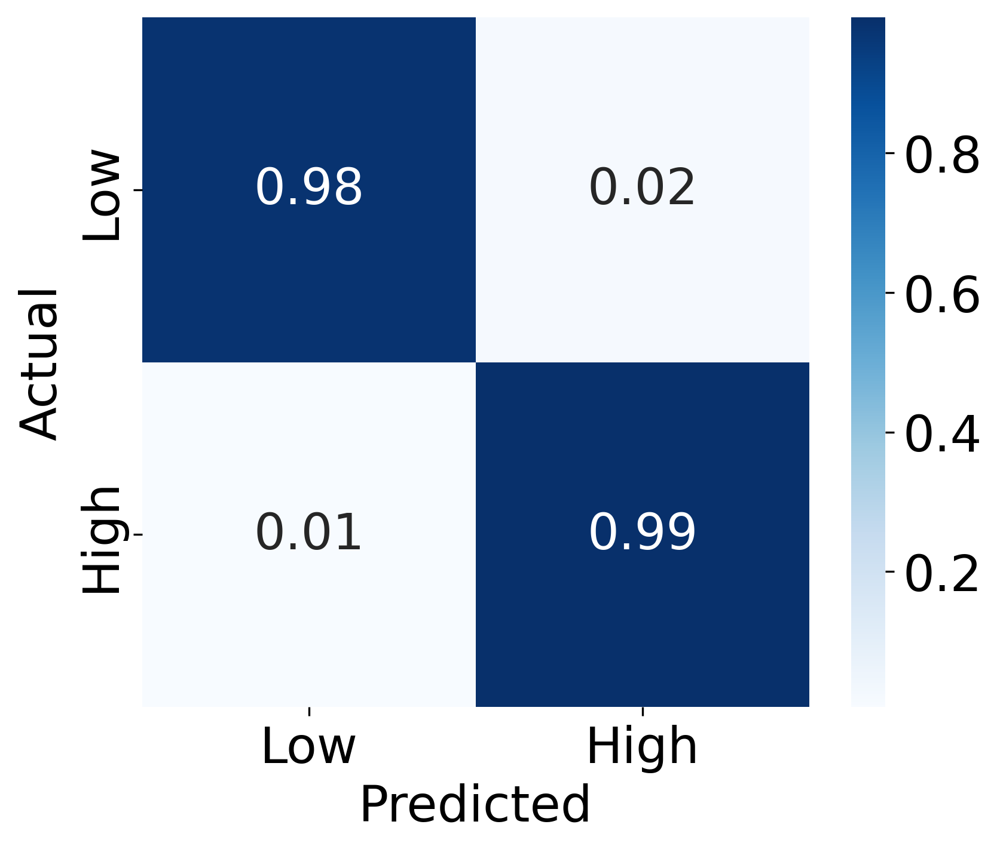

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming y_true and y_pred are already defined and possibly one-hot encoded
y_true = np.array(y_test)
y_pred = model_loaded.predict(x_test)

# If y_true or y_pred are one-hot encoded, flatten them
y_true = np.argmax(y_true, axis=1)  # Convert to label indices if one-hot encoded
y_pred = np.argmax(y_pred, axis=1)  # Convert to label indices if one-hot encoded

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot normalized confusion matrix using Seaborn heatmap
plt.figure(figsize=(6, 5))
ax = sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues',
                 xticklabels=['Low', 'High'],
                 yticklabels=['Low', 'High'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
#plt.title('Normalized Confusion Matrix')
plt.show()

# Dominance

In [ ]:
# Importing Dataset
train = pd.read_csv('/content/drive/Shareddrives/Best Shared Drive Ever/EEG/AMIGO data/Pre-processed/train_data.csv')
test = pd.read_csv('/content/drive/Shareddrives/Best Shared Drive Ever/EEG/AMIGO data/Pre-processed/test_data.csv')

In [ ]:
train = train.dropna()

In [ ]:
test = test.dropna()

In [ ]:
# Rename the column 'Dominance' to 'Dominancencoded_e'
train.rename(columns={'Domain': 'Dominance'}, inplace=True)
test.rename(columns={'Domain': 'Dominance'}, inplace=True)

<ipython-input-228-e6ef128ed694>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train.rename(columns={'Domain': 'Dominance'}, inplace=True)
<ipython-input-228-e6ef128ed694>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test.rename(columns={'Domain': 'Dominance'}, inplace=True)


In [ ]:
# Rename the column 'Liking' to 'Liking'
train.rename(columns={'Like': 'Liking'}, inplace=True)
test.rename(columns={'Like': 'Liking'}, inplace=True)

<ipython-input-229-4a264b00db60>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train.rename(columns={'Like': 'Liking'}, inplace=True)
<ipython-input-229-4a264b00db60>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test.rename(columns={'Like': 'Liking'}, inplace=True)


In [ ]:
# Copy the original dataset
encoded_train = train.copy()

# List of columns to modify
# columns_to_modify = ['Valence', 'Arousal', 'Dominance', 'Liking']
columns_to_modify = ['Dominance']

# Apply the transformation: 1-4.99 becomes 0, everything else becomes 1
encoded_train[columns_to_modify] = encoded_train[columns_to_modify].applymap(
    lambda x: 0 if 1 <= x <= 4.99 else 1
)

<ipython-input-230-f6a5e8d3b0a5>:9: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  encoded_train[columns_to_modify] = encoded_train[columns_to_modify].applymap(


In [ ]:
# Replace 9 with 8.99 in specified columns
columns_to_update = ['Valence', 'Arousal', 'Liking']
encoded_train[columns_to_update] = encoded_train[columns_to_update].replace(9, 8.99)

In [ ]:
# Copy
encoded_test = test.copy()

# List of columns to modify
#columns_to_modify = ['Valence', 'Arousal', 'Dominance', 'Liking']
columns_to_modify = ['Dominance']

# Apply the transformation: 1-4.99 becomes 0, 5-9 becomes 1
encoded_test[columns_to_modify] = encoded_test[columns_to_modify].applymap(
    lambda x: 0 if 1 <= x <= 4.99 else 1
)

<ipython-input-232-5a0bdd7ff4b1>:9: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  encoded_test[columns_to_modify] = encoded_test[columns_to_modify].applymap(


In [ ]:
# Replace 9 with 8.99 in specified columns
columns_to_update = ['Valence', 'Arousal', 'Liking']
encoded_test[columns_to_update] = encoded_test[columns_to_update].replace(9, 8.99)

## Train-Test Split

### Dominance

In [ ]:
# Labeling
X_train = encoded_train.drop(['Valence', 'Arousal', 'Dominance', 'Liking'], axis=1) # Input features
Y_train = encoded_train['Dominance'] # Target label

x_test = encoded_test.drop(['Valence', 'Arousal', 'Dominance', 'Liking'], axis=1) # Input features
y_test = encoded_test['Dominance'] # Target label

In [ ]:
# Train Count
print(Y_train.value_counts())

Dominance
0    88788
1    88494
Name: count, dtype: int64


In [ ]:
# Train Count
print(y_test.value_counts())

Dominance
0    29596
1    29498
Name: count, dtype: int64


### Deep Learning Algorithms

In [ ]:
# Fit the train and test data with StandarScaler

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
x_test = scaler.fit_transform(x_test)

In [ ]:
from tensorflow.keras.utils import to_categorical

# Reshape the input data
X_train = np.expand_dims(X_train, axis=-1)
x_test = np.expand_dims(x_test, axis=-1)

# One-hot encode the labels
Y_train = to_categorical(Y_train, num_classes=2)
y_test = to_categorical(y_test, num_classes=2)

## Proposed

Model: "functional_40"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6       │ (None, 85, 1)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_25 (Conv1D)  │ (None, 85, 32)    │        224 │ input_layer_6[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 85, 32)    │        128 │ conv1d_25[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_16       │ (None, 85, 32)    │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_26 (Conv1D)  │ (None, 85, 32)    │      6,176 │ activation_16[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_27 (Conv1D)  │ (None, 85, 32)    │         64 │ input_layer_6[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 85, 32)    │        128 │ conv1d_26[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_8 (Add)         │ (None, 85, 32)    │          0 │ conv1d_27[0][0],  │
│                     │                   │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_17       │ (None, 85, 32)    │          0 │ add_8[0][0]       │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_9     │ (None, 42, 32)    │          0 │ activation_17[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_28 (Conv1D)  │ (None, 42, 64)    │     12,352 │ max_pooling1d_9[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 42, 64)    │        256 │ conv1d_28[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_18       │ (None, 42, 64)    │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_29 (Conv1D)  │ (None, 42, 64)    │     24,640 │ activation_18[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_30 (Conv1D)  │ (None, 42, 64)    │      2,112 │ max_pooling1d_9[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 42, 64)    │        256 │ conv1d_29[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_9 (Add)         │ (None, 42, 64)    │          0 │ conv1d_30[0][0],  │
│                     │                   │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_19       │ (None, 42, 64)    │          0 │ add_9[0][0]       │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_10    │ (None, 21, 64)    │          0 │ activation_19[0]

 Total params: 1,003,170 (3.83 MB)

 Trainable params: 1,001,250 (3.82 MB)

 Non-trainable params: 1,920 (7.50 KB)

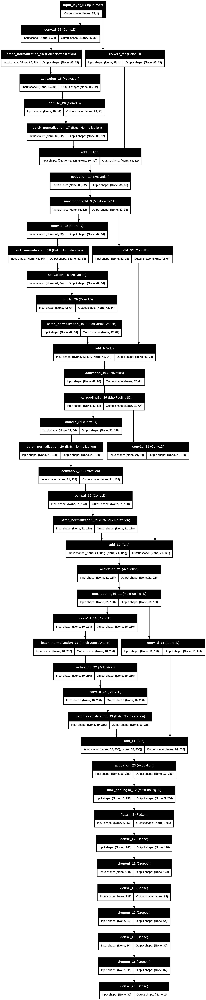

In [ ]:
from keras.layers import Input, Conv1D, BatchNormalization, MaxPooling1D, Flatten, Dense, Dropout, concatenate, Add, Activation
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.utils import plot_model

# Input shape
input_shape = (X_train.shape[1], 1)

# Input layer
input_layer = Input(input_shape)

# Residual block function
def residual_block(x, filters, kernel_size, pool_size=2):
    shortcut = x
    conv = Conv1D(filters, kernel_size, padding='same', activation=None)(x)
    conv = BatchNormalization()(conv)
    conv = Activation('relu')(conv)
    conv = Conv1D(filters, kernel_size, padding='same', activation=None)(conv)
    conv = BatchNormalization()(conv)
    shortcut = Conv1D(filters, 1, padding='same', activation=None)(shortcut)  # Adjust dimensions
    x = Add()([shortcut, conv])
    x = Activation('relu')(x)
    x = MaxPooling1D(pool_size)(x)
    return x

# Build residual blocks
x = residual_block(input_layer, 32, 6)
x = residual_block(x, 64, 6)
x = residual_block(x, 128, 6)
x = residual_block(x, 256, 6)

# Global average pooling for better generalization
gap = Flatten()(x)

# Fully connected layers
dense1 = Dense(128, activation='relu')(gap)
drop1 = Dropout(0.25)(dense1)

dense2 = Dense(64, activation='relu')(drop1)
drop2 = Dropout(0.25)(dense2)

dense3 = Dense(32, activation='relu')(drop2)
drop3 = Dropout(0.25)(dense3)

# Output layer
output_layer = Dense(2, activation='softmax')(drop3)

# Build the model
model = Model(input_layer, output_layer)
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Model summary
model.summary()

# Plot the model architecture
plot_model(model, to_file='enhanced_model_plot.png', show_shapes=True, show_layer_names=True)

In [ ]:
from tensorflow import keras

# Compile the model
model.compile(loss=keras.losses.categorical_crossentropy,
              optimizer='adam',
              metrics=['accuracy'])

In [ ]:
# check points and early stopping
from keras.callbacks import ModelCheckpoint,EarlyStopping

model_name = "CNN"
filepath = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Dominance/History/" + model_name + "weights-improvement-{epoch:02d}-{accuracy:.4f}.keras"
print(filepath)
checkpoint = ModelCheckpoint(filepath, monitor='accuracy', verbose=1, save_best_only=True, mode='max')
es = EarlyStopping(monitor='accuracy', mode='max', verbose=1, patience=10)
callbacks_list = [es, checkpoint]

/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Dominance/History/CNNweights-improvement-{epoch:02d}-{accuracy:.4f}.keras


In [ ]:

# Train the model
H = model.fit(X_train, Y_train,
          batch_size=100,
          epochs=100,
          verbose=1,
          validation_data=(x_test, y_test),
          callbacks= callbacks_list)


Epoch 1/100
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6317 - loss: 0.6213
Epoch 1: accuracy improved from -inf to 0.71495, saving model to /content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Dominance/History/CNNweights-improvement-01-0.7149.keras
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 40s 15ms/step - accuracy: 0.6317 - loss: 0.6212 - val_accuracy: 0.8117 - val_loss: 0.3919
Epoch 2/100
1766/1773 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8416 - loss: 0.3453
Epoch 2: accuracy improved from 0.71495 to 0.86091, saving model to /content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Dominance/History/CNNweights-improvement-02-0.8609.keras
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 23s 8ms/step - accuracy: 0.8417 - loss: 0.3452 - val_accuracy: 0.8980 - val_loss: 0.2522
Epoch 3/100
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9094 - loss: 0.2166
Epoch 3: accuracy improved from 0.86091 to 0.91637, saving model to 

In [ ]:

from keras.models import save_model

model.save("/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Dominance/model.h5")


In [ ]:
from keras.models import load_model

model_loaded = load_model("/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Dominance/model.h5")

In [ ]:
# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(x_test, y_test, verbose=1)

# Print the test accuracy
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.9866 - loss: 0.0781
Test Accuracy: 98.62%


In [ ]:
score = model.evaluate(x_test, y_test, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.9866 - loss: 0.0781
Test loss: 0.07694978266954422
Test accuracy: 0.9862253069877625


In [ ]:
from sklearn.metrics import accuracy_score

# Get model predictions
y_pred = model_loaded.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convert probabilities to class predictions
y_true = np.argmax(y_test, axis=1)          # Convert one-hot encoded labels to class indices

# Compute accuracy for each class
class_accuracies = {}
for class_label in np.unique(y_true):
    indices = np.where(y_true == class_label)
    class_accuracy = accuracy_score(y_true[indices], y_pred_classes[indices])
    class_accuracies[class_label] = class_accuracy

# Print the test accuracies
for class_label, accuracy in class_accuracies.items():
    print(f'Test Accuracy for Class {class_label}: {accuracy * 100:.2f}%')

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step
Test Accuracy for Class 0: 98.57%
Test Accuracy for Class 1: 98.67%


In [ ]:

import pickle

# Specify the correct file path
history_file_path = '/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Dominance/History/history.pkl'

# Save the model history to the file
with open(history_file_path, 'wb') as file_pi:
    pickle.dump(H, file_pi)


In [ ]:
import pickle

# Correct path with file name and extension
history_filepath = '/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Dominance/History/history.pkl'

# Load the history from the file
with open(history_filepath, 'rb') as file:
    load_history = pickle.load(file)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 50 variables whereas the saved optimizer has 98 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


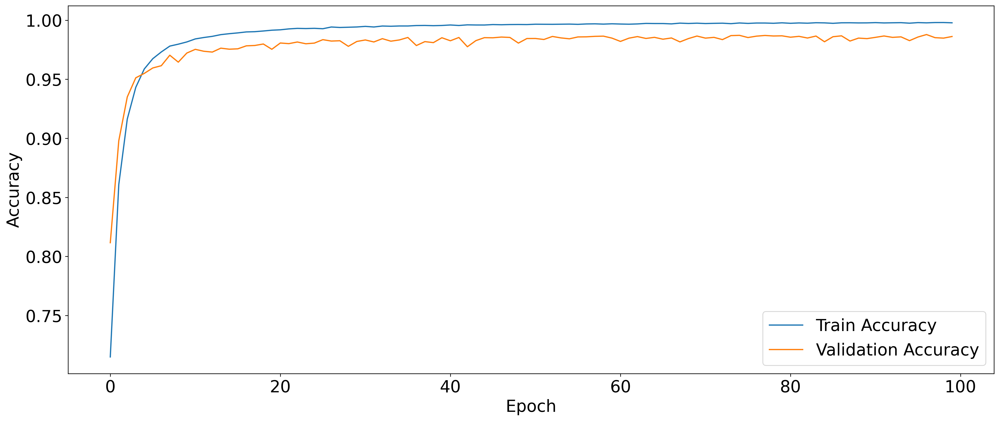

In [ ]:
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (20, 8)
plt.rcParams["font.size"] = 20

# Access accuracy and validation accuracy using the 'history' attribute
plt.plot(load_history.history['accuracy'], label='Train Accuracy')
plt.plot(load_history.history['val_accuracy'], label='Validation Accuracy')

#plt.title('CNN Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
plt.show()

In [ ]:
from keras.models import load_model

model_loaded = load_model("/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Dominance/model.h5")

In [ ]:
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Define the number of bootstrap iterations
n_bootstraps = 10
confidence_level = 0.95

# Function to calculate confidence intervals
def calculate_confidence_interval(data, confidence=0.95):
    lower_percentile = (1 - confidence) / 2 * 100
    upper_percentile = (1 + confidence) / 2 * 100
    lower_bound = np.percentile(data, lower_percentile)
    upper_bound = np.percentile(data, upper_percentile)
    return lower_bound, upper_bound

# Perform bootstrap
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

for _ in range(n_bootstraps):
    # Resample with replacement from the test set
    indices = np.random.choice(range(len(x_test)), size=len(x_test), replace=True)
    x_resampled = x_test[indices]
    y_resampled = y_test[indices]

    # Make predictions on the resampled data
    predictions = model_loaded.predict(x_resampled)
    y_pred = np.argmax(predictions, axis=1)  # Convert to class labels if needed

    # Ensure y_resampled is also in label format (convert if necessary)
    if y_resampled.ndim > 1 and y_resampled.shape[1] > 1:  # If one-hot encoded
        y_resampled = np.argmax(y_resampled, axis=1)

    # Calculate metrics
    accuracy_scores.append(accuracy_score(y_resampled, y_pred))
    precision_scores.append(precision_score(y_resampled, y_pred, average='weighted'))
    recall_scores.append(recall_score(y_resampled, y_pred, average='weighted'))
    f1_scores.append(f1_score(y_resampled, y_pred, average='weighted'))

# Calculate confidence intervals
accuracy_ci = calculate_confidence_interval(accuracy_scores, confidence=confidence_level)
precision_ci = calculate_confidence_interval(precision_scores, confidence=confidence_level)
recall_ci = calculate_confidence_interval(recall_scores, confidence=confidence_level)
f1_ci = calculate_confidence_interval(f1_scores, confidence=confidence_level)

# Print results
print(f"Confidence interval for accuracy: {accuracy_ci[0]:.4f} - {accuracy_ci[1]:.4f}")
print(f"Confidence interval for precision: {precision_ci[0]:.4f} - {precision_ci[1]:.4f}")
print(f"Confidence interval for recall: {recall_ci[0]:.4f} - {recall_ci[1]:.4f}")
print(f"Confidence interval for F1 score: {f1_ci[0]:.4f} - {f1_ci[1]:.4f}")

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step
Confidence interval for accuracy: 0.9856 - 0.9870
Confidence interval for precision: 0.9856 - 0.9870
Confidence interval for recall: 0.9856 - 0.9870
Confidence interval for F1 score: 0.9856 - 0.9870


In [ ]:
from keras.models import load_model

score = model_loaded.evaluate(x_test, y_test, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.9866 - loss: 0.0781
Test loss: 0.07694978266954422
Test accuracy: 0.9862253069877625


In [ ]:
y_true = np.array(y_test)
y_pred = model_loaded.predict(x_test)

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step


In [ ]:
y_pred = np.squeeze(y_pred)
y_pred = np.array(y_pred >= 0.5, dtype=int)  # Use 'int' instead of 'np.int'

from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99     29596
           1       0.99      0.99      0.99     29498

   micro avg       0.99      0.99      0.99     59094
   macro avg       0.99      0.99      0.99     59094
weighted avg       0.99      0.99      0.99     59094
 samples avg       0.99      0.99      0.99     59094



1847/1847 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step


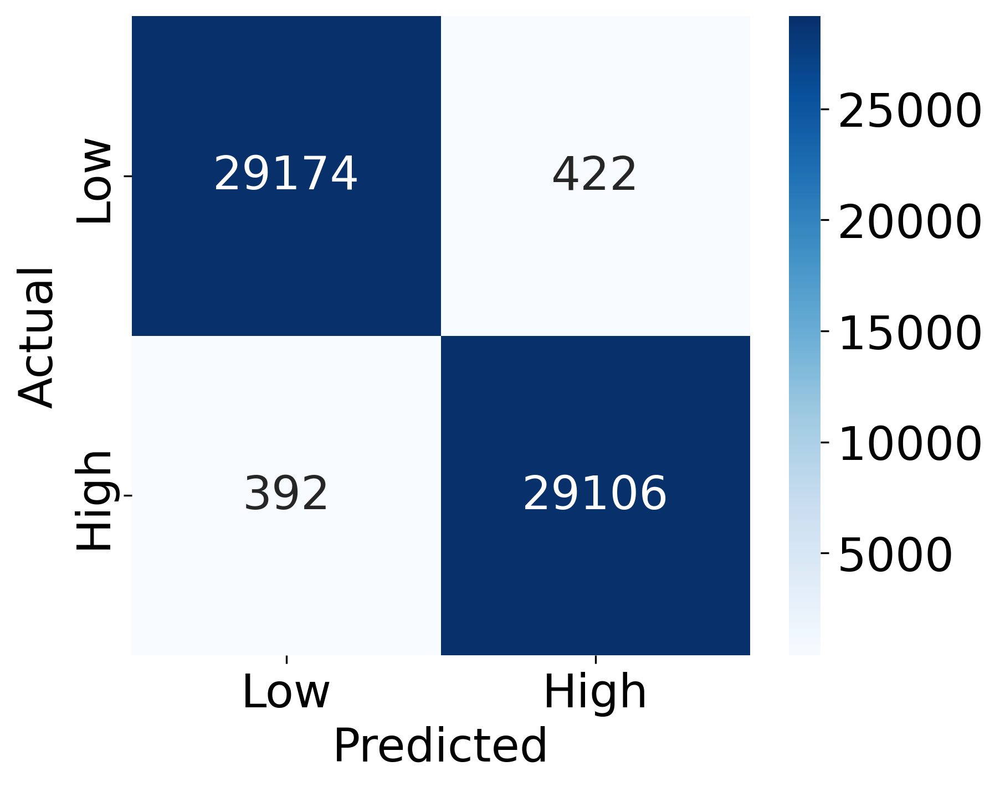

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming y_true and y_pred are already defined and possibly one-hot encoded
y_true = np.array(y_test)
y_pred = model_loaded.predict(x_test)

# If y_true or y_pred are one-hot encoded, flatten them
y_true = np.argmax(y_true, axis=1)  # Convert to label indices if one-hot encoded
y_pred = np.argmax(y_pred, axis=1)  # Convert to label indices if one-hot encoded

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot confusion matrix using Seaborn heatmap
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Low', 'High'], yticklabels=['Low', 'High'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
# plt.title('Confusion Matrix')
plt.show()

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step


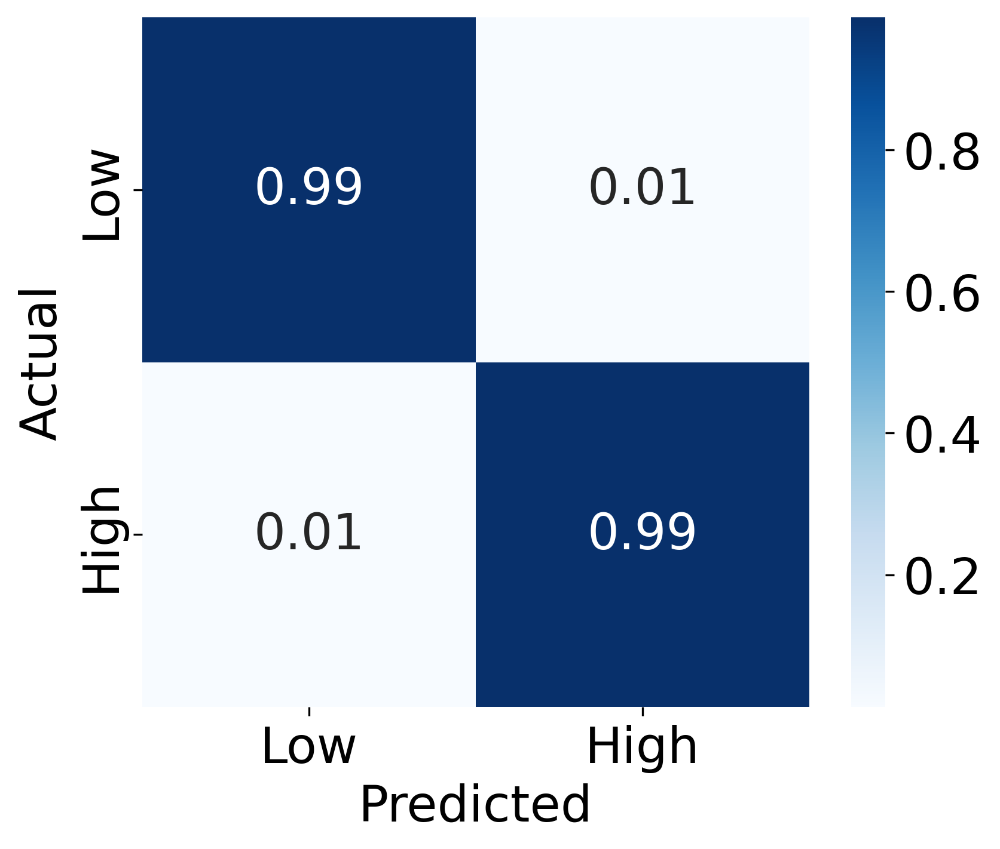

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming y_true and y_pred are already defined and possibly one-hot encoded
y_true = np.array(y_test)
y_pred = model_loaded.predict(x_test)

# If y_true or y_pred are one-hot encoded, flatten them
y_true = np.argmax(y_true, axis=1)  # Convert to label indices if one-hot encoded
y_pred = np.argmax(y_pred, axis=1)  # Convert to label indices if one-hot encoded

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot normalized confusion matrix using Seaborn heatmap
plt.figure(figsize=(6, 5))
ax = sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues',
                 xticklabels=['Low', 'High'],
                 yticklabels=['Low', 'High'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
#plt.title('Normalized Confusion Matrix')
plt.show()

# Liking

In [ ]:
# Importing Dataset
train = pd.read_csv('/content/drive/Shareddrives/Best Shared Drive Ever/EEG/AMIGO data/Pre-processed/train_data.csv')
test = pd.read_csv('/content/drive/Shareddrives/Best Shared Drive Ever/EEG/AMIGO data/Pre-processed/test_data.csv')

In [ ]:
train = train.dropna()

In [ ]:
test = test.dropna()

In [ ]:
# Rename the column 'Dominance' to 'Dominancencoded_e'
train.rename(columns={'Domain': 'Dominance'}, inplace=True)
test.rename(columns={'Domain': 'Dominance'}, inplace=True)

<ipython-input-261-e6ef128ed694>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train.rename(columns={'Domain': 'Dominance'}, inplace=True)


In [ ]:
# Rename the column 'Liking' to 'Liking'
train.rename(columns={'Like': 'Liking'}, inplace=True)
test.rename(columns={'Like': 'Liking'}, inplace=True)

<ipython-input-262-4a264b00db60>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train.rename(columns={'Like': 'Liking'}, inplace=True)


In [ ]:
# Copy the original dataset
encoded_train = train.copy()

# List of columns to modify
# columns_to_modify = ['Valence', 'Arousal', 'Dominance', 'Liking']
columns_to_modify = ['Liking']

# Apply the transformation: 1-4.99 becomes 0, everything else becomes 1
encoded_train[columns_to_modify] = encoded_train[columns_to_modify].applymap(
    lambda x: 0 if 1 <= x <= 4.99 else 1
)

<ipython-input-263-34eb30765121>:9: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  encoded_train[columns_to_modify] = encoded_train[columns_to_modify].applymap(


In [ ]:
# Replace 9 with 8.99 in specified columns
columns_to_update = ['Valence', 'Arousal', 'Dominance']
encoded_train[columns_to_update] = encoded_train[columns_to_update].replace(9, 8.99)

In [ ]:
# Copy
encoded_test = test.copy()

# List of columns to modify
#columns_to_modify = ['Valence', 'Arousal', 'Dominance', 'Liking']
columns_to_modify = ['Liking']

# Apply the transformation: 1-4.99 becomes 0, 5-9 becomes 1
encoded_test[columns_to_modify] = encoded_test[columns_to_modify].applymap(
    lambda x: 0 if 1 <= x <= 4.99 else 1
)

<ipython-input-265-c53079a4d20e>:9: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  encoded_test[columns_to_modify] = encoded_test[columns_to_modify].applymap(


In [ ]:
# Replace 9 with 8.99 in specified columns
columns_to_update = ['Valence', 'Arousal', 'Dominance']
encoded_test[columns_to_update] = encoded_test[columns_to_update].replace(9, 8.99)

## Train-Test Split

### Liking

In [ ]:
# Labeling
X_train = encoded_train.drop(['Valence', 'Arousal', 'Dominance', 'Liking'], axis=1) # Input features
Y_train = encoded_train['Liking'] # Target label

x_test = encoded_test.drop(['Valence', 'Arousal', 'Dominance', 'Liking'], axis=1) # Input features
y_test = encoded_test['Liking'] # Target label

In [ ]:
# Train Count
print(Y_train.value_counts())

Liking
1    119658
0     57624
Name: count, dtype: int64


In [ ]:
# Train Count
print(y_test.value_counts())

Liking
1    39886
0    19208
Name: count, dtype: int64


### Deep Learning Algorithms

In [ ]:
# Fit the train and test data with StandarScaler

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
x_test = scaler.fit_transform(x_test)

In [ ]:
from tensorflow.keras.utils import to_categorical

# Reshape the input data
X_train = np.expand_dims(X_train, axis=-1)
x_test = np.expand_dims(x_test, axis=-1)

# One-hot encode the labels
Y_train = to_categorical(Y_train, num_classes=2)
y_test = to_categorical(y_test, num_classes=2)

## Proposed

Model: "functional_41"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7       │ (None, 85, 1)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_37 (Conv1D)  │ (None, 85, 32)    │        224 │ input_layer_7[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 85, 32)    │        128 │ conv1d_37[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_24       │ (None, 85, 32)    │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_38 (Conv1D)  │ (None, 85, 32)    │      6,176 │ activation_24[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_39 (Conv1D)  │ (None, 85, 32)    │         64 │ input_layer_7[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 85, 32)    │        128 │ conv1d_38[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_12 (Add)        │ (None, 85, 32)    │          0 │ conv1d_39[0][0],  │
│                     │                   │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_25       │ (None, 85, 32)    │          0 │ add_12[0][0]      │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_13    │ (None, 42, 32)    │          0 │ activation_25[0]… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_40 (Conv1D)  │ (None, 42, 64)    │     12,352 │ max_pooling1d_13… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 42, 64)    │        256 │ conv1d_40[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_26       │ (None, 42, 64)    │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_41 (Conv1D)  │ (None, 42, 64)    │     24,640 │ activation_26[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_42 (Conv1D)  │ (None, 42, 64)    │      2,112 │ max_pooling1d_13… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 42, 64)    │        256 │ conv1d_41[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_13 (Add)        │ (None, 42, 64)    │          0 │ conv1d_42[0][0],  │
│                     │                   │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_27       │ (None, 42, 64)    │          0 │ add_13[0][0]      │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_14    │ (None, 21, 64)    │          0 │ activation_27[0]

 Total params: 1,003,170 (3.83 MB)

 Trainable params: 1,001,250 (3.82 MB)

 Non-trainable params: 1,920 (7.50 KB)

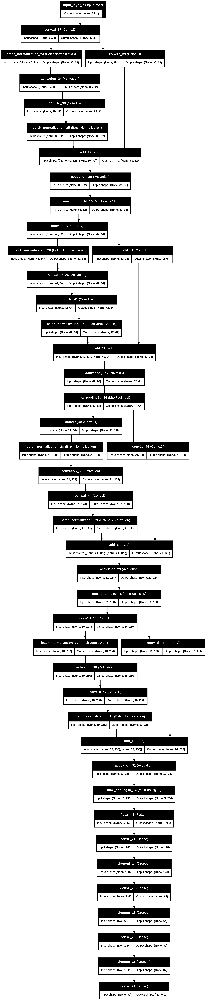

In [ ]:
from keras.layers import Input, Conv1D, BatchNormalization, MaxPooling1D, Flatten, Dense, Dropout, concatenate, Add, Activation
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.utils import plot_model

# Input shape
input_shape = (X_train.shape[1], 1)

# Input layer
input_layer = Input(input_shape)

# Residual block function
def residual_block(x, filters, kernel_size, pool_size=2):
    shortcut = x
    conv = Conv1D(filters, kernel_size, padding='same', activation=None)(x)
    conv = BatchNormalization()(conv)
    conv = Activation('relu')(conv)
    conv = Conv1D(filters, kernel_size, padding='same', activation=None)(conv)
    conv = BatchNormalization()(conv)
    shortcut = Conv1D(filters, 1, padding='same', activation=None)(shortcut)  # Adjust dimensions
    x = Add()([shortcut, conv])
    x = Activation('relu')(x)
    x = MaxPooling1D(pool_size)(x)
    return x

# Build residual blocks
x = residual_block(input_layer, 32, 6)
x = residual_block(x, 64, 6)
x = residual_block(x, 128, 6)
x = residual_block(x, 256, 6)

# Global average pooling for better generalization
gap = Flatten()(x)

# Fully connected layers
dense1 = Dense(128, activation='relu')(gap)
drop1 = Dropout(0.25)(dense1)

dense2 = Dense(64, activation='relu')(drop1)
drop2 = Dropout(0.25)(dense2)

dense3 = Dense(32, activation='relu')(drop2)
drop3 = Dropout(0.25)(dense3)

# Output layer
output_layer = Dense(2, activation='softmax')(drop3)

# Build the model
model = Model(input_layer, output_layer)
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Model summary
model.summary()

# Plot the model architecture
plot_model(model, to_file='enhanced_model_plot.png', show_shapes=True, show_layer_names=True)

In [ ]:
from tensorflow import keras

# Compile the model
model.compile(loss=keras.losses.categorical_crossentropy,
              optimizer='adam',
              metrics=['accuracy'])

In [ ]:
# check points and early stopping
from keras.callbacks import ModelCheckpoint,EarlyStopping

model_name = "CNN"
filepath = "/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Liking/History/" + model_name + "weights-improvement-{epoch:02d}-{accuracy:.4f}.keras"
print(filepath)
checkpoint = ModelCheckpoint(filepath, monitor='accuracy', verbose=1, save_best_only=True, mode='max')
es = EarlyStopping(monitor='accuracy', mode='max', verbose=1, patience=10)
callbacks_list = [es, checkpoint]

/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Liking/History/CNNweights-improvement-{epoch:02d}-{accuracy:.4f}.keras


In [ ]:

# Train the model
H = model.fit(X_train, Y_train,
          batch_size=100,
          epochs=100,
          verbose=1,
          validation_data=(x_test, y_test),
          callbacks= callbacks_list)


Epoch 1/100
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6933 - loss: 0.5880
Epoch 1: accuracy improved from -inf to 0.74020, saving model to /content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Liking/History/CNNweights-improvement-01-0.7402.keras
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 38s 13ms/step - accuracy: 0.6933 - loss: 0.5879 - val_accuracy: 0.8156 - val_loss: 0.3882
Epoch 2/100
1770/1773 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8390 - loss: 0.3516
Epoch 2: accuracy improved from 0.74020 to 0.85680, saving model to /content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Liking/History/CNNweights-improvement-02-0.8568.keras
1773/1773 ━━━━━━━━━━━━━━━━━━━━ 26s 8ms/step - accuracy: 0.8391 - loss: 0.3516 - val_accuracy: 0.8891 - val_loss: 0.2568
Epoch 3/100
1767/1773 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9066 - loss: 0.2266
Epoch 3: accuracy improved from 0.85680 to 0.91290, saving model to /conte

In [ ]:

from keras.models import save_model

model.save("/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Liking/model.h5")


In [ ]:
from keras.models import load_model

model_loaded = load_model("/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Liking/model.h5")

In [ ]:
# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(x_test, y_test, verbose=1)

# Print the test accuracy
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.9816 - loss: 0.0740
Test Accuracy: 98.30%


In [ ]:
score = model.evaluate(x_test, y_test, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.9816 - loss: 0.0740
Test loss: 0.06693973392248154
Test accuracy: 0.9829593300819397


In [ ]:
from sklearn.metrics import accuracy_score

# Get model predictions
y_pred = model_loaded.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convert probabilities to class predictions
y_true = np.argmax(y_test, axis=1)          # Convert one-hot encoded labels to class indices

# Compute accuracy for each class
class_accuracies = {}
for class_label in np.unique(y_true):
    indices = np.where(y_true == class_label)
    class_accuracy = accuracy_score(y_true[indices], y_pred_classes[indices])
    class_accuracies[class_label] = class_accuracy

# Print the test accuracies
for class_label, accuracy in class_accuracies.items():
    print(f'Test Accuracy for Class {class_label}: {accuracy * 100:.2f}%')

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step
Test Accuracy for Class 0: 97.56%
Test Accuracy for Class 1: 98.65%


In [ ]:

import pickle

# Specify the correct file path
history_file_path = '/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Liking/History/history.pkl'

# Save the model history to the file
with open(history_file_path, 'wb') as file_pi:
    pickle.dump(H, file_pi)


In [ ]:
import pickle

# Correct path with file name and extension
history_filepath = '/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Liking/History/history.pkl'

# Load the history from the file
with open(history_filepath, 'rb') as file:
    load_history = pickle.load(file)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 50 variables whereas the saved optimizer has 98 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


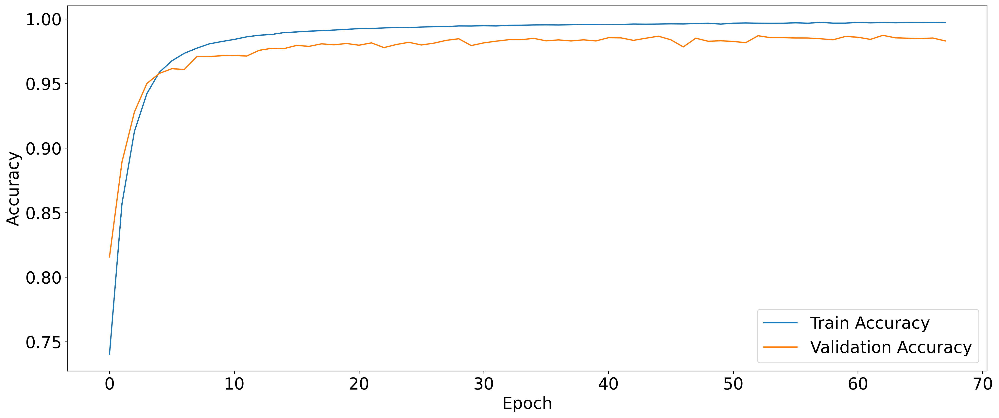

In [ ]:
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (20, 8)
plt.rcParams["font.size"] = 20

# Access accuracy and validation accuracy using the 'history' attribute
plt.plot(load_history.history['accuracy'], label='Train Accuracy')
plt.plot(load_history.history['val_accuracy'], label='Validation Accuracy')

#plt.title('CNN Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
plt.show()

In [ ]:
from keras.models import load_model

model_loaded = load_model("/content/drive/Shareddrives/Best Shared Drive Ever/Simon-personal/EEG-Brain/AMIGO/Model/Liking/model.h5")

In [ ]:
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Define the number of bootstrap iterations
n_bootstraps = 10
confidence_level = 0.95

# Function to calculate confidence intervals
def calculate_confidence_interval(data, confidence=0.95):
    lower_percentile = (1 - confidence) / 2 * 100
    upper_percentile = (1 + confidence) / 2 * 100
    lower_bound = np.percentile(data, lower_percentile)
    upper_bound = np.percentile(data, upper_percentile)
    return lower_bound, upper_bound

# Perform bootstrap
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

for _ in range(n_bootstraps):
    # Resample with replacement from the test set
    indices = np.random.choice(range(len(x_test)), size=len(x_test), replace=True)
    x_resampled = x_test[indices]
    y_resampled = y_test[indices]

    # Make predictions on the resampled data
    predictions = model_loaded.predict(x_resampled)
    y_pred = np.argmax(predictions, axis=1)  # Convert to class labels if needed

    # Ensure y_resampled is also in label format (convert if necessary)
    if y_resampled.ndim > 1 and y_resampled.shape[1] > 1:  # If one-hot encoded
        y_resampled = np.argmax(y_resampled, axis=1)

    # Calculate metrics
    accuracy_scores.append(accuracy_score(y_resampled, y_pred))
    precision_scores.append(precision_score(y_resampled, y_pred, average='weighted'))
    recall_scores.append(recall_score(y_resampled, y_pred, average='weighted'))
    f1_scores.append(f1_score(y_resampled, y_pred, average='weighted'))

# Calculate confidence intervals
accuracy_ci = calculate_confidence_interval(accuracy_scores, confidence=confidence_level)
precision_ci = calculate_confidence_interval(precision_scores, confidence=confidence_level)
recall_ci = calculate_confidence_interval(recall_scores, confidence=confidence_level)
f1_ci = calculate_confidence_interval(f1_scores, confidence=confidence_level)

# Print results
print(f"Confidence interval for accuracy: {accuracy_ci[0]:.4f} - {accuracy_ci[1]:.4f}")
print(f"Confidence interval for precision: {precision_ci[0]:.4f} - {precision_ci[1]:.4f}")
print(f"Confidence interval for recall: {recall_ci[0]:.4f} - {recall_ci[1]:.4f}")
print(f"Confidence interval for F1 score: {f1_ci[0]:.4f} - {f1_ci[1]:.4f}")

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step
1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step
Confidence interval for accuracy: 0.9823 - 0.9834
Confidence interval for precision: 0.9823 - 0.9835
Confidence interval for recall: 0.9823 - 0.9834
Confidence interval for F1 score: 0.9823 - 0.9834


In [ ]:
from keras.models import load_model

score = model_loaded.evaluate(x_test, y_test, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.9816 - loss: 0.0740
Test loss: 0.06693973392248154
Test accuracy: 0.9829593300819397


In [ ]:
y_true = np.array(y_test)
y_pred = model_loaded.predict(x_test)

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step


In [ ]:
y_pred = np.squeeze(y_pred)
y_pred = np.array(y_pred >= 0.5, dtype=int)  # Use 'int' instead of 'np.int'

from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.97      0.98      0.97     19208
           1       0.99      0.99      0.99     39886

   micro avg       0.98      0.98      0.98     59094
   macro avg       0.98      0.98      0.98     59094
weighted avg       0.98      0.98      0.98     59094
 samples avg       0.98      0.98      0.98     59094



1847/1847 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step


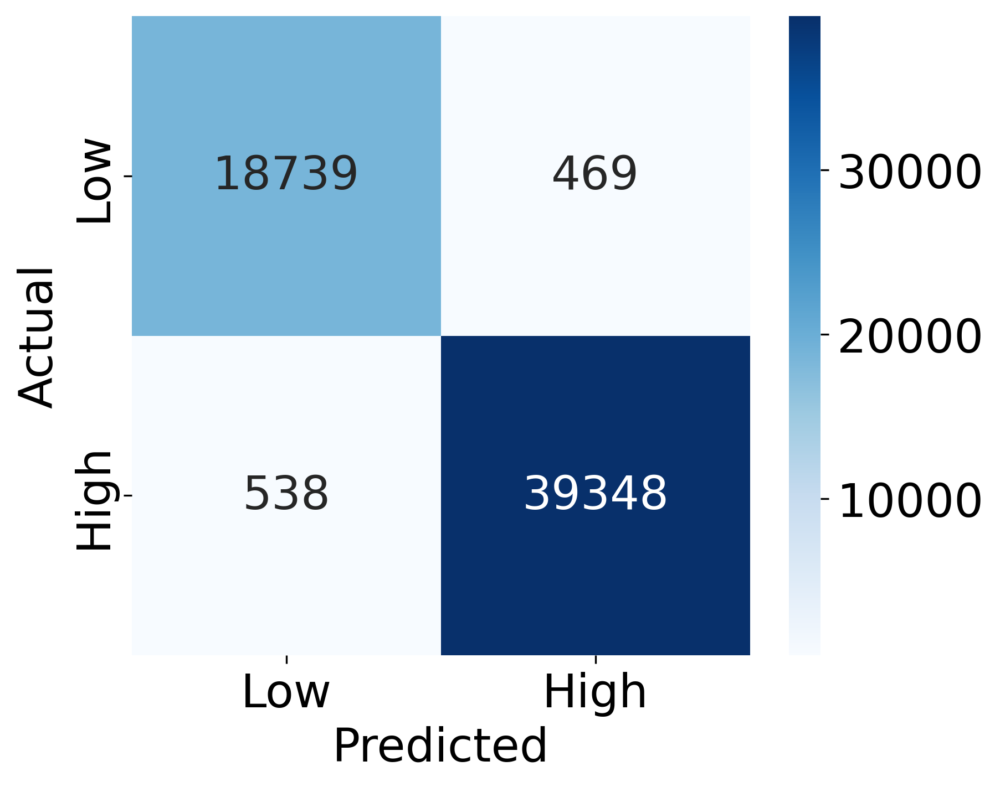

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming y_true and y_pred are already defined and possibly one-hot encoded
y_true = np.array(y_test)
y_pred = model_loaded.predict(x_test)

# If y_true or y_pred are one-hot encoded, flatten them
y_true = np.argmax(y_true, axis=1)  # Convert to label indices if one-hot encoded
y_pred = np.argmax(y_pred, axis=1)  # Convert to label indices if one-hot encoded

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot confusion matrix using Seaborn heatmap
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Low', 'High'], yticklabels=['Low', 'High'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
# plt.title('Confusion Matrix')
plt.show()

1847/1847 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step


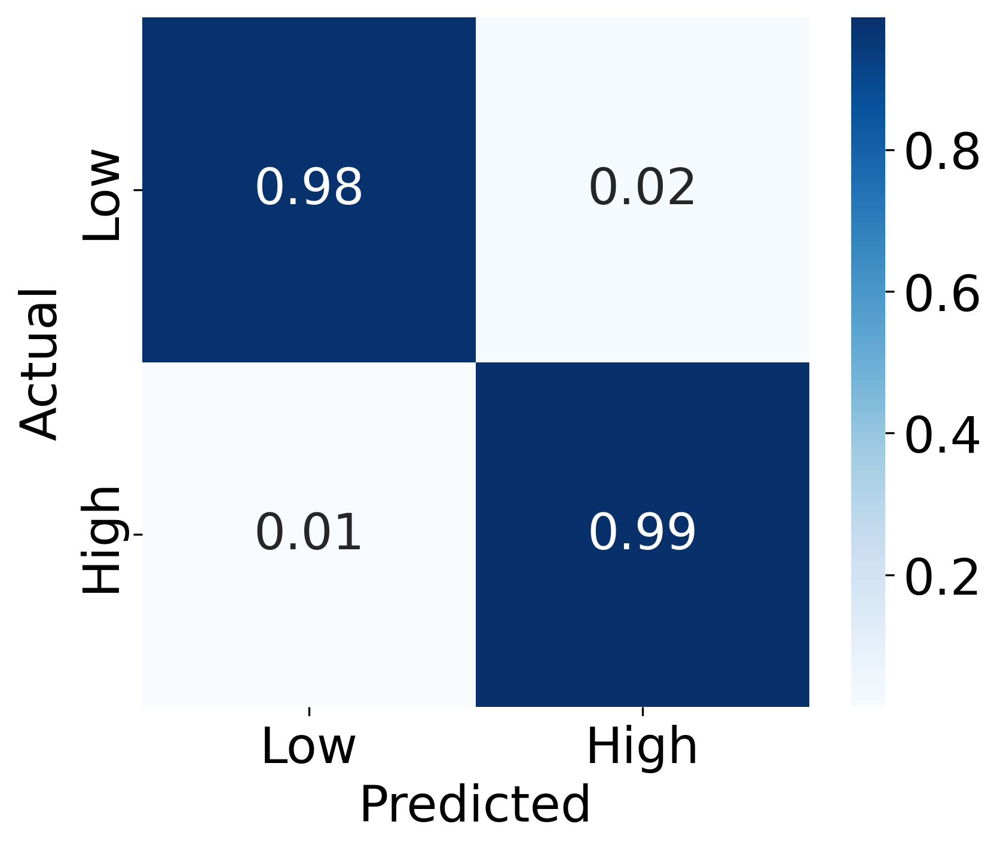

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming y_true and y_pred are already defined and possibly one-hot encoded
y_true = np.array(y_test)
y_pred = model_loaded.predict(x_test)

# If y_true or y_pred are one-hot encoded, flatten them
y_true = np.argmax(y_true, axis=1)  # Convert to label indices if one-hot encoded
y_pred = np.argmax(y_pred, axis=1)  # Convert to label indices if one-hot encoded

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot normalized confusion matrix using Seaborn heatmap
plt.figure(figsize=(6, 5))
ax = sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues',
                 xticklabels=['Low', 'High'],
                 yticklabels=['Low', 'High'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
#plt.title('Normalized Confusion Matrix')
plt.show()